In [2]:
%load_ext autoreload
%autoreload 2

In [12]:
import numpy as np
import pandas as pd
from n0ter_stats import * 
from n0_config_params import *
from n0bis_config_analysis_functions import *
import matplotlib.pyplot as plt
import seaborn as sns
import statsmodels.formula.api as smf
import statsmodels.api as sm

# FUNCTIONS

In [14]:
def get_ROI_counts(df):

    ROI_list = df['ROI'].unique()

    ROI_counts_plot = {}
    ROI_counts_sujet = {}

    for ROI in ROI_list:

        ROI_counts_plot[ROI] = 0
        ROI_counts_sujet[ROI] = len(df.query(f"ROI == '{ROI}'")['sujet'].unique())

        for sujet in df.query(f"ROI == '{ROI}'")['sujet'].unique():

            ROI_counts_plot[ROI] += df.query(f"ROI == '{ROI}' and sujet == '{sujet}'")['chan'].unique().shape[0]
        
    return ROI_counts_plot, ROI_counts_sujet

# Cxy MVL

In [5]:
os.chdir(os.path.join(path_results, 'allplot', 'df'))
df_Cxy_MVL = pd.read_excel(f'allplot_df_Cxy_MVL.xlsx', index_col = 0).drop(columns = 'Unnamed: 0')

## FR_CV

In [6]:
df_Cxy_MVL_FR_CV = df_Cxy_MVL.query(f"cond == 'FR_CV'")

In [7]:
df_Cxy_MVL_FR_CV

,sujet,cond,chan,ROI,Lobe,side,Cxy,Cxy_surr,MVL,MVL_surr
0,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,0.121550,0.164545,0.022024,0.106377
4,CHEe,FR_CV,Jp02,temporal sup,Temporal,l,0.060777,0.183396,0.016559,0.055216
8,CHEe,FR_CV,Jp03,temporal sup,Temporal,l,0.064677,0.166118,0.015829,0.047375
12,CHEe,FR_CV,Jp04,temporal sup,Temporal,l,0.138784,0.114733,0.005126,0.031938
16,CHEe,FR_CV,Jp05,temporal sup,Temporal,l,0.215872,0.114569,0.014608,0.035514
...,...,...,...,...,...,...,...,...,...,...
30,pat_03174_1634,FR_CV,TBa_4,pole temporal,Temporal,l,0.067847,0.178358,0.028294,0.055063
31,pat_03174_1634,FR_CV,TBa_5,temporal inf,Temporal,l,0.075822,0.153889,0.024662,0.054371
32,pat_03174_1634,FR_CV,TBa_6,temporal inf,Temporal,l,0.066333,0.151039,0.016728,0.058056
33,pat_03174_1634,FR_CV,TPol_3,pole temporal,Temporal,l,0.163420,0.182886,0.007846,0.045085


In [15]:
ROI_counts_plot, ROI_counts_sujet = get_ROI_counts(df_Cxy_MVL_FR_CV)

In [9]:
data_df = {'ROI' : [], 'Cxy_p' : [], 'MVL_p' : [], 'CxyMVL_p' : []}

for ROI in df_Cxy_MVL_FR_CV['ROI'].unique():
    
    signi = (df_Cxy_MVL_FR_CV.query(f"ROI == '{ROI}'")['Cxy'] > df_Cxy_MVL_FR_CV.query(f"ROI == '{ROI}'")['Cxy_surr']).sum()
    prop_Cxy = signi/ROI_counts_plot[ROI]

    signi = (df_Cxy_MVL_FR_CV.query(f"ROI == '{ROI}'")['MVL'] > df_Cxy_MVL_FR_CV.query(f"ROI == '{ROI}'")['MVL_surr']).sum()
    prop_MVL = signi/ROI_counts_plot[ROI]

    signi = ((df_Cxy_MVL_FR_CV.query(f"ROI == '{ROI}'")['Cxy'] > df_Cxy_MVL_FR_CV.query(f"ROI == '{ROI}'")['Cxy_surr']) & (df_Cxy_MVL_FR_CV.query(f"ROI == '{ROI}'")['MVL'] > df_Cxy_MVL_FR_CV.query(f"ROI == '{ROI}'")['MVL_surr'])).sum()
    prop_CxyMVL = signi/ROI_counts_plot[ROI]
    
    data_df['ROI'].append(ROI)
    data_df['Cxy_p'].append(prop_Cxy)
    data_df['MVL_p'].append(prop_MVL)
    data_df['CxyMVL_p'].append(prop_CxyMVL)

df_CxyMVL_p = pd.DataFrame(data_df) 
df_CxyMVL_p

,ROI,Cxy_p,MVL_p,CxyMVL_p
0,temporal sup,0.113208,0.028302,0.004717
1,amygdala,0.375000,0.270833,0.229167
2,temporal med,0.147059,0.049020,0.019608
3,hippocampus,0.141732,0.023622,0.007874
4,choroide plexus,0.000000,0.000000,0.000000
5,temporal inf,0.176923,0.030769,0.030769
6,parahippocampique,0.312500,0.000000,0.000000
7,pole temporal,0.114286,0.000000,0.000000
8,putamen,0.000000,0.000000,0.000000
9,insula post,0.176471,0.039216,0.039216


Text(0.5, 1.0, 'FR_CV Cxy_p')

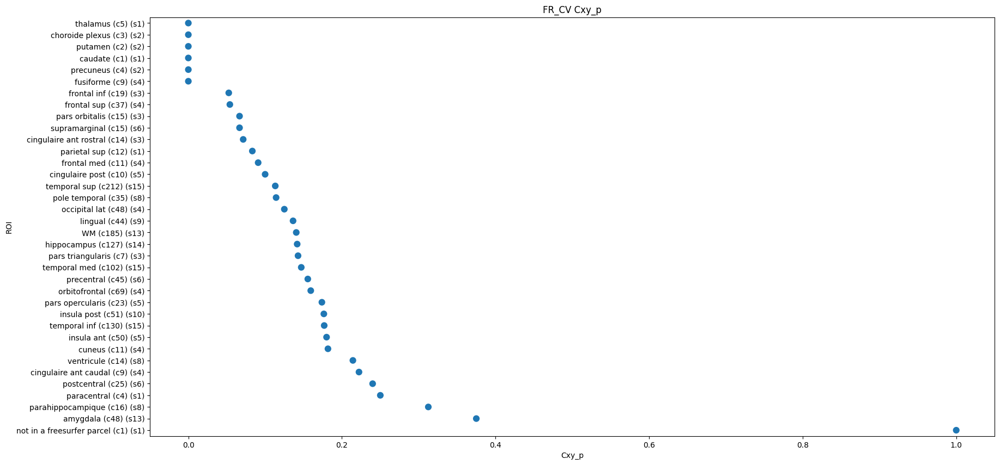

In [16]:
df_plot = df_CxyMVL_p

fig, ax = plt.subplots(figsize = (20,10))
g = sns.pointplot(data=df_plot , x='Cxy_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI)

ROI_labels = [f'{ROI} (c{ROI_counts_plot[ROI]}) (s{ROI_counts_sujet[ROI]})' for ROI_i, ROI in enumerate(df_plot.sort_values('Cxy_p').ROI.values)]

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')

ax.set_title('FR_CV Cxy_p')

Text(0.5, 1.0, 'FR_CV Cxy_p')

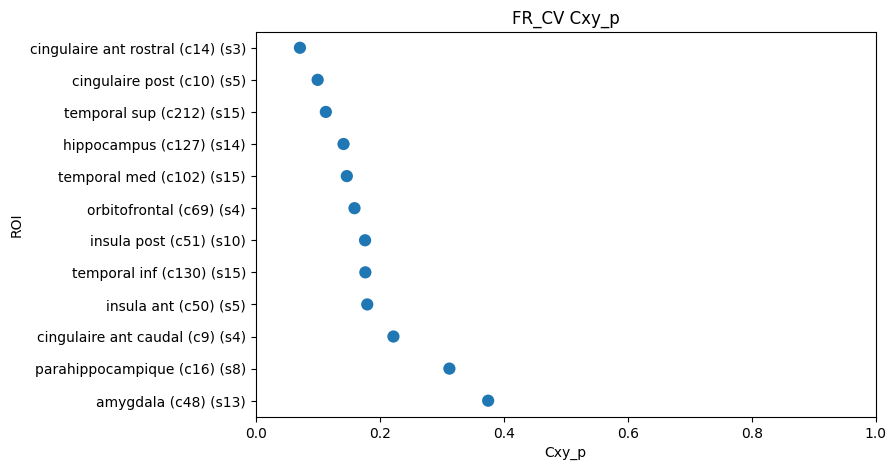

In [30]:
df_plot = df_CxyMVL_p.query(f"ROI in {ROI_for_DFC_plot}")

fig, ax = plt.subplots(figsize = (8,5))
g = sns.pointplot(data=df_plot , x='Cxy_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('Cxy_p').ROI)

ROI_labels = [f'{ROI} (c{ROI_counts_plot[ROI]}) (s{ROI_counts_sujet[ROI]})' for ROI_i, ROI in enumerate(df_plot.sort_values('Cxy_p').ROI.values)]

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
ax.set_xlim(0, 1)

ax.set_title('FR_CV Cxy_p')

Text(0.5, 1.0, 'FR_CV MVL_p')

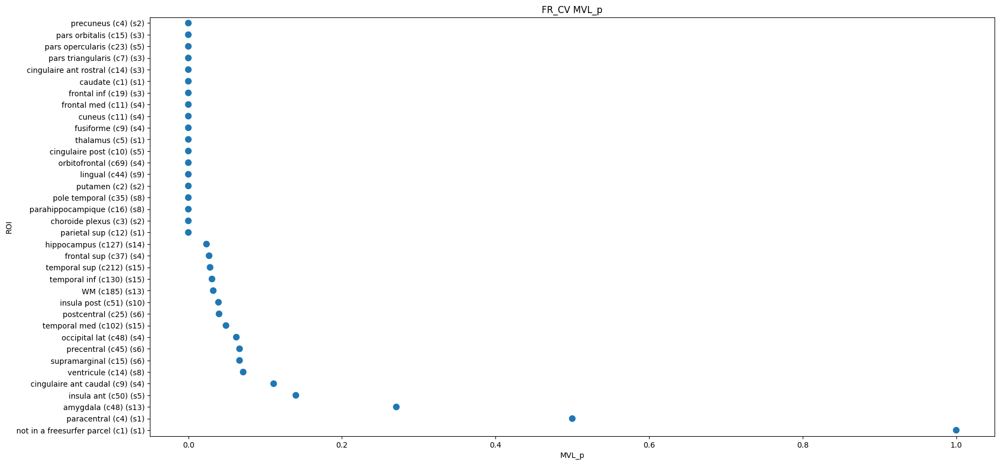

In [31]:
df_plot = df_CxyMVL_p

fig, ax = plt.subplots(figsize = (20,10))
g = sns.pointplot(data=df_plot , x='MVL_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('MVL_p').ROI)

ROI_labels = [f'{ROI} (c{ROI_counts_plot[ROI]}) (s{ROI_counts_sujet[ROI]})' for ROI_i, ROI in enumerate(df_plot.sort_values('MVL_p').ROI.values)]

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')

ax.set_title('FR_CV MVL_p')

Text(0.5, 1.0, 'FR_CV MVL_p')

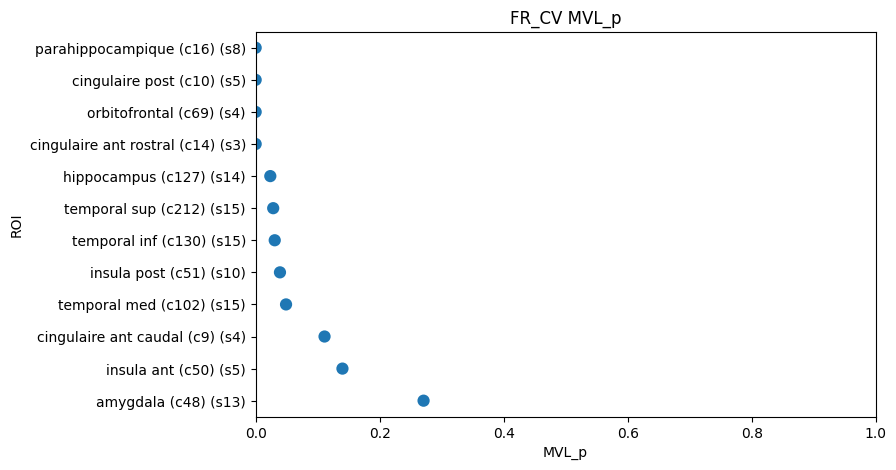

In [32]:
df_plot = df_CxyMVL_p.query(f"ROI in {ROI_for_DFC_plot}")

fig, ax = plt.subplots(figsize = (8,5))
g = sns.pointplot(data=df_plot , x='MVL_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('MVL_p').ROI)

ROI_labels = [f'{ROI} (c{ROI_counts_plot[ROI]}) (s{ROI_counts_sujet[ROI]})' for ROI_i, ROI in enumerate(df_plot.sort_values('MVL_p').ROI.values)]

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
ax.set_xlim(0, 1)

ax.set_title('FR_CV MVL_p')

Text(0.5, 1.0, 'FR_CV CxyMVL_p')

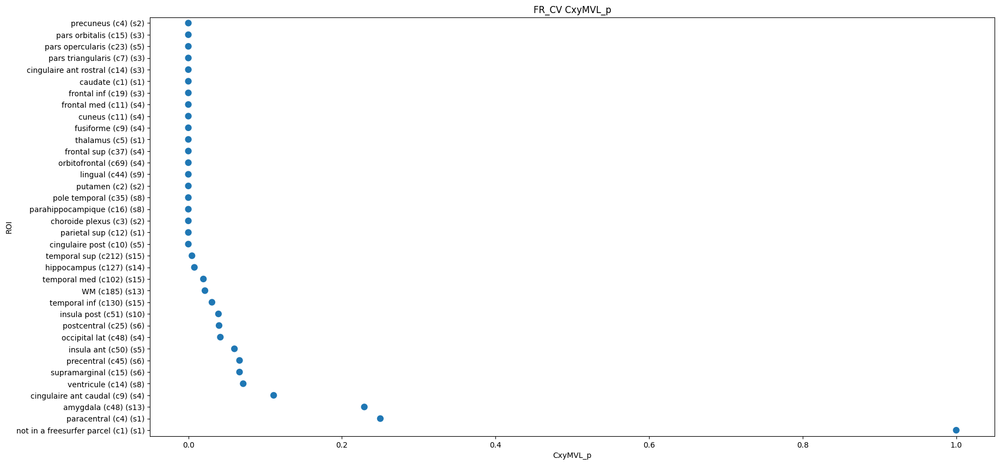

In [33]:
df_plot = df_CxyMVL_p

fig, ax = plt.subplots(figsize = (20,10))
g = sns.pointplot(data=df_plot , x='CxyMVL_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('CxyMVL_p').ROI)

ROI_labels = [f'{ROI} (c{ROI_counts_plot[ROI]}) (s{ROI_counts_sujet[ROI]})' for ROI_i, ROI in enumerate(df_plot.sort_values('CxyMVL_p').ROI.values)]

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')

ax.set_title('FR_CV CxyMVL_p')

Text(0.5, 1.0, 'FR_CV CxyMVL_p')

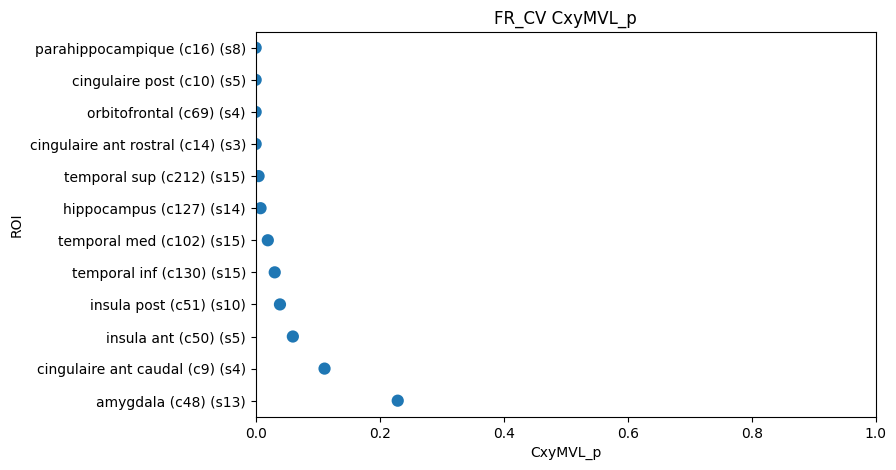

In [34]:
df_plot = df_CxyMVL_p.query(f"ROI in {ROI_for_DFC_plot}")

fig, ax = plt.subplots(figsize = (8,5))
g = sns.pointplot(data=df_plot , x='CxyMVL_p', y='ROI', ax=ax, join=False, order=df_plot.sort_values('CxyMVL_p').ROI)

ROI_labels = [f'{ROI} (c{ROI_counts_plot[ROI]}) (s{ROI_counts_sujet[ROI]})' for ROI_i, ROI in enumerate(df_plot.sort_values('CxyMVL_p').ROI.values)]

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
ax.set_xlim(0, 1)

ax.set_title('FR_CV CxyMVL_p')

## LMM

In [167]:
respfeatures = {}

for sujet in df_Cxy_MVL_FR_CV['sujet'].unique():

    respfeatures[sujet] = load_respfeatures(sujet)

data_resp_freq = []

for row_i in range(df_Cxy_MVL_FR_CV.shape[0]):

    _cond = df_Cxy_MVL_FR_CV.iloc[row_i,:]['cond']
    _sujet = df_Cxy_MVL_FR_CV.iloc[row_i,:]['sujet']

    if _cond == 'FR_CV':

        _resp_freq = np.round(np.median(respfeatures[_sujet][_cond][0].query(f"select == 1")['cycle_freq']), 3)

    else:

        _resp_freq = np.zeros((session_count[_cond]))

        for session_i in range(session_count[_cond]):

            _resp_freq[session_i] = np.round(np.median(respfeatures[_sujet][_cond][session_i].query(f"select == 1")['cycle_freq']), 3)

        _resp_freq = np.median(_resp_freq)
    
    data_resp_freq.append(_resp_freq)

df_Cxy_MVL_FR_CV['resp_freq'] = data_resp_freq

/tmp/ipykernel_977411/4192146678.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_Cxy_MVL_FR_CV['resp_freq'] = data_resp_freq


In [169]:
df_Cxy_MVL_FR_CV

,sujet,cond,chan,ROI,Lobe,side,Cxy,Cxy_surr,MVL,MVL_surr,resp_freq
0,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,0.121550,0.164545,0.022024,0.106377,0.219
4,CHEe,FR_CV,Jp02,temporal sup,Temporal,l,0.060777,0.183396,0.016559,0.055216,0.219
8,CHEe,FR_CV,Jp03,temporal sup,Temporal,l,0.064677,0.166118,0.015829,0.047375,0.219
12,CHEe,FR_CV,Jp04,temporal sup,Temporal,l,0.138784,0.114733,0.005126,0.031938,0.219
16,CHEe,FR_CV,Jp05,temporal sup,Temporal,l,0.215872,0.114569,0.014608,0.035514,0.219
...,...,...,...,...,...,...,...,...,...,...,...
30,pat_03174_1634,FR_CV,TBa_4,pole temporal,Temporal,l,0.067847,0.178358,0.028294,0.055063,0.185
31,pat_03174_1634,FR_CV,TBa_5,temporal inf,Temporal,l,0.075822,0.153889,0.024662,0.054371,0.185
32,pat_03174_1634,FR_CV,TBa_6,temporal inf,Temporal,l,0.066333,0.151039,0.016728,0.058056,0.185
33,pat_03174_1634,FR_CV,TPol_3,pole temporal,Temporal,l,0.163420,0.182886,0.007846,0.045085,0.185


In [232]:
data = {'ROI' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in ROI_for_DFC_plot:

    if ROI not in df_Cxy_MVL_FR_CV['ROI'].unique():

        continue

    else:

        _df_lmm = df_Cxy_MVL_FR_CV.query(f"ROI == '{ROI}'")[['Cxy', 'resp_freq']]

        x = _df_lmm['resp_freq']
        y = _df_lmm['Cxy']

        x = sm.add_constant(x)

        mdl = sm.OLS(y, x).fit()
        mdl_fit = mdl.predict(x) 

        coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
        intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
        pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]

        if pval < 0.05:

            p = 1

        else:

            p = 0

        data['ROI'].append(ROI)
        data['coeff'].append(coeff)
        data['intercept'].append(intercept)
        data['pval'].append(pval)
        data['p'].append(p)

        
        # fig, axs = plt.subplots(ncols=2, figsize=(10,5))

        # sns.histplot(mdl_fit.resid, ax=axs[0])
        # sm.qqplot(mdl_fit.resid, dist=stats.norm, line='s', ax=axs[1])

        # plt.suptitle(f"{ROI}")

        # fig.savefig(os.path.join(path_results, 'allplot', 'allcond', 'PSD_Coh', 'stats', f'{ROI}_qqplot_distrib_LMM_FR_CV_Cxy.png'))

        # plt.close()

        # plt.show()


df_lmm = pd.DataFrame(data)
df_lmm

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_stats_py.py:1772: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_stats_py.py:1772: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_stats_py.py:1772: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_stats_py.py:1772: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=9
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site

,ROI,coeff,intercept,pval,p
0,orbitofrontal,-0.7734,0.3065,0.009,1
1,cingulaire ant rostral,-0.9169,0.3012,0.683,0
2,cingulaire ant caudal,0.1771,0.0763,0.916,0
3,cingulaire post,1.0929,-0.1713,0.338,0
4,insula ant,-0.8768,0.3627,0.675,0
5,insula post,-0.1829,0.1616,0.561,0
6,parahippocampique,-0.1854,0.1875,0.495,0
7,amygdala,-0.0732,0.2103,0.845,0
8,hippocampus,-0.1199,0.1462,0.411,0
9,temporal inf,0.3146,0.0384,0.062,0


In [235]:
ROI_counts_plot, ROI_counts_sujet = get_ROI_counts(df_Cxy_MVL_FR_CV)

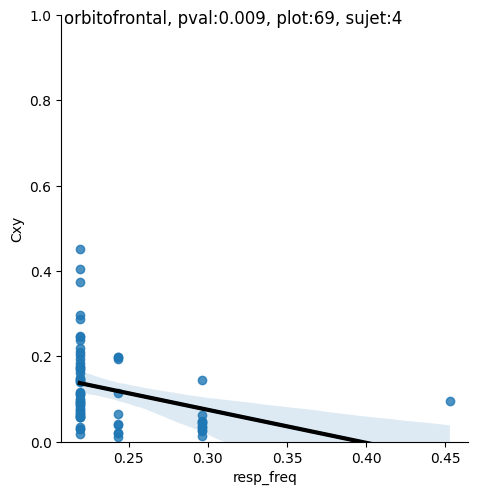

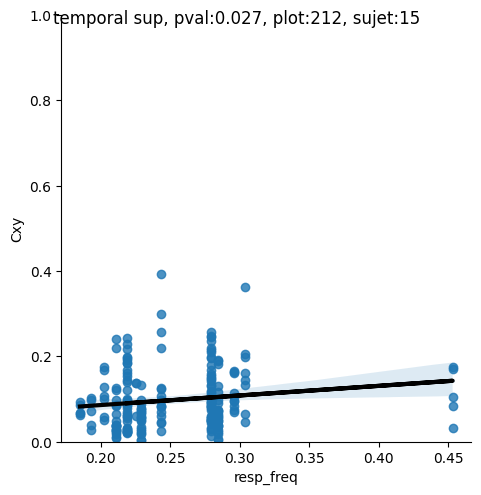

In [241]:
for ROI in ROI_for_DFC_plot:

    if ROI not in df_Cxy_MVL_FR_CV['ROI'].unique():

        continue

    else:

        _df_lmm = df_Cxy_MVL_FR_CV.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp_freq']]

        if df_lmm.query(f"ROI == '{ROI}'")['p'].values != 1:
            continue
        
        pval = df_lmm.query(f"ROI == '{ROI}'")['pval'].values[0]
        sns.lmplot(x="resp_freq", y="Cxy", data=_df_lmm)
        _ROI_mdl = _df_lmm['resp_freq'].values*df_lmm.query(f"ROI == '{ROI}'")['coeff'].values + df_lmm.query(f"ROI == '{ROI}'")['intercept'].values
        plt.ylim(0,1)
        plt.plot(_df_lmm['resp_freq'].values, _ROI_mdl, color='k', linewidth=3)
        plt.suptitle(f"{ROI}, pval:{pval}, plot:{ROI_counts_plot[ROI]}, sujet:{ROI_counts_sujet[ROI]}")

Text(0.5, 0.98, 'pval:0.814')

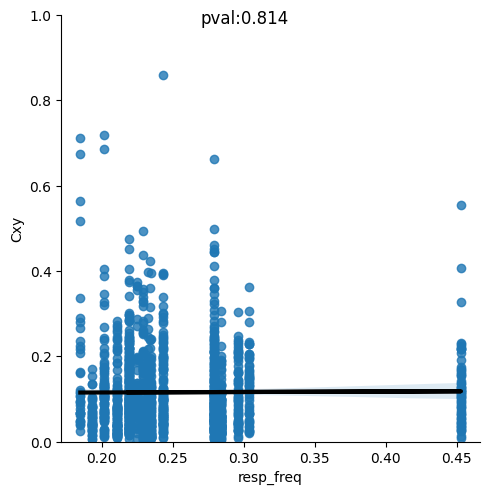

In [244]:
_df_lmm = df_Cxy_MVL_FR_CV[['Cxy', 'resp_freq']]

x = _df_lmm['resp_freq']
y = _df_lmm['Cxy']

x = sm.add_constant(x)

mdl = sm.OLS(y, x).fit()
mdl_fit = mdl.predict(x) 

coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]

sns.lmplot(x="resp_freq", y="Cxy", data=_df_lmm)
_ROI_mdl = _df_lmm['resp_freq'].values*coeff + intercept
plt.ylim(0,1)
plt.plot(_df_lmm['resp_freq'].values, _ROI_mdl, color='k', linewidth=3)
plt.suptitle(f"pval:{pval}")

## ALL CONDITIONS

In [177]:
df_allcond = df_Cxy_MVL.query(f"sujet in {sujet_list}")

In [182]:
respfeatures = {}

for sujet in df_allcond['sujet'].unique():

    respfeatures[sujet] = load_respfeatures(sujet)

data_resp_freq = []

for row_i in range(df_allcond.shape[0]):

    _cond = df_allcond.iloc[row_i,:]['cond']
    _sujet = df_allcond.iloc[row_i,:]['sujet']

    if _cond == 'FR_CV':

        _resp_freq = np.round(np.median(respfeatures[_sujet][_cond][0].query(f"select == 1")['cycle_freq']), 3)

    else:

        _resp_freq = np.zeros((session_count[_cond]))

        for session_i in range(session_count[_cond]):

            _resp_freq[session_i] = np.round(np.median(respfeatures[_sujet][_cond][session_i].query(f"select == 1")['cycle_freq']), 3)

        _resp_freq = np.median(_resp_freq)
    
    data_resp_freq.append(_resp_freq)

df_allcond['resp_freq'] = data_resp_freq

/tmp/ipykernel_977411/116324355.py:30: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_allcond['resp_freq'] = data_resp_freq


In [37]:
df_allcond

,sujet,cond,chan,ROI,Lobe,side,Cxy,Cxy_surr,MVL,MVL_surr,resp_freq
0,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,0.121550,0.164545,0.022024,0.106377,0.2190
1,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,0.347643,0.381086,0.017016,0.125105,0.2775
2,CHEe,RD_FV,Jp01,temporal sup,Temporal,l,0.305237,0.449840,0.010719,0.067418,0.4895
3,CHEe,RD_SV,Jp01,temporal sup,Temporal,l,0.200418,0.381668,0.032082,0.198721,0.1510
4,CHEe,FR_CV,Jp02,temporal sup,Temporal,l,0.060777,0.183396,0.016559,0.055216,0.2190
...,...,...,...,...,...,...,...,...,...,...,...
479,POTm,RD_SV,L11,temporal inf,Temporal,l,0.121662,0.291910,0.041078,0.042865,0.1490
480,POTm,FR_CV,L12,temporal inf,Temporal,l,0.100433,0.099419,0.020533,0.041443,0.2840
481,POTm,RD_CV,L12,temporal inf,Temporal,l,0.110292,0.178521,0.019196,0.039681,0.2810
482,POTm,RD_FV,L12,temporal inf,Temporal,l,0.108523,0.183243,0.017420,0.039802,0.5010


In [38]:
ROI_counts_plot, ROI_counts_sujet = get_ROI_counts(df_allcond)

In [40]:
data_df = {'cond' : [], 'ROI' : [], 'Cxy_p' : [], 'MVL_p' : [], 'CxyMVL_p' : []}

for cond in conditions:

    for ROI in df_allcond['ROI'].unique():
        
        signi = (df_allcond.query(f"cond == '{cond}' and ROI == '{ROI}'")['Cxy'] > df_allcond.query(f"cond == '{cond}' and ROI == '{ROI}'")['Cxy_surr']).sum()
        prop_Cxy = signi/ROI_counts_plot[ROI]

        signi = (df_allcond.query(f"cond == '{cond}' and ROI == '{ROI}'")['MVL'] > df_allcond.query(f"cond == '{cond}' and ROI == '{ROI}'")['MVL_surr']).sum()
        prop_MVL = signi/ROI_counts_plot[ROI]

        signi = ((df_allcond.query(f"cond == '{cond}' and ROI == '{ROI}'")['Cxy'] > df_allcond.query(f"cond == '{cond}' and ROI == '{ROI}'")['Cxy_surr']) & (df_allcond.query(f"cond == '{cond}' and ROI == '{ROI}'")['MVL'] > df_allcond.query(f"cond == '{cond}' and ROI == '{ROI}'")['MVL_surr'])).sum()
        prop_CxyMVL = signi/ROI_counts_plot[ROI]
        
        data_df['cond'].append(cond)
        data_df['ROI'].append(ROI)
        data_df['Cxy_p'].append(prop_Cxy)
        data_df['MVL_p'].append(prop_MVL)
        data_df['CxyMVL_p'].append(prop_CxyMVL)

df_CxyMVL_p = pd.DataFrame(data_df) 
df_CxyMVL_p

,cond,ROI,Cxy_p,MVL_p,CxyMVL_p
0,FR_CV,temporal sup,0.106383,0.063830,0.010638
1,FR_CV,amygdala,0.615385,0.461538,0.384615
2,FR_CV,temporal med,0.108108,0.054054,0.000000
3,FR_CV,hippocampus,0.172414,0.017241,0.000000
4,FR_CV,choroide plexus,0.000000,0.000000,0.000000
...,...,...,...,...,...
123,RD_SV,pars orbitalis,0.400000,0.200000,0.200000
124,RD_SV,pars triangularis,0.500000,0.000000,0.000000
125,RD_SV,cingulaire ant rostral,0.500000,0.125000,0.125000
126,RD_SV,frontal inf,0.750000,0.250000,0.250000


Text(0.5, 1.0, 'Cxy_p')

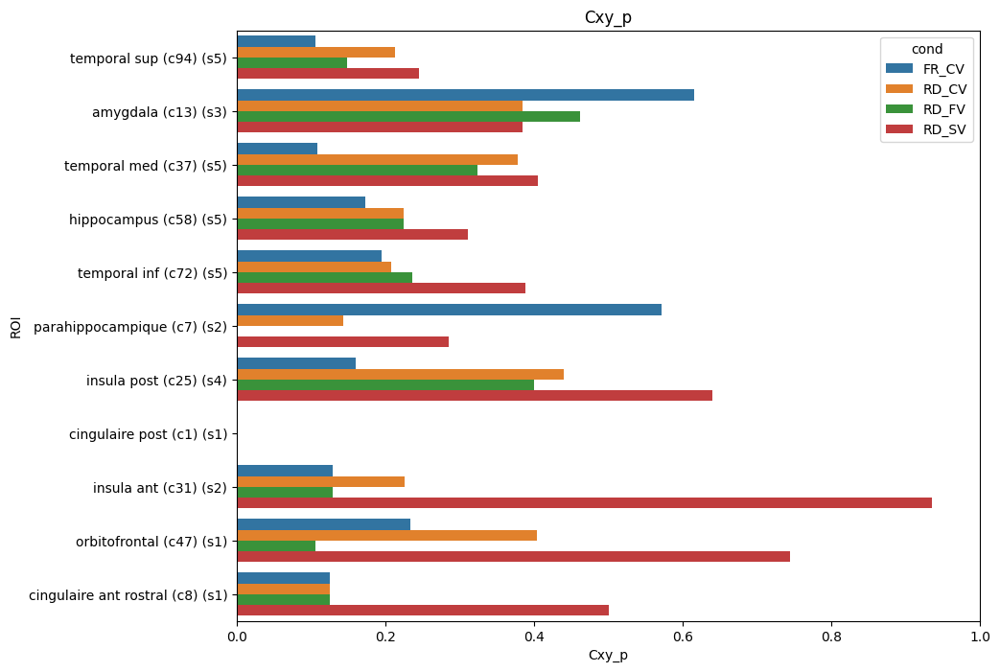

In [43]:
df_plot = df_CxyMVL_p.query(f"ROI in {ROI_for_DFC_plot}")

fig, ax = plt.subplots(figsize = (10,8))
g = sns.barplot(data=df_plot , x='Cxy_p', y='ROI', hue='cond', ax=ax)

ROI_labels = [f'{ROI} (c{ROI_counts_plot[ROI]}) (s{ROI_counts_sujet[ROI]})' for ROI_i, ROI in enumerate(df_plot['ROI'].unique())]

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
ax.set_xlim(0,1)

ax.set_title('Cxy_p')

Text(0.5, 1.0, 'MVL_p')

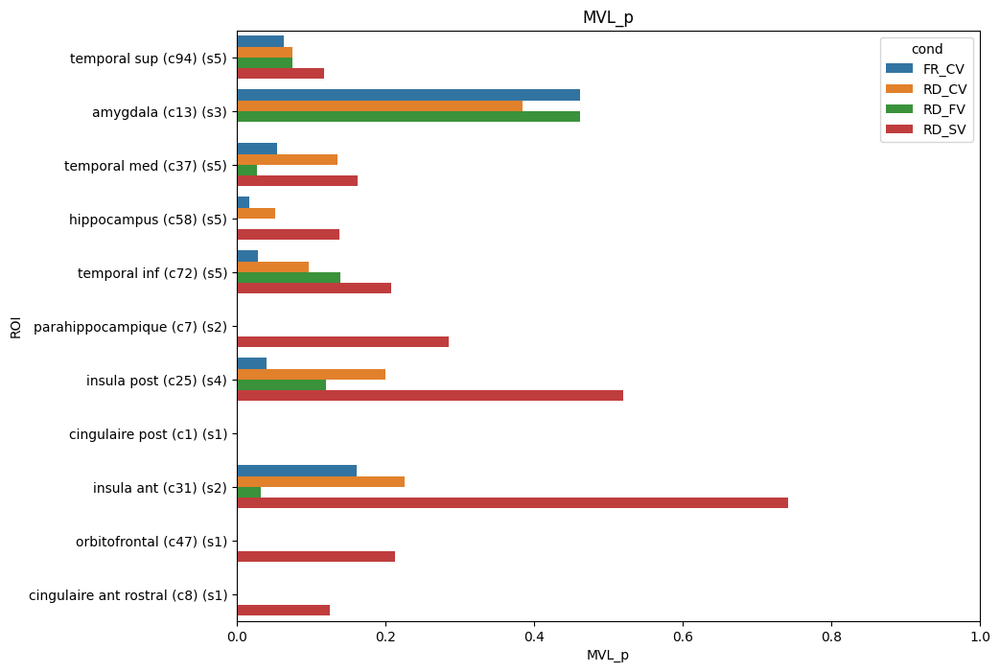

In [44]:
df_plot = df_CxyMVL_p.query(f"ROI in {ROI_for_DFC_plot}")

fig, ax = plt.subplots(figsize = (10,8))
g = sns.barplot(data=df_plot , x='MVL_p', y='ROI', hue='cond', ax=ax)

ROI_labels = [f'{ROI} (c{ROI_counts_plot[ROI]}) (s{ROI_counts_sujet[ROI]})' for ROI_i, ROI in enumerate(df_plot['ROI'].unique())]

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
ax.set_xlim(0,1)

ax.set_title('MVL_p')

Text(0.5, 1.0, 'CxyMVL_p')

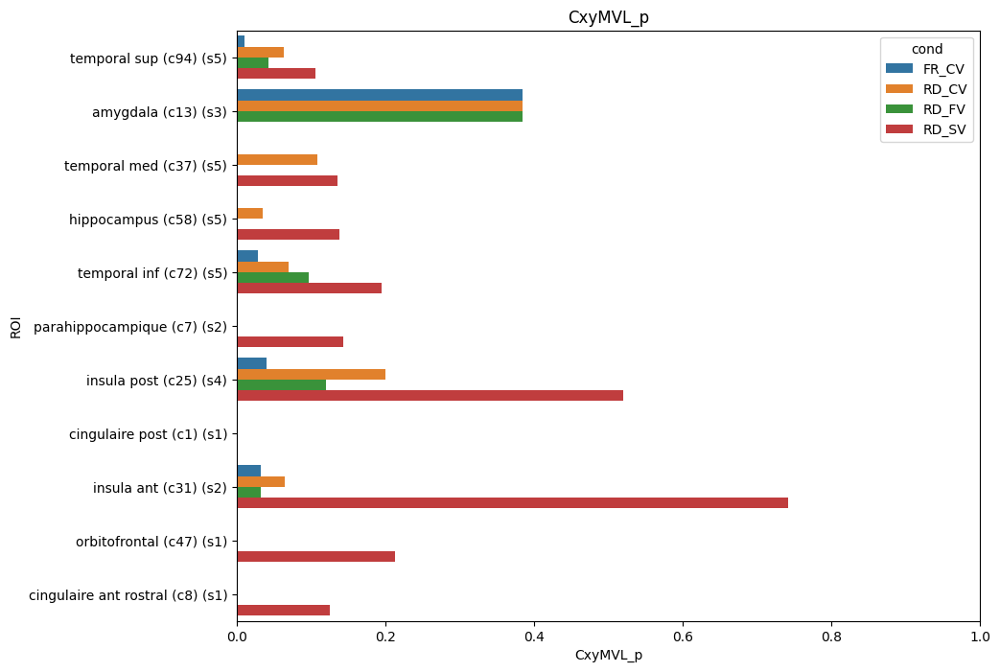

In [45]:
df_plot = df_CxyMVL_p.query(f"ROI in {ROI_for_DFC_plot}")

fig, ax = plt.subplots(figsize = (10,8))
g = sns.barplot(data=df_plot , x='CxyMVL_p', y='ROI', hue='cond', ax=ax)

ROI_labels = [f'{ROI} (c{ROI_counts_plot[ROI]}) (s{ROI_counts_sujet[ROI]})' for ROI_i, ROI in enumerate(df_plot['ROI'].unique())]

g.set_yticks(range(len(ROI_labels)))
g.set_yticklabels(ROI_labels)
ax.tick_params(axis='y')
ax.set_xlim(0,1)

ax.set_title('CxyMVL_p')

### LMM Cxy

In [181]:
df_allcond

,sujet,cond,chan,ROI,Lobe,side,Cxy,Cxy_surr,MVL,MVL_surr
0,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,0.121550,0.164545,0.022024,0.106377
1,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,0.347643,0.381086,0.017016,0.125105
2,CHEe,RD_FV,Jp01,temporal sup,Temporal,l,0.305237,0.449840,0.010719,0.067418
3,CHEe,RD_SV,Jp01,temporal sup,Temporal,l,0.200418,0.381668,0.032082,0.198721
4,CHEe,FR_CV,Jp02,temporal sup,Temporal,l,0.060777,0.183396,0.016559,0.055216
...,...,...,...,...,...,...,...,...,...,...
479,POTm,RD_SV,L11,temporal inf,Temporal,l,0.121662,0.291910,0.041078,0.042865
480,POTm,FR_CV,L12,temporal inf,Temporal,l,0.100433,0.099419,0.020533,0.041443
481,POTm,RD_CV,L12,temporal inf,Temporal,l,0.110292,0.178521,0.019196,0.039681
482,POTm,RD_FV,L12,temporal inf,Temporal,l,0.108523,0.183243,0.017420,0.039802


In [88]:
data = {'ROI' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in ROI_for_DFC_plot:

    if ROI not in df_allcond['ROI'].unique():

        continue

    else:

        _df_lmm = df_allcond.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp_freq']]

        mdl = smf.mixedlm("Cxy ~ resp_freq", data=_df_lmm, groups=_df_lmm['sujet'])
        mdl_fit = mdl.fit(method=["powell", "lbfgs"])

        coeff = float(mdl_fit.summary().tables[1]['Coef.'][1])
        pval = float(mdl_fit.summary().tables[1]['P>|z|'][1])
        intercept = float(mdl_fit.summary().tables[1]['Coef.'][0])

        if float(mdl_fit.summary().tables[1]['P>|z|'][1]) < 0.05:

            p = 1

        else:

            p = 0

        data['ROI'].append(ROI)
        data['coeff'].append(coeff)
        data['intercept'].append(intercept)
        data['pval'].append(pval)
        data['p'].append(p)

        
        fig, axs = plt.subplots(ncols=2, figsize=(10,5))

        sns.histplot(mdl_fit.resid, ax=axs[0])
        sm.qqplot(mdl_fit.resid, dist=stats.norm, line='s', ax=axs[1])

        plt.suptitle(f"{ROI}, plot:{ROI_counts_plot[ROI]}, sujet:{_df_lmm['sujet'].unique().shape[0]}")

        fig.savefig(os.path.join(path_results, 'allplot', 'allcond', 'PSD_Coh', 'stats', f'{ROI}_qqplot_distrib_LMM_Cxy.png'))

        plt.close()

        # plt.show()


df_lmm = pd.DataFrame(data)
df_lmm

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/home/ju

,ROI,coeff,intercept,pval,p
0,orbitofrontal,-0.398,0.370,0.000,1
1,cingulaire ant rostral,-0.108,0.255,0.599,0
2,cingulaire post,-0.323,0.198,0.280,0
3,insula ant,-0.834,0.532,0.000,1
4,insula post,-0.248,0.372,0.137,0
5,parahippocampique,-0.076,0.258,0.623,0
6,amygdala,0.281,0.265,0.012,1
7,hippocampus,-0.148,0.265,0.026,1
8,temporal inf,-0.203,0.290,0.006,1
9,temporal med,-0.154,0.290,0.092,0


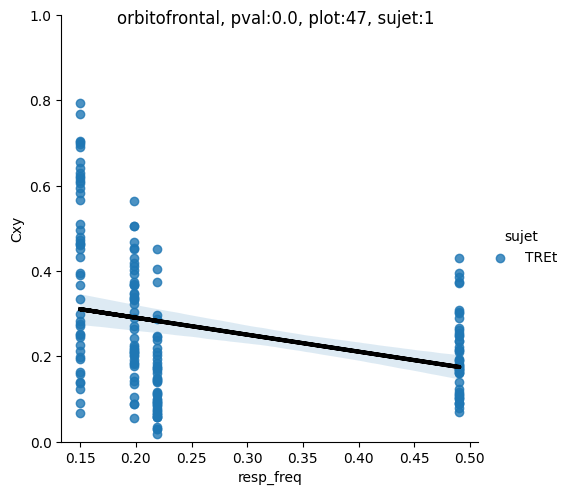

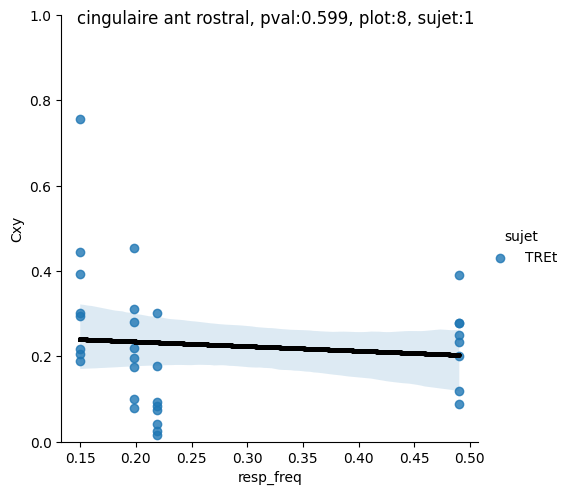

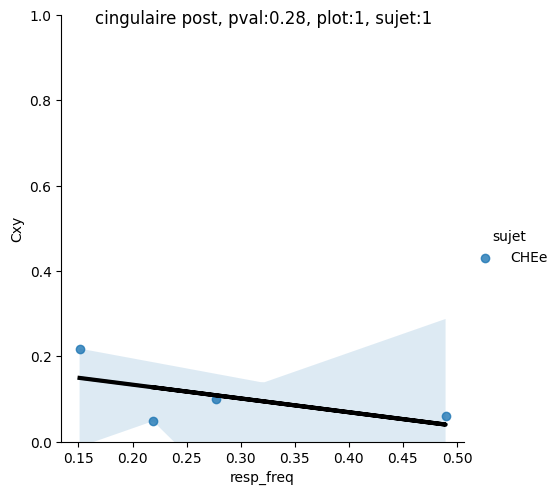

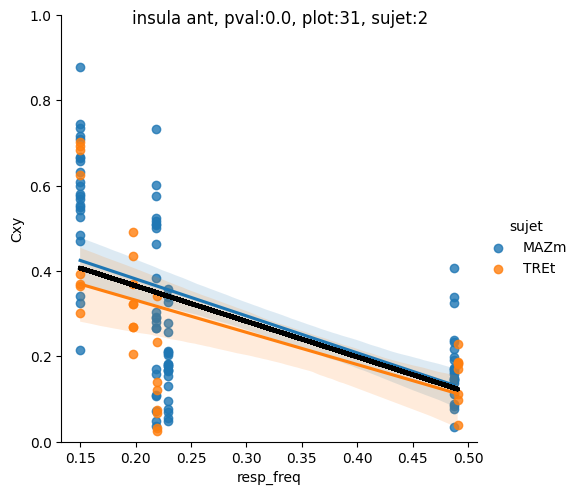

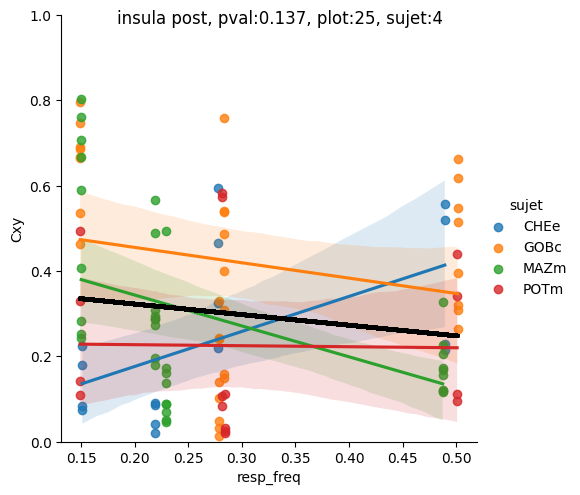

...

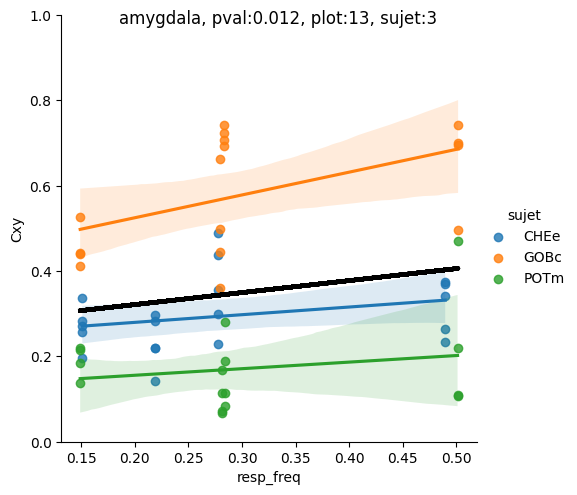

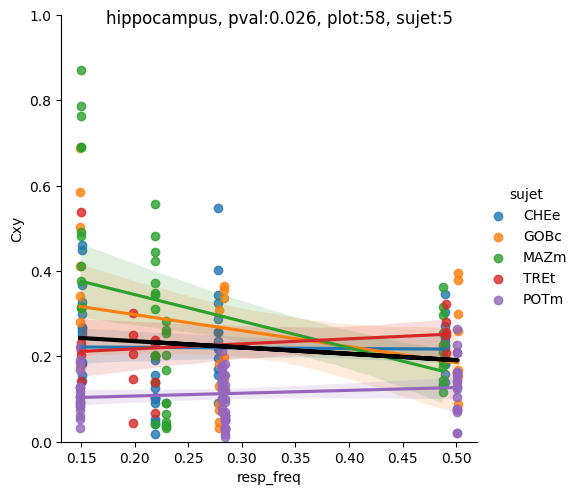

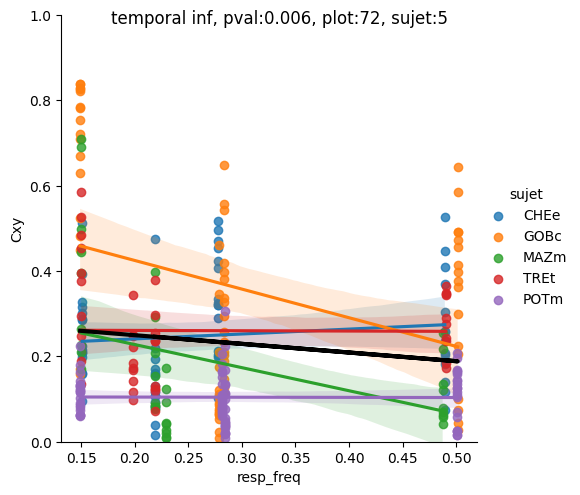

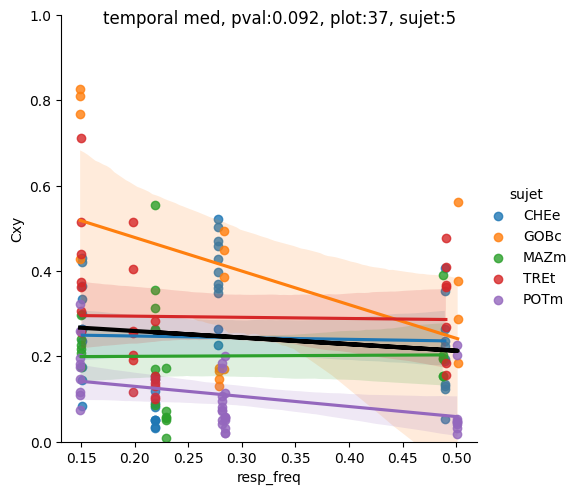

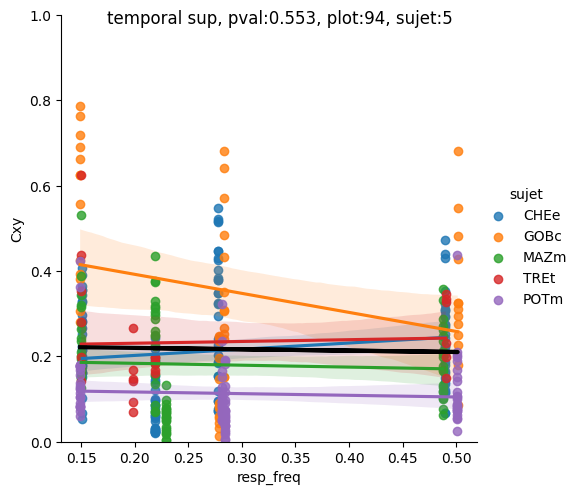

In [89]:
for ROI in ROI_for_DFC_plot:

    if ROI not in df_allcond['ROI'].unique():

        continue

    else:

        _df_lmm = df_allcond.query(f"ROI == '{ROI}'")[['sujet', 'Cxy', 'resp_freq']]
        
        pval = df_lmm.query(f"ROI == '{ROI}'")['pval'].values[0]
        sns.lmplot(x="resp_freq", y="Cxy", hue='sujet', data=_df_lmm)
        _ROI_mdl = _df_lmm['resp_freq'].values*df_lmm.query(f"ROI == '{ROI}'")['coeff'].values + df_lmm.query(f"ROI == '{ROI}'")['intercept'].values
        plt.ylim(0,1)
        plt.plot(_df_lmm['resp_freq'].values, _ROI_mdl, color='k', linewidth=3)
        plt.suptitle(f"{ROI}, pval:{pval}, plot:{ROI_counts_plot[ROI]}, sujet:{ROI_counts_sujet[ROI]}")
        

### allplot 

In [190]:
df_allcond 

,sujet,cond,chan,ROI,Lobe,side,Cxy,Cxy_surr,MVL,MVL_surr,resp_freq
0,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,0.121550,0.164545,0.022024,0.106377,0.2190
1,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,0.347643,0.381086,0.017016,0.125105,0.2775
2,CHEe,RD_FV,Jp01,temporal sup,Temporal,l,0.305237,0.449840,0.010719,0.067418,0.4895
3,CHEe,RD_SV,Jp01,temporal sup,Temporal,l,0.200418,0.381668,0.032082,0.198721,0.1510
4,CHEe,FR_CV,Jp02,temporal sup,Temporal,l,0.060777,0.183396,0.016559,0.055216,0.2190
...,...,...,...,...,...,...,...,...,...,...,...
479,POTm,RD_SV,L11,temporal inf,Temporal,l,0.121662,0.291910,0.041078,0.042865,0.1490
480,POTm,FR_CV,L12,temporal inf,Temporal,l,0.100433,0.099419,0.020533,0.041443,0.2840
481,POTm,RD_CV,L12,temporal inf,Temporal,l,0.110292,0.178521,0.019196,0.039681,0.2810
482,POTm,RD_FV,L12,temporal inf,Temporal,l,0.108523,0.183243,0.017420,0.039802,0.5010


In [191]:
ROI_counts_plot, ROI_counts_sujet = get_ROI_counts(df_allcond)

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Text(0.5, 0.98, 'pval:0.0')

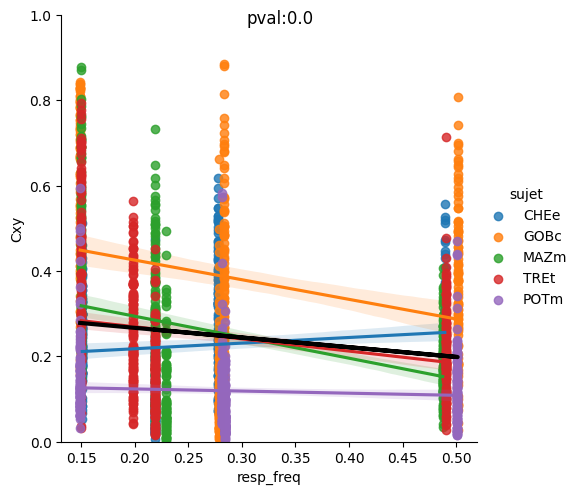

In [198]:
_df_lmm = df_allcond[['sujet', 'Cxy', 'resp_freq']]

mdl = smf.mixedlm("Cxy ~ resp_freq", data=_df_lmm, groups=_df_lmm['sujet'])
mdl_fit = mdl.fit(method=["powell", "lbfgs"])

coeff = float(mdl_fit.summary().tables[1]['Coef.'][1])
pval = float(mdl_fit.summary().tables[1]['P>|z|'][1])
intercept = float(mdl_fit.summary().tables[1]['Coef.'][0])


sns.lmplot(x="resp_freq", y="Cxy", hue='sujet', data=_df_lmm)
_ROI_mdl = _df_lmm['resp_freq'].values*coeff + intercept
plt.ylim(0,1)
plt.plot(_df_lmm['resp_freq'].values, _ROI_mdl, color='k', linewidth=3)
plt.suptitle(f"pval:{pval}")

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)


Text(0.5, 0.98, 'pval:0.0')

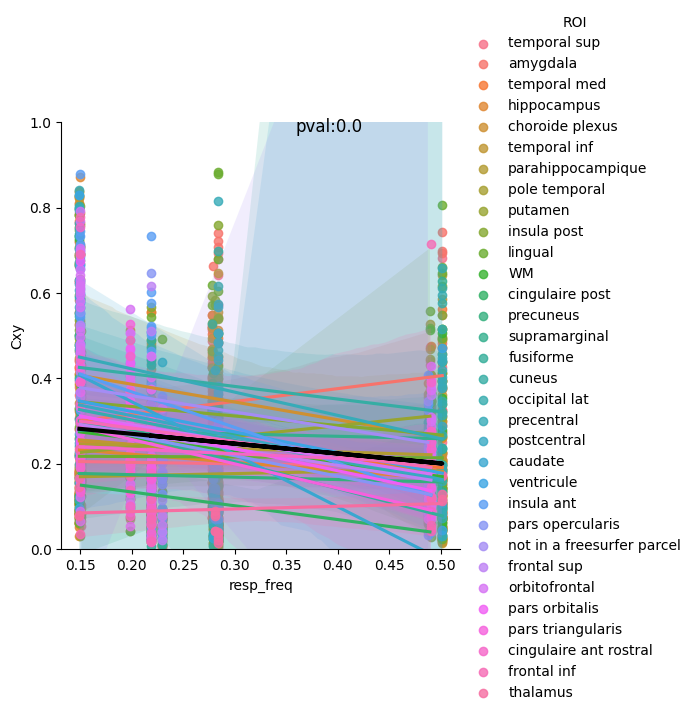

In [203]:
_df_lmm = df_allcond[['sujet', 'Cxy', 'resp_freq', 'ROI']]

mdl = smf.mixedlm("Cxy ~ resp_freq", data=_df_lmm, groups=_df_lmm['ROI'])
mdl_fit = mdl.fit(method=["powell", "lbfgs"])

coeff = float(mdl_fit.summary().tables[1]['Coef.'][1])
pval = float(mdl_fit.summary().tables[1]['P>|z|'][1])
intercept = float(mdl_fit.summary().tables[1]['Coef.'][0])


sns.lmplot(x="resp_freq", y="Cxy", hue='ROI', data=_df_lmm)
_ROI_mdl = _df_lmm['resp_freq'].values*coeff + intercept
plt.ylim(0,1)
plt.plot(_df_lmm['resp_freq'].values, _ROI_mdl, color='k', linewidth=3)
plt.suptitle(f"pval:{pval}")

### LMM MVL

In [ ]:
df_allcond

,sujet,cond,chan,ROI,Lobe,side,Cxy,Cxy_surr,MVL,MVL_surr,resp_freq
0,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,0.121550,0.164545,0.022024,0.106377,0.2190
1,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,0.347643,0.381086,0.017016,0.125105,0.2775
2,CHEe,RD_FV,Jp01,temporal sup,Temporal,l,0.305237,0.449840,0.010719,0.067418,0.4895
3,CHEe,RD_SV,Jp01,temporal sup,Temporal,l,0.200418,0.381668,0.032082,0.198721,0.1510
4,CHEe,FR_CV,Jp02,temporal sup,Temporal,l,0.060777,0.183396,0.016559,0.055216,0.2190
...,...,...,...,...,...,...,...,...,...,...,...
479,POTm,RD_SV,L11,temporal inf,Temporal,l,0.121662,0.291910,0.041078,0.042865,0.1490
480,POTm,FR_CV,L12,temporal inf,Temporal,l,0.100433,0.099419,0.020533,0.041443,0.2840
481,POTm,RD_CV,L12,temporal inf,Temporal,l,0.110292,0.178521,0.019196,0.039681,0.2810
482,POTm,RD_FV,L12,temporal inf,Temporal,l,0.108523,0.183243,0.017420,0.039802,0.5010


In [84]:
data = {'ROI' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in ROI_for_DFC_plot:

    if ROI not in df_allcond['ROI'].unique():

        continue

    else:

        _df_lmm = df_allcond.query(f"ROI == '{ROI}'")[['sujet', 'MVL', 'resp_freq']]

        mdl = smf.mixedlm("MVL ~ resp_freq", data=_df_lmm, groups=_df_lmm['sujet'])
        mdl_fit = mdl.fit(method=["powell", "lbfgs"])

        coeff = float(mdl_fit.summary().tables[1]['Coef.'][1])
        intercept = float(mdl_fit.summary().tables[1]['Coef.'][0])
        pval = float(mdl_fit.summary().tables[1]['P>|z|'][1])

        if float(mdl_fit.summary().tables[1]['P>|z|'][1]) < 0.05:

            p = 1

        else:

            p = 0

        data['ROI'].append(ROI)
        data['coeff'].append(coeff)
        data['intercept'].append(intercept)
        data['pval'].append(pval)
        data['p'].append(p)

        
        fig, axs = plt.subplots(ncols=2, figsize=(10,5))

        g = sns.histplot(mdl_fit.resid, ax=axs[0])
        g = sm.qqplot(mdl_fit.resid, dist=stats.norm, line='s', ax=axs[1])

        plt.suptitle(f"{ROI}, plot:{ROI_counts_plot[ROI]}, sujet:{_df_lmm['sujet'].unique().shape[0]}")

        fig.savefig(os.path.join(path_results, 'allplot', 'allcond', 'PSD_Coh', 'stats', f'{ROI}_qqplot_distrib_LMM_MVL.png'))

        plt.close()

        # plt.show()


df_lmm = pd.DataFrame(data)
df_lmm

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-pa

,ROI,coeff,intercept,pval,p
0,orbitofrontal,-0.106,0.077,0.000,1
1,cingulaire ant rostral,-0.129,0.086,0.010,1
2,cingulaire post,-0.046,0.049,0.190,0
3,insula ant,-0.192,0.118,0.000,1
4,insula post,-0.128,0.088,0.000,1
5,parahippocampique,-0.115,0.085,0.220,0
6,amygdala,-0.009,0.059,0.608,0
7,hippocampus,-0.066,0.065,0.000,1
8,temporal inf,-0.070,0.062,0.000,1
9,temporal med,-0.055,0.058,0.000,1


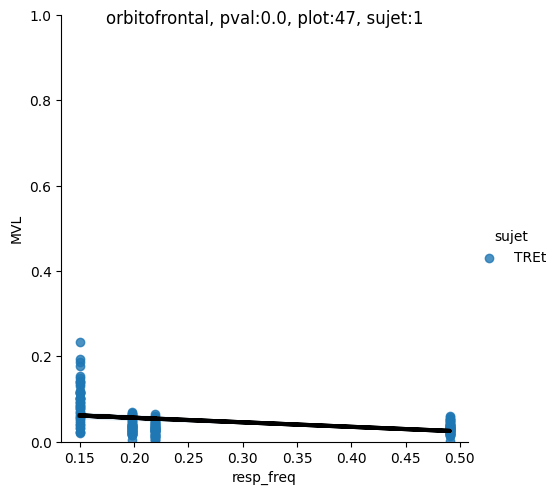

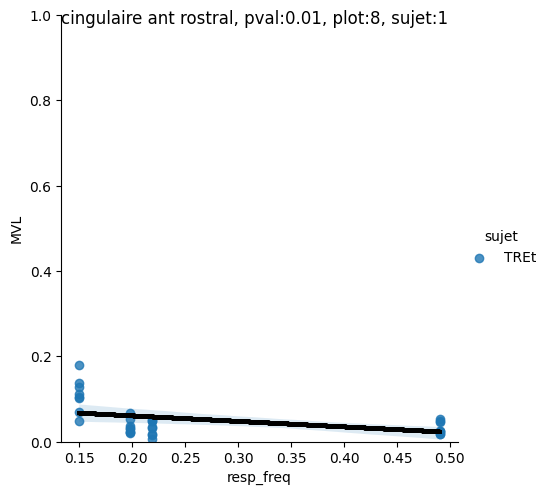

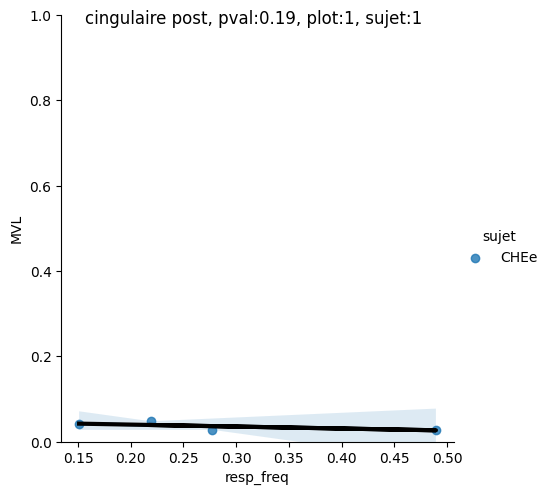

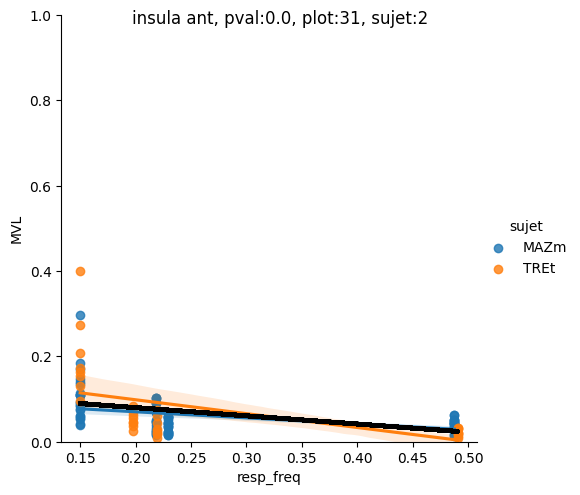

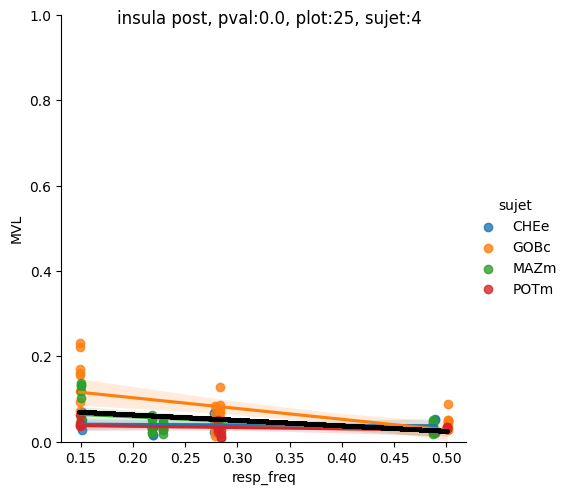

...

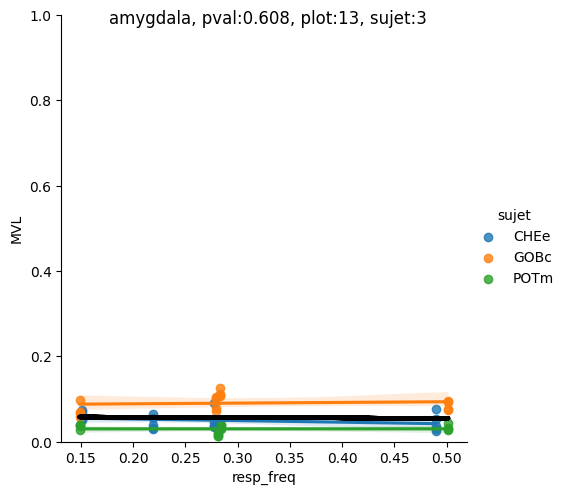

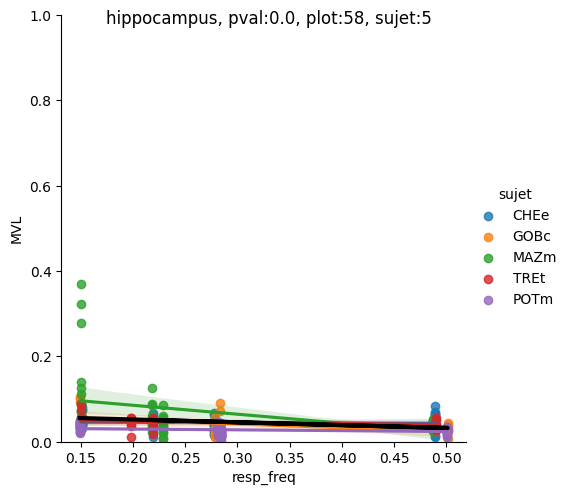

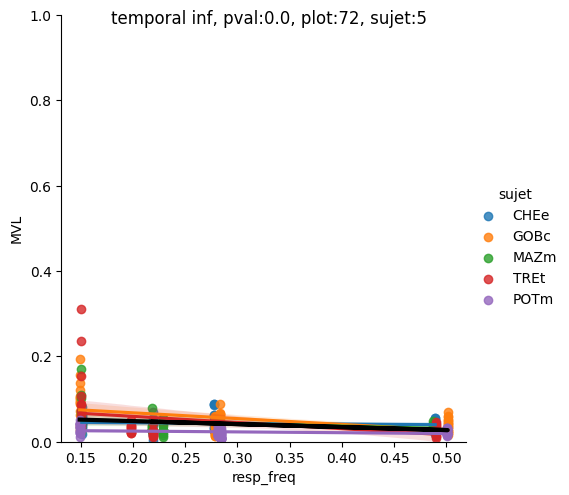

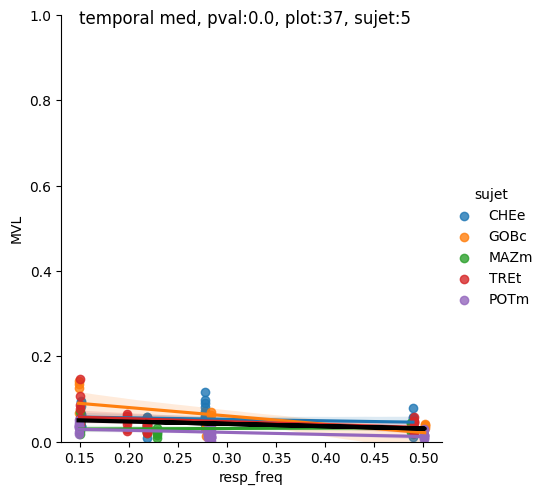

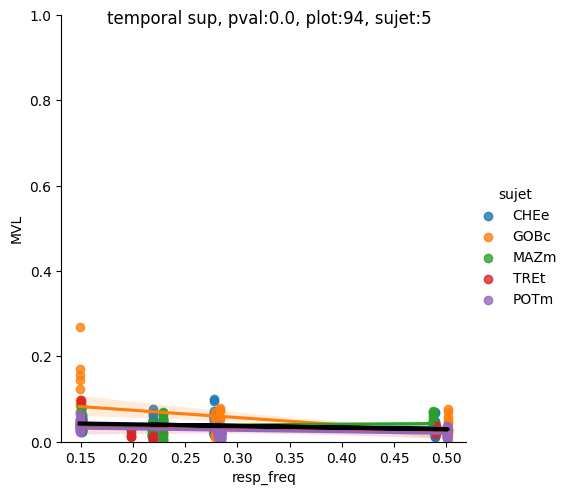

In [86]:
for ROI in ROI_for_DFC_plot:

    if ROI not in df_allcond['ROI'].unique():

        continue

    else:

        _df_lmm = df_allcond.query(f"ROI == '{ROI}'")[['sujet', 'MVL', 'resp_freq']]
        
        pval = df_lmm.query(f"ROI == '{ROI}'")['pval'].values[0]
        sns.lmplot(x="resp_freq", y="MVL", hue='sujet', data=_df_lmm)
        _ROI_mdl = _df_lmm['resp_freq'].values*df_lmm.query(f"ROI == '{ROI}'")['coeff'].values + df_lmm.query(f"ROI == '{ROI}'")['intercept'].values
        plt.plot(_df_lmm['resp_freq'].values, _ROI_mdl, color='k', linewidth=3)
        plt.ylim(0,1)
        plt.suptitle(f"{ROI}, pval:{pval}, plot:{ROI_counts_plot[ROI]}, sujet:{ROI_counts_sujet[ROI]}")


# Pxx

In [92]:
os.chdir(os.path.join(path_results, 'allplot', 'df'))
df_Pxx = pd.read_excel(f'allplot_df_Pxx.xlsx', index_col = 0).drop(columns = 'Unnamed: 0')

In [93]:
respfeatures = {}

for sujet in df_Pxx['sujet'].unique():

    respfeatures[sujet] = load_respfeatures(sujet)

data_resp_freq = []

for row_i in range(df_Pxx.shape[0]):

    _cond = df_Pxx.iloc[row_i,:]['cond']
    _sujet = df_Pxx.iloc[row_i,:]['sujet']

    if _cond == 'FR_CV':

        _resp_freq = np.round(np.median(respfeatures[_sujet][_cond][0].query(f"select == 1")['cycle_freq']), 3)

    else:

        _resp_freq = np.zeros((session_count[_cond]))

        for session_i in range(session_count[_cond]):

            _resp_freq[session_i] = np.round(np.median(respfeatures[_sujet][_cond][session_i].query(f"select == 1")['cycle_freq']), 3)

        _resp_freq = np.median(_resp_freq)
    
    data_resp_freq.append(_resp_freq)

df_Pxx['resp_freq'] = data_resp_freq

In [94]:
df_Pxx

,sujet,cond,chan,ROI,Lobe,side,Pxx,phase,band,resp_freq
0,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,-0.069780,whole,theta,0.219
1,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,-0.125962,inspi,theta,0.219
2,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,-0.020810,expi,theta,0.219
3,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,0.010035,whole,alpha,0.219
4,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,0.003884,inspi,alpha,0.219
...,...,...,...,...,...,...,...,...,...,...
520,pat_03174_1634,FR_CV,TPol_4,pole temporal,Temporal,l,-0.080454,inspi,l_gamma,0.185
521,pat_03174_1634,FR_CV,TPol_4,pole temporal,Temporal,l,-0.092946,expi,l_gamma,0.185
522,pat_03174_1634,FR_CV,TPol_4,pole temporal,Temporal,l,-0.041721,whole,h_gamma,0.185
523,pat_03174_1634,FR_CV,TPol_4,pole temporal,Temporal,l,-0.139074,inspi,h_gamma,0.185


## FR_CV

In [127]:
df_Pxx_FR_CV = df_Pxx.query(f"cond == 'FR_CV'")

In [128]:
df_Pxx_FR_CV[['sujet', 'resp_freq']].groupby(['sujet', 'resp_freq']).mean().reset_index()

,sujet,resp_freq
0,BANc,0.211
1,CHEe,0.219
2,GOBc,0.279
3,KOFs,0.235
4,LEMl,0.243
5,MAZm,0.229
6,MUGa,0.279
7,POTm,0.284
8,TREt,0.219
9,pat_02459_0912,0.233


In [129]:
sujet_respi_select = df_Pxx_FR_CV[['sujet', 'resp_freq']].groupby(['sujet', 'resp_freq']).mean().reset_index().query(f"resp_freq < 0.40")['sujet'].unique().tolist()
sujet_respi_select

['BANc',
 'CHEe',
 'GOBc',
 'KOFs',
 'LEMl',
 'MAZm',
 'MUGa',
 'POTm',
 'TREt',
 'pat_02459_0912',
 'pat_02476_0929',
 'pat_02495_0949',
 'pat_03083_1527',
 'pat_03105_1551',
 'pat_03128_1591',
 'pat_03138_1601',
 'pat_03174_1634']

In [130]:
df_Pxx_FR_CV_filtered = df_Pxx.query(f"cond == 'FR_CV' and sujet in {sujet_respi_select}")

In [118]:
ROI_counts_plot, ROI_counts_sujet = get_ROI_counts(df_Pxx_FR_CV)

In [132]:
data = {'ROI' : [], 'band' : [], 'diff' : [], 'pval' : [], 'p' : []}

for ROI in ROI_for_DFC_plot:

    if ROI not in df_Pxx_FR_CV['ROI'].unique():
        continue

    for band in df_Pxx_FR_CV['band'].unique():

        df = df_Pxx_FR_CV.query(f"ROI == '{ROI}' and phase in ['inspi', 'expi'] and band == '{band}'")
        diff = np.median(df.query("phase == 'inspi'")['Pxx'].values - df.query("phase == 'expi'")['Pxx'].values)
        pval = get_stats_df(df=df, predictor='phase', outcome='Pxx', subject='sujet', design='within')
        if pval < 0.05:
            p = 1
        else:
            p = 0

        data['ROI'].append(ROI)
        data['band'].append(band)
        data['diff'].append(diff)
        data['pval'].append(pval)
        data['p'].append(p)

df_diff_phase_FR_CV_pval = pd.DataFrame(data)
df_diff_phase_FR_CV_pval


,ROI,band,diff,pval,p
0,orbitofrontal,theta,-0.088216,0.0074,1
1,orbitofrontal,alpha,-0.011989,0.7306,0
2,orbitofrontal,beta,0.033326,0.7816,0
3,orbitofrontal,l_gamma,0.016642,0.8190,0
4,orbitofrontal,h_gamma,0.066256,0.0003,1
5,cingulaire ant rostral,theta,-0.131747,0.2638,0
6,cingulaire ant rostral,alpha,-0.082676,0.5843,0
7,cingulaire ant rostral,beta,0.051364,0.6648,0
8,cingulaire ant rostral,l_gamma,-0.096125,0.0203,1
9,cingulaire ant rostral,h_gamma,-0.039698,0.1538,0


In [133]:
ROI_labels = [f'{ROI} (c{ROI_counts_plot[ROI]}) (s{ROI_counts_sujet[ROI]})' for ROI in df_diff_phase_FR_CV_pval.query("p == 1")['ROI'].unique()]

Text(0.5, 0.98, 'FR_CV')

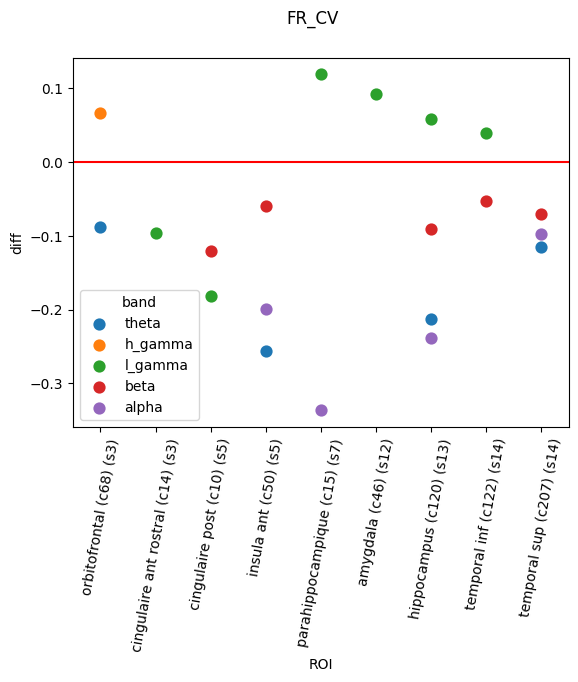

In [134]:
g = sns.pointplot(data=df_diff_phase_FR_CV_pval.query("p == 1"), x='ROI', y='diff', hue='band', join=False)
g.axhline(0, color='r')
g.set_xticklabels(ROI_labels)
plt.xticks(rotation=80)
plt.suptitle('FR_CV')

/crnldata/cmo/multisite/DATA_MANIP/iEEG_Lyon_VJ/Script_Python_iEEG_Lyon_git/n0ter_stats.py:385: FutureWarning: The default value of numeric_only in DataFrameGroupBy.mean is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].rename('sd')], axis = 1).round(2).set_index(predictor)
/crnldata/cmo/multisite/DATA_MANIP/iEEG_Lyon_VJ/Script_Python_iEEG_Lyon_git/n0ter_stats.py:385: FutureWarning: The default value of numeric_only in DataFrameGroupBy.std is deprecated. In a future version, numeric_only will default to False. Either specify numeric_only or select only columns which should be valid for the function.
  estimators = pd.concat([df.groupby(predictor).mean()[outcome].reset_index(), df.groupby(predictor).std()[outcome].reset_index()[outcome].re

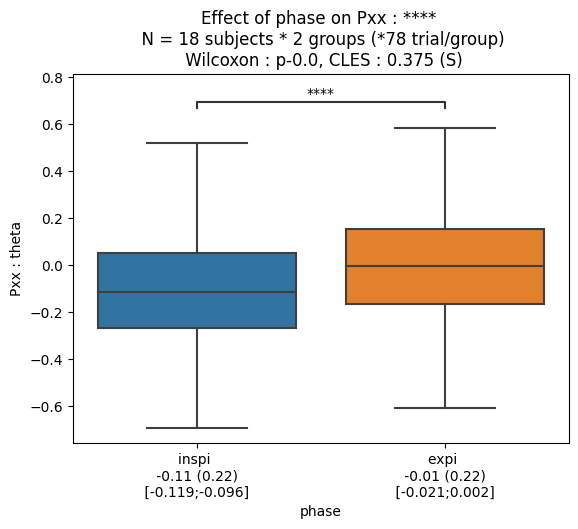

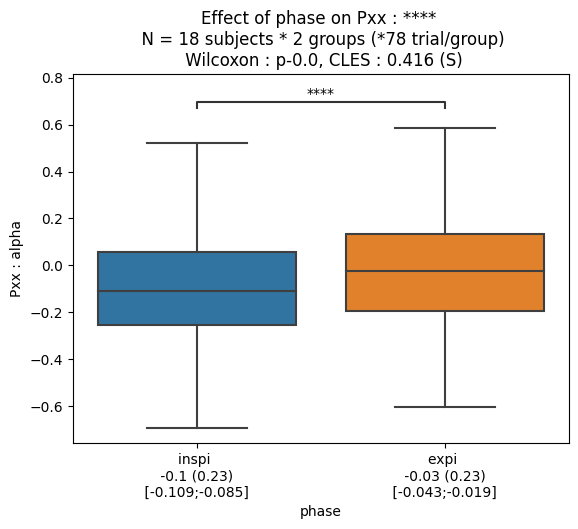

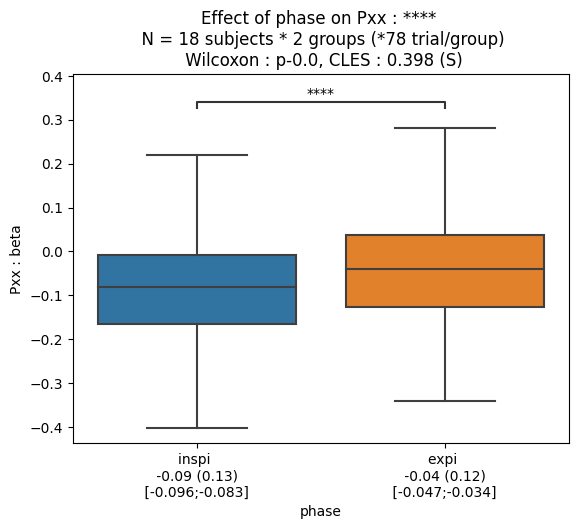

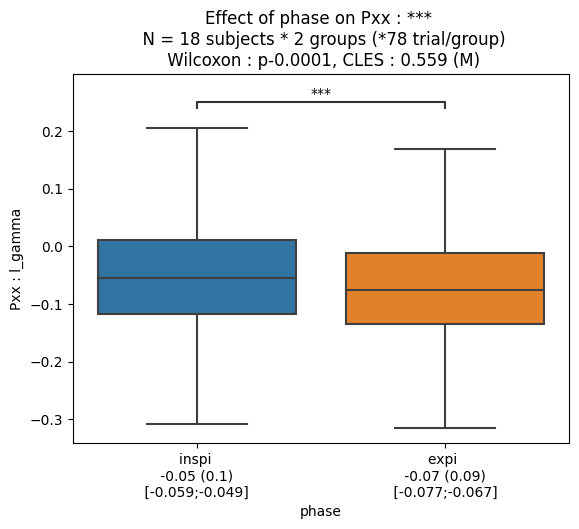

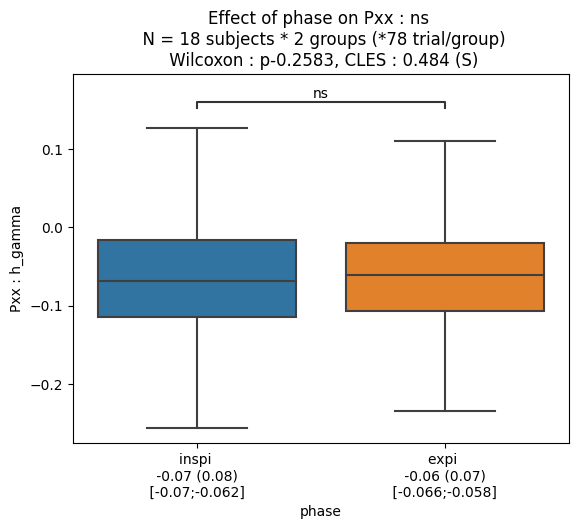

In [122]:
for band in df_Pxx['band'].unique():

    df = df_Pxx.query(f"cond == 'FR_CV' and phase in ['inspi', 'expi'] and band == '{band}'")
    fig, ax = plt.subplots()
    ax = auto_stats(df=df, predictor = 'phase', outcome = 'Pxx', subject = 'sujet', order = ['inspi', 'expi'], ax=ax)
    ax.set_ylabel(f'Pxx : {band}')

In [135]:
data = {'ROI' : [], 'band' : [], 'phase' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for phase in ['inspi', 'expi']:

    for band in df_Pxx['band'].unique():

        for ROI in ROI_for_DFC_plot:

            if ROI not in df_Pxx_FR_CV_filtered['ROI'].unique():

                continue

            else:

                _df_lmm = df_Pxx_FR_CV_filtered.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")[['Pxx', 'resp_freq']]

                x = _df_lmm['resp_freq']
                y = _df_lmm['Pxx']

                x = sm.add_constant(x)

                mdl = sm.OLS(y, x).fit()
                mdl_fit = mdl.predict(x) 

                coeff = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[-1]
                intercept = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['coef'].values[0]
                pval = pd.read_html(mdl.summary().tables[1].as_html(), header=0, index_col=0)[0]['P>|t|'].values[-1]

                if float(pval) < 0.05:

                    p = 1

                else:

                    p = 0

                data['ROI'].append(ROI)
                data['band'].append(band)
                data['phase'].append(phase)
                data['coeff'].append(coeff)
                data['intercept'].append(intercept)
                data['pval'].append(pval)
                data['p'].append(p)
                
                # fig, axs = plt.subplots(ncols=2, figsize=(10,5))

                # sns.histplot(mdl_fit.resid, ax=axs[0])
                # sm.qqplot(mdl_fit.resid, dist=stats.norm, line='s', ax=axs[1])

                # plt.suptitle(f"{ROI}, plot:{ROI_counts_plot[ROI]}, sujet:{_df_lmm['sujet'].unique().shape[0]}")

                # fig.savefig(os.path.join(path_results, 'allplot', 'allcond', 'PSD_Coh', 'stats', f'{ROI}_{band}_qqplot_distrib_LMM_Pxx_FR_CV.png'))

                # plt.close()

                # plt.show()

df_lmm = pd.DataFrame(data)
df_lmm

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_stats_py.py:1772: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_stats_py.py:1772: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_stats_py.py:1772: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=14
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/scipy/stats/_stats_py.py:1772: UserWarning: kurtosistest only valid for n>=20 ... continuing anyway, n=9
  warnings.warn("kurtosistest only valid for n>=20 ... continuing "
/home/jules.granget/myenvs/py39c/lib64/python3.9/site

,ROI,band,phase,coeff,intercept,pval,p
0,orbitofrontal,theta,inspi,-0.0059,-0.1266,0.995,0
1,cingulaire ant rostral,theta,inspi,6.2663,-1.5296,0.324,0
2,cingulaire ant caudal,theta,inspi,0.0969,0.0116,0.970,0
3,cingulaire post,theta,inspi,-5.3380,1.1373,0.195,0
4,insula ant,theta,inspi,2.9041,-0.8283,0.351,0
...,...,...,...,...,...,...,...
115,amygdala,h_gamma,expi,-0.1580,-0.0405,0.567,0
116,hippocampus,h_gamma,expi,-0.5784,0.0727,0.001,1
117,temporal inf,h_gamma,expi,-0.0395,-0.0534,0.826,0
118,temporal med,h_gamma,expi,-0.2375,-0.0047,0.250,0


In [136]:
ROI_signi = df_lmm.query(f"p == 1")
ROI_signi

,ROI,band,phase,coeff,intercept,pval,p
8,hippocampus,theta,inspi,-1.1535,0.1246,0.032,1
13,cingulaire ant rostral,alpha,inspi,-12.5081,2.7554,0.046,1
14,cingulaire ant caudal,alpha,inspi,5.0324,-1.3123,0.036,1
23,temporal sup,alpha,inspi,-1.2714,0.2162,0.020,1
24,orbitofrontal,beta,inspi,1.0495,-0.3094,0.010,1
36,orbitofrontal,l_gamma,inspi,0.9388,-0.2875,0.006,1
44,hippocampus,l_gamma,inspi,0.7464,-0.2214,0.003,1
45,temporal inf,l_gamma,inspi,1.1675,-0.3302,0.000,1
47,temporal sup,l_gamma,inspi,0.8430,-0.2812,0.000,1
48,orbitofrontal,h_gamma,inspi,0.6837,-0.1982,0.011,1


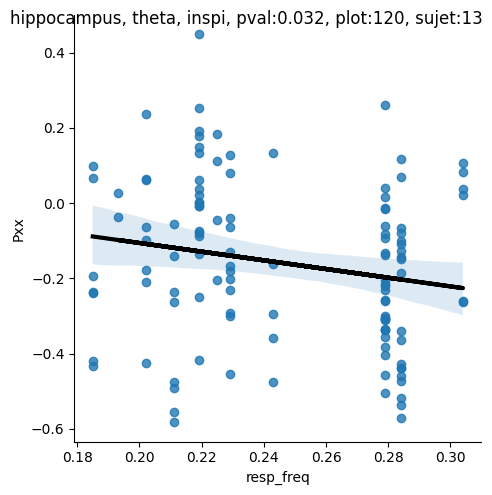

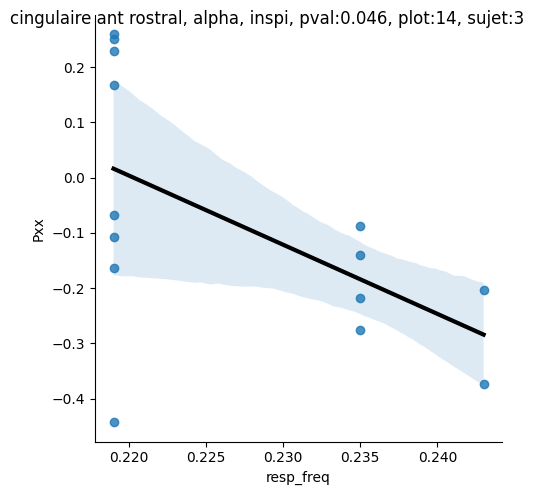

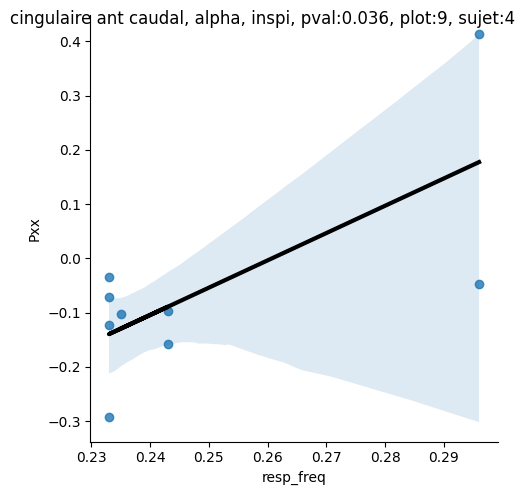

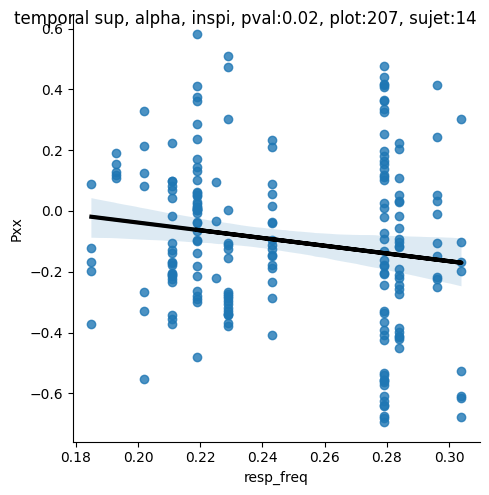

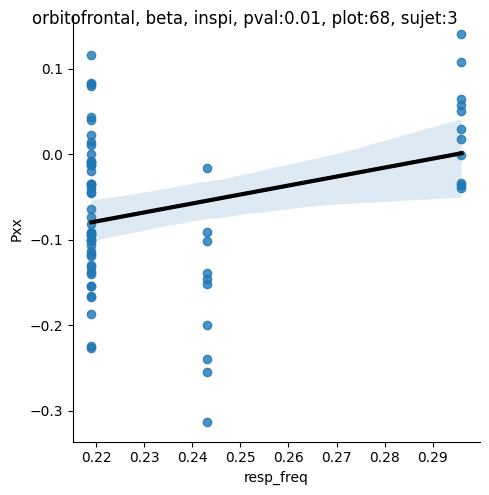

...

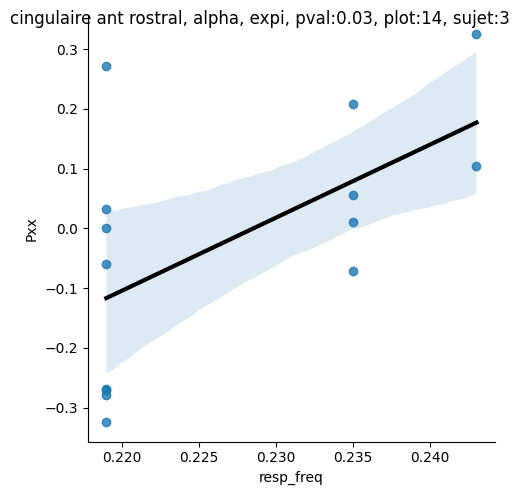

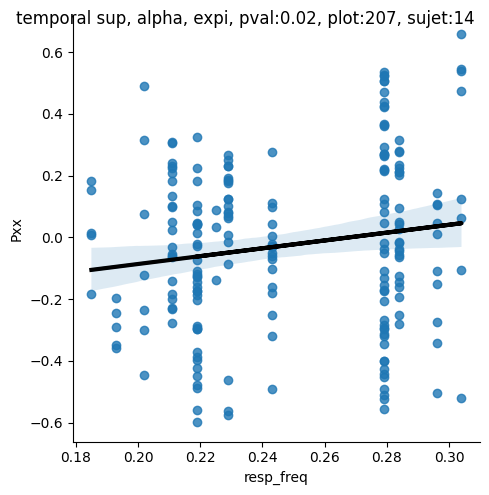

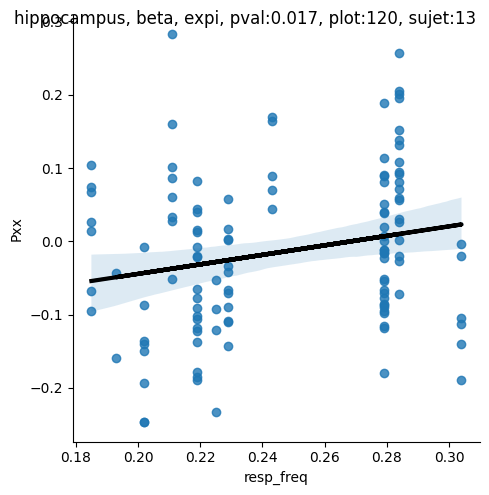

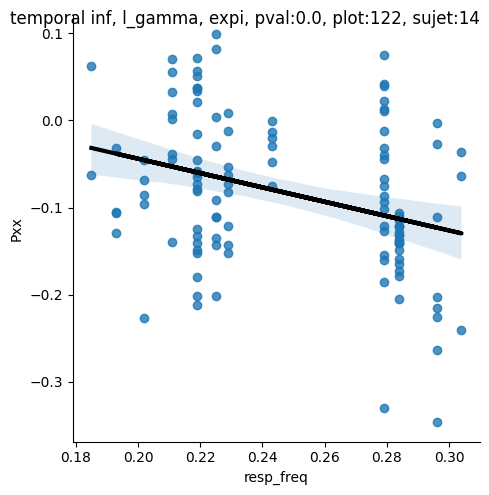

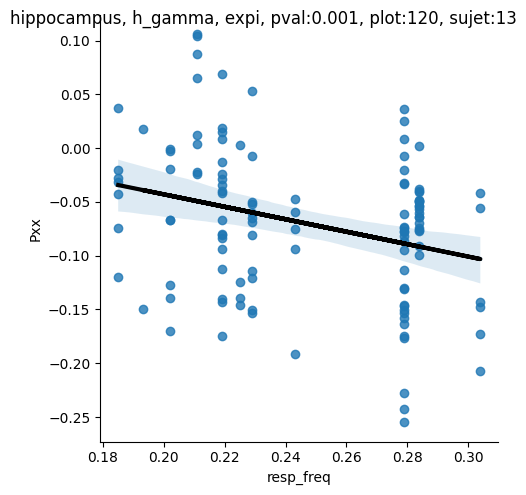

In [137]:
for row_i in range(ROI_signi.shape[0]):

    ROI, band, phase = ROI_signi.iloc[row_i,:]['ROI'], ROI_signi.iloc[row_i,:]['band'], ROI_signi.iloc[row_i,:]['phase']
    _coeff, _intercept = ROI_signi.iloc[row_i,:]['coeff'], ROI_signi.iloc[row_i,:]['intercept']
    _df_lmm = df_Pxx_FR_CV_filtered.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")[['sujet', 'Pxx', 'resp_freq']]
    
    pval = df_lmm.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")['pval'].values[0]
    sns.lmplot(x="resp_freq", y="Pxx", data=_df_lmm)

    _ROI_mdl = _df_lmm['resp_freq'].values*_coeff + _intercept
    plt.plot(_df_lmm['resp_freq'].values, _ROI_mdl, color='k', linewidth=3)
    
    plt.suptitle(f"{ROI}, {band}, {phase}, pval:{pval}, plot:{ROI_counts_plot[ROI]}, sujet:{ROI_counts_sujet[ROI]}")

## ALL CONDITIONS

### LMM

In [138]:
ROI_counts_plot, ROI_counts_sujet = get_ROI_counts(df_Pxx.query(f"sujet in {sujet_list}"))

In [139]:
df_allcond = df_Pxx.query(f"sujet in {sujet_list} and cond != 'FR_CV'")

In [141]:
data = {'ROI' : [], 'band' : [], 'phase' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for phase in ['inspi', 'expi']:

    for ROI in ROI_for_DFC_plot:

        for band in df_Pxx['band'].unique():

            if ROI not in df_allcond['ROI'].unique():

                continue

            else:

                _df_lmm = df_allcond.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")[['sujet', 'Pxx', 'resp_freq']]

                mdl = smf.mixedlm("Pxx ~ resp_freq", data=_df_lmm, groups=_df_lmm['sujet'])
                mdl_fit = mdl.fit(method=["powell", "lbfgs"])

                coeff = float(mdl_fit.summary().tables[1]['Coef.'][1])
                intercept = float(mdl_fit.summary().tables[1]['Coef.'][0])
                pval = float(mdl_fit.summary().tables[1]['P>|z|'][1])

                if float(mdl_fit.summary().tables[1]['P>|z|'][1]) < 0.05:

                    p = 1

                else:

                    p = 0

                data['ROI'].append(ROI)
                data['band'].append(band)
                data['phase'].append(phase)
                data['coeff'].append(coeff)
                data['intercept'].append(intercept)
                data['pval'].append(pval)
                data['p'].append(p)
                
                fig, axs = plt.subplots(ncols=2, figsize=(10,5))

                g = sns.histplot(mdl_fit.resid, ax=axs[0])
                g = sm.qqplot(mdl_fit.resid, dist=stats.norm, line='s', ax=axs[1])

                plt.suptitle(f"{ROI}, plot:{ROI_counts_plot[ROI]}, band:{band}, sujet:{_df_lmm['sujet'].unique().shape[0]}")

                fig.savefig(os.path.join(path_results, 'allplot', 'allcond', 'PSD_Coh', f'{ROI}_{band}_{phase}_qqplot_distrib_LMM_Pxx_allcond.png'))

                plt.close()

                # plt.show()

df_lmm = pd.DataFrame(data)
df_lmm

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, Conv

,ROI,band,phase,coeff,intercept,pval,p
0,orbitofrontal,theta,inspi,-4.319,3.405,0.000,1
1,orbitofrontal,alpha,inspi,-4.609,3.889,0.000,1
2,orbitofrontal,beta,inspi,-1.723,2.079,0.000,1
3,orbitofrontal,l_gamma,inspi,1.458,0.521,0.000,1
4,orbitofrontal,h_gamma,inspi,1.515,0.739,0.004,1
...,...,...,...,...,...,...,...
105,temporal sup,theta,expi,5.135,1.792,0.001,1
106,temporal sup,alpha,expi,1.185,1.358,0.050,0
107,temporal sup,beta,expi,-0.622,1.211,0.008,1
108,temporal sup,l_gamma,expi,-1.075,0.650,0.000,1


In [142]:
ROI_signi = df_lmm.query(f"p == 1")
ROI_signi

,ROI,band,phase,coeff,intercept,pval,p
0,orbitofrontal,theta,inspi,-4.319,3.405,0.000,1
1,orbitofrontal,alpha,inspi,-4.609,3.889,0.000,1
2,orbitofrontal,beta,inspi,-1.723,2.079,0.000,1
3,orbitofrontal,l_gamma,inspi,1.458,0.521,0.000,1
4,orbitofrontal,h_gamma,inspi,1.515,0.739,0.004,1
8,cingulaire ant rostral,l_gamma,inspi,1.448,0.004,0.017,1
10,cingulaire post,theta,inspi,9.019,1.405,0.000,1
15,insula ant,theta,inspi,-2.322,1.841,0.001,1
18,insula ant,l_gamma,inspi,-0.809,0.523,0.002,1
19,insula ant,h_gamma,inspi,-1.979,0.767,0.000,1


/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/seaborn/axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


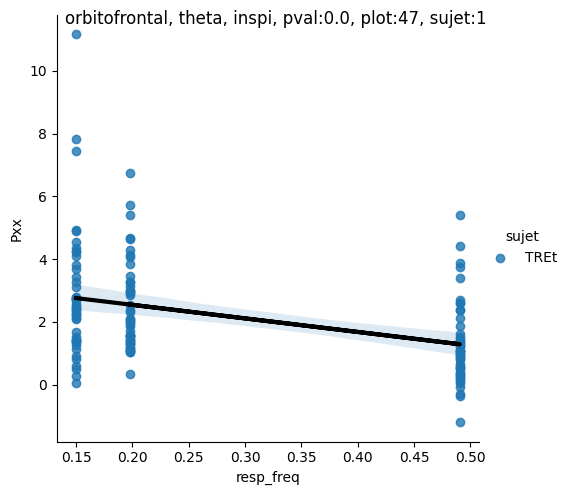

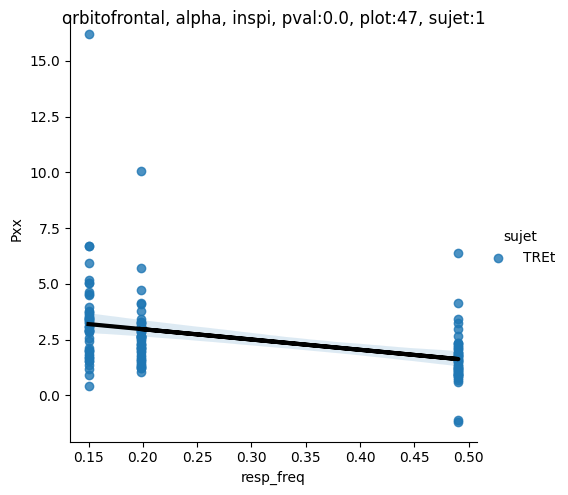

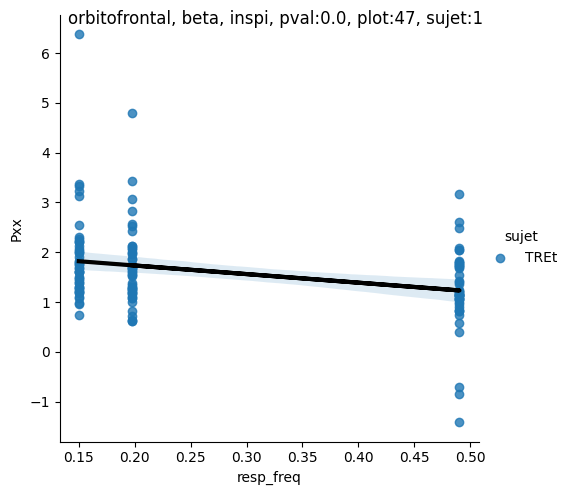

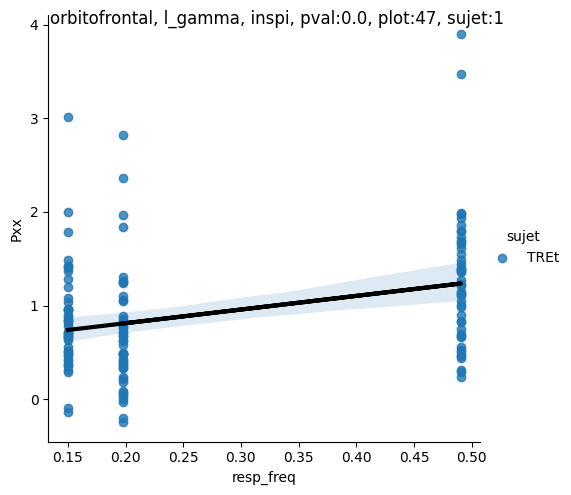

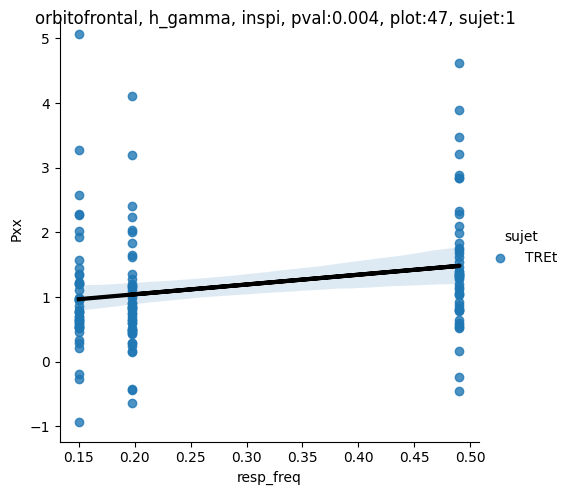

...

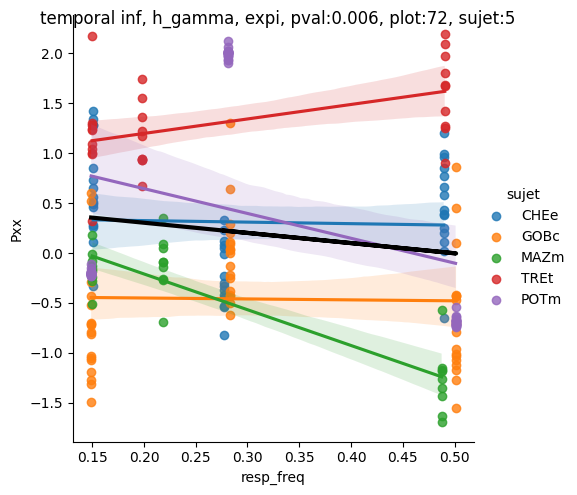

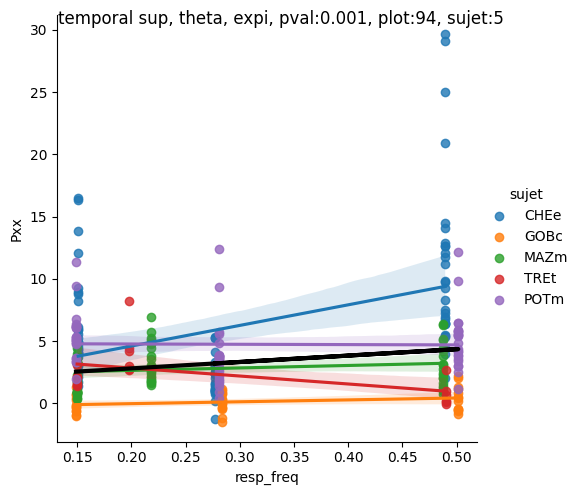

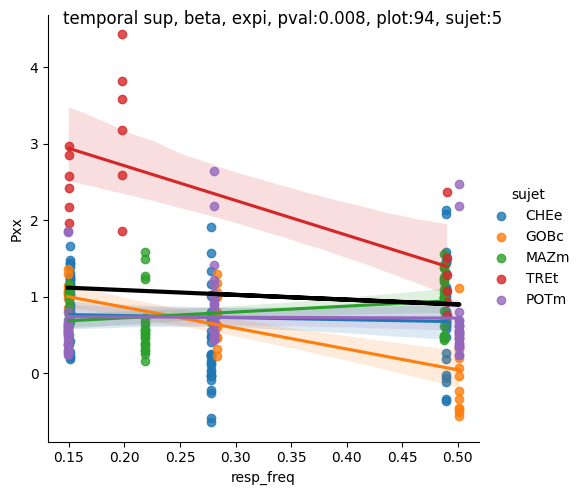

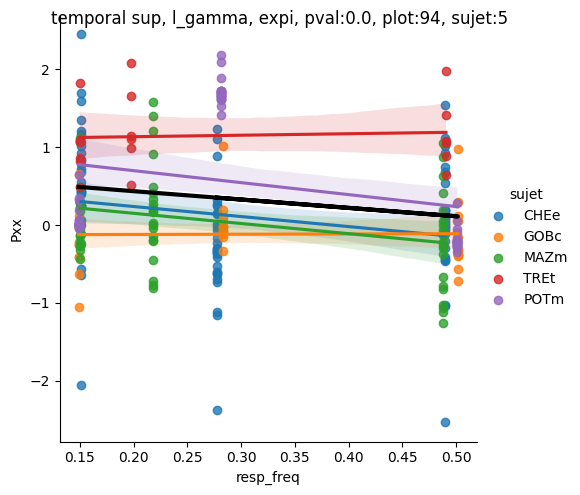

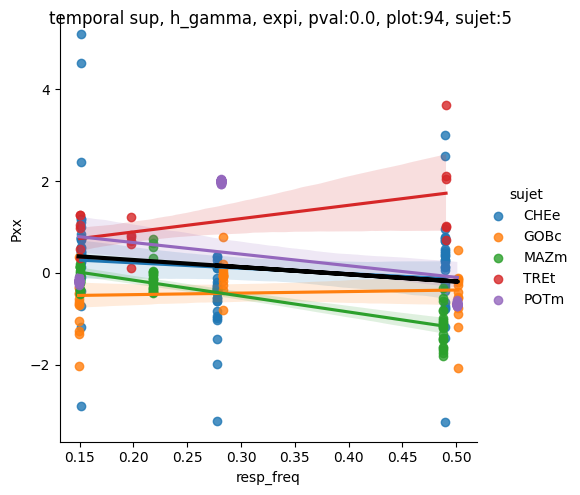

In [144]:
for row_i in range(ROI_signi.shape[0]):

    ROI, band, phase = ROI_signi.iloc[row_i,:]['ROI'], ROI_signi.iloc[row_i,:]['band'], ROI_signi.iloc[row_i,:]['phase']
    _coeff, _intercept = ROI_signi.iloc[row_i,:]['coeff'], ROI_signi.iloc[row_i,:]['intercept']
    _df_lmm = df_allcond.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")[['sujet', 'Pxx', 'resp_freq']]
    
    pval = df_lmm.query(f"ROI == '{ROI}' and band == '{band}' and phase == '{phase}'")['pval'].values[0]
    sns.lmplot(x="resp_freq", y="Pxx", hue='sujet', data=_df_lmm)

    _ROI_mdl = _df_lmm['resp_freq'].values*_coeff + _intercept
    plt.plot(_df_lmm['resp_freq'].values, _ROI_mdl, color='k', linewidth=3)

    plt.suptitle(f"{ROI}, {band}, {phase}, pval:{pval}, plot:{ROI_counts_plot[ROI]}, sujet:{ROI_counts_sujet[ROI]}")

### inspi expi

In [145]:
df_Pxx_allcond_diff = df_Pxx.query(f"sujet in {sujet_list}")

data = {'ROI' : [], 'cond' : [], 'band' : [], 'diff' : [], 'pval' : [], 'p' : []}

for cond in conditions:

    for ROI in ROI_for_DFC_plot:

        if ROI not in df_Pxx_allcond_diff['ROI'].unique():
            continue

        if ROI_counts_plot[ROI] == 1:
            continue

        for band in df_Pxx_allcond_diff['band'].unique():

            df = df_Pxx_allcond_diff.query(f"ROI == '{ROI}' and cond == '{cond}' and phase in ['inspi', 'expi'] and band == '{band}'")
            diff = np.median(df.query("phase == 'inspi'")['Pxx'].values - df.query("phase == 'expi'")['Pxx'].values)
            pval = get_stats_df(df=df, predictor='phase', outcome='Pxx', subject='sujet', design='within')

            if pval < 0.05:
                p = 1
            else:
                p = 0

            data['ROI'].append(ROI)
            data['cond'].append(cond)
            data['band'].append(band)
            data['diff'].append(diff)
            data['pval'].append(pval)
            data['p'].append(p)

df_diff_phase_pval = pd.DataFrame(data)
df_diff_phase_pval

,ROI,cond,band,diff,pval,p
0,orbitofrontal,FR_CV,theta,-0.038297,0.1146,0
1,orbitofrontal,FR_CV,alpha,0.050082,0.3631,0
2,orbitofrontal,FR_CV,beta,-0.001361,0.3633,0
3,orbitofrontal,FR_CV,l_gamma,0.016642,0.6036,0
4,orbitofrontal,FR_CV,h_gamma,0.066256,0.0133,1
...,...,...,...,...,...,...
195,temporal sup,RD_SV,theta,0.111570,0.0341,1
196,temporal sup,RD_SV,alpha,0.426848,0.0000,1
197,temporal sup,RD_SV,beta,0.178367,0.0020,1
198,temporal sup,RD_SV,l_gamma,0.134946,0.0256,1


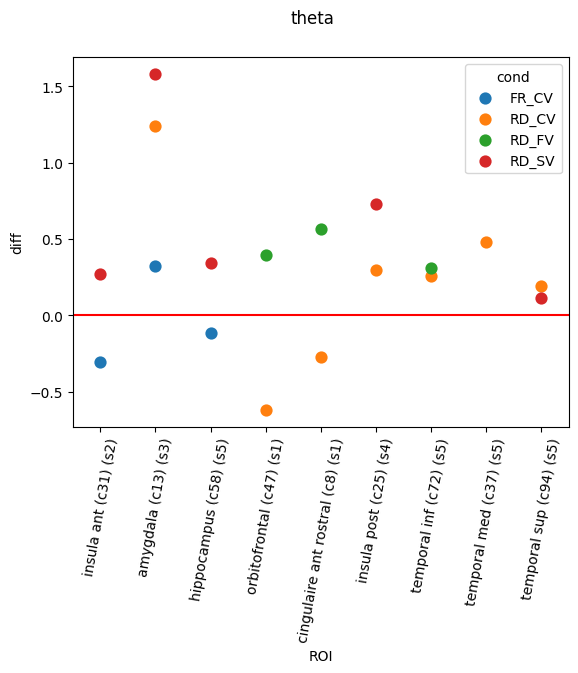

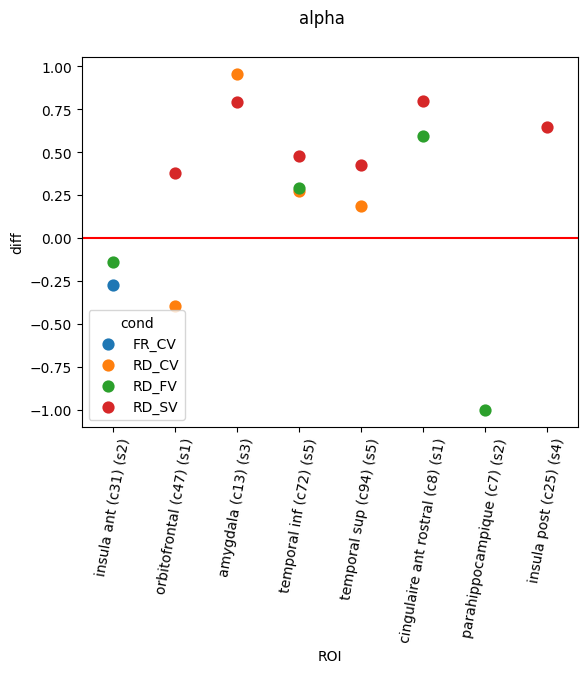

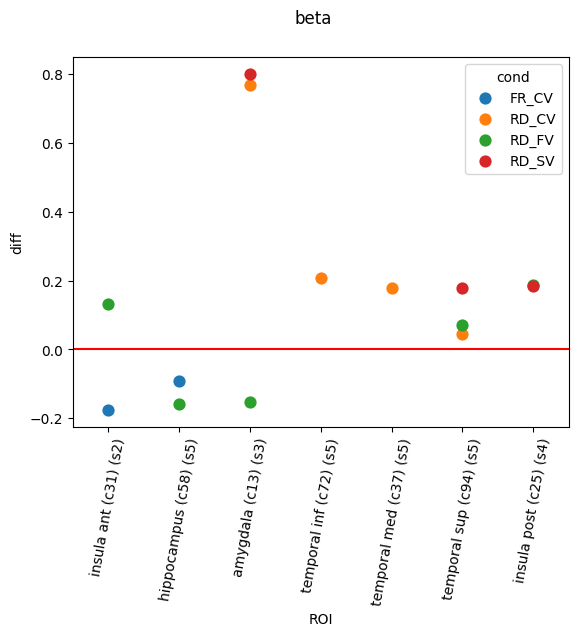

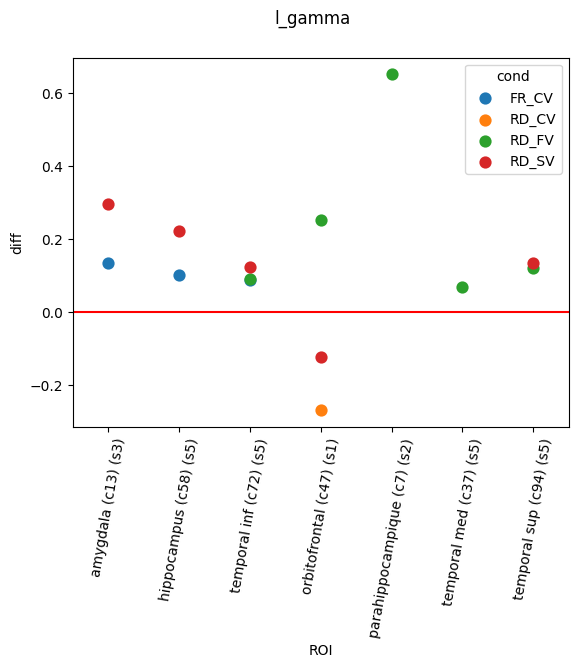

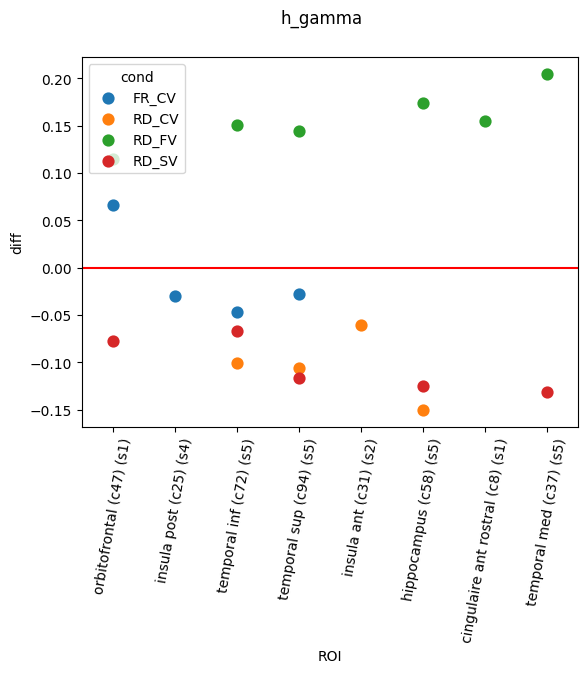

In [146]:
for band in df_diff_phase_pval['band'].unique():

    ROI_labels = [f'{ROI} (c{ROI_counts_plot[ROI]}) (s{ROI_counts_sujet[ROI]})' for ROI in df_diff_phase_pval.query(f"band == '{band}' and p == 1")['ROI'].unique()]

    g = sns.pointplot(data=df_diff_phase_pval.query(f"band == '{band}' and p == 1"), x='ROI', y='diff', hue='cond', join=False)
    g.set_xticklabels(ROI_labels)
    plt.xticks(rotation=80)
    plt.suptitle(f'{band}')
    g.axhline(0, color='r')
    plt.show()

In [156]:
df_Pxx_allcond_diff = df_Pxx.query(f"sujet in {sujet_list} and phase == 'inspi'").drop(columns=['phase', 'Pxx'])
df_Pxx_allcond_diff['Pxx_diff'] = df_Pxx.query(f"sujet in {sujet_list} and phase == 'inspi'")['Pxx'].values - df_Pxx.query(f"sujet in {sujet_list} and phase == 'expi'")['Pxx'].values 
df_Pxx_allcond_diff

,sujet,cond,chan,ROI,Lobe,side,band,resp_freq,Pxx_diff
1,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,theta,0.219,-0.105152
4,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,alpha,0.219,-0.008825
7,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,beta,0.219,0.103978
10,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,l_gamma,0.219,0.114323
13,CHEe,FR_CV,Jp01,temporal sup,Temporal,l,h_gamma,0.219,-0.026908
...,...,...,...,...,...,...,...,...,...
7246,POTm,RD_SV,L12,temporal inf,Temporal,l,theta,0.149,0.030114
7249,POTm,RD_SV,L12,temporal inf,Temporal,l,alpha,0.149,0.733274
7252,POTm,RD_SV,L12,temporal inf,Temporal,l,beta,0.149,-0.079334
7255,POTm,RD_SV,L12,temporal inf,Temporal,l,l_gamma,0.149,0.371629


In [160]:
data = {'ROI' : [], 'band' : [], 'coeff' : [], 'intercept' : [], 'pval' : [], 'p' : []}

for ROI in ROI_for_DFC_plot:

    for band in df_Pxx['band'].unique():

        if ROI not in df_Pxx_allcond_diff['ROI'].unique():

            continue

        else:

            _df_lmm = df_Pxx_allcond_diff.query(f"ROI == '{ROI}' and band == '{band}'")[['sujet', 'Pxx_diff', 'resp_freq']]

            mdl = smf.mixedlm("Pxx_diff ~ resp_freq", data=_df_lmm, groups=_df_lmm['sujet'])
            mdl_fit = mdl.fit(method=["powell", "lbfgs"])

            coeff = float(mdl_fit.summary().tables[1]['Coef.'][1])
            intercept = float(mdl_fit.summary().tables[1]['Coef.'][0])
            pval = float(mdl_fit.summary().tables[1]['P>|z|'][1])

            if float(mdl_fit.summary().tables[1]['P>|z|'][1]) < 0.05:

                p = 1

            else:

                p = 0

            data['ROI'].append(ROI)
            data['band'].append(band)
            data['coeff'].append(coeff)
            data['intercept'].append(intercept)
            data['pval'].append(pval)
            data['p'].append(p)
            
            fig, axs = plt.subplots(ncols=2, figsize=(10,5))

            g = sns.histplot(mdl_fit.resid, ax=axs[0])
            g = sm.qqplot(mdl_fit.resid, dist=stats.norm, line='s', ax=axs[1])

            plt.suptitle(f"{ROI}, plot:{ROI_counts_plot[ROI]}, band:{band}, sujet:{_df_lmm['sujet'].unique().shape[0]}")

            fig.savefig(os.path.join(path_results, 'allplot', 'allcond', 'PSD_Coh', f'{ROI}_{band}_{phase}_qqplot_distrib_LMM_Pxx_diff_allcond.png'))

            plt.close()

            # plt.show()

df_lmm = pd.DataFrame(data)
df_lmm

/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)
/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/statsmodels/regression/mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, Conv

,ROI,band,coeff,intercept,pval,p
0,orbitofrontal,theta,1.289,-0.392,0.008,1
1,orbitofrontal,alpha,-0.766,0.207,0.096,0
2,orbitofrontal,beta,-0.046,0.006,0.817,0
3,orbitofrontal,l_gamma,1.248,-0.371,0.000,1
4,orbitofrontal,h_gamma,0.506,-0.124,0.000,1
5,cingulaire ant rostral,theta,1.778,-0.508,0.005,1
6,cingulaire ant rostral,alpha,0.950,0.080,0.192,0
7,cingulaire ant rostral,beta,0.020,0.117,0.951,0
8,cingulaire ant rostral,l_gamma,0.511,-0.180,0.102,0
9,cingulaire ant rostral,h_gamma,0.761,-0.172,0.001,1


In [161]:
ROI_signi = df_lmm.query(f"p == 1")
ROI_signi

,ROI,band,coeff,intercept,pval,p
0,orbitofrontal,theta,1.289,-0.392,0.008,1
3,orbitofrontal,l_gamma,1.248,-0.371,0.000,1
4,orbitofrontal,h_gamma,0.506,-0.124,0.000,1
5,cingulaire ant rostral,theta,1.778,-0.508,0.005,1
9,cingulaire ant rostral,h_gamma,0.761,-0.172,0.001,1
17,insula ant,beta,0.510,-0.144,0.004,1
20,insula post,theta,-1.619,0.748,0.003,1
26,parahippocampique,alpha,-4.581,1.023,0.025,1
28,parahippocampique,l_gamma,5.186,-1.468,0.000,1
30,amygdala,theta,-3.569,1.666,0.006,1


/home/jules.granget/myenvs/py39c/lib64/python3.9/site-packages/seaborn/axisgrid.py:409: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure(figsize=figsize)


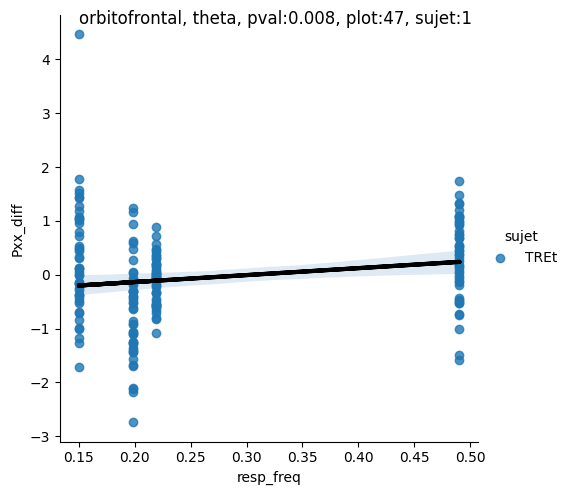

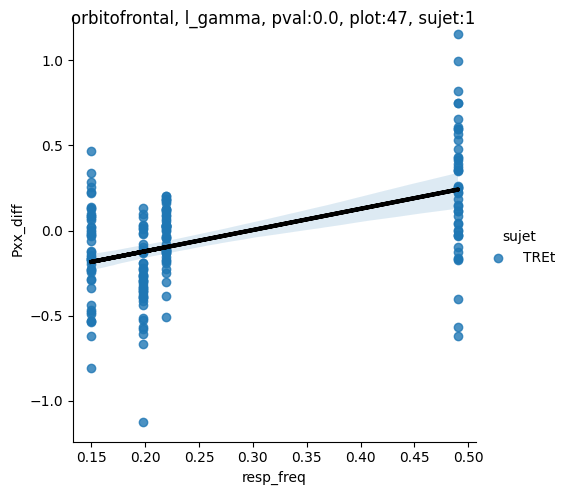

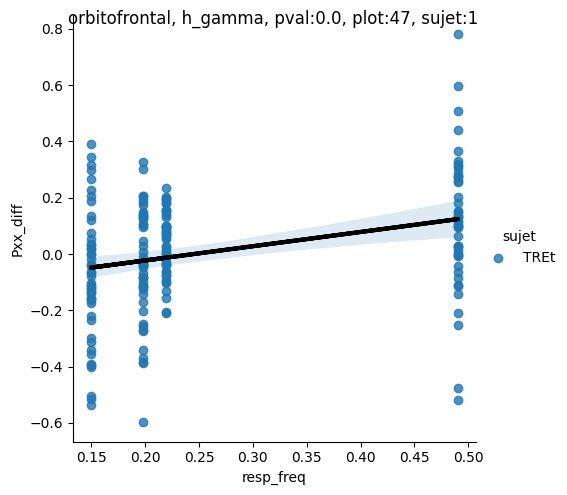

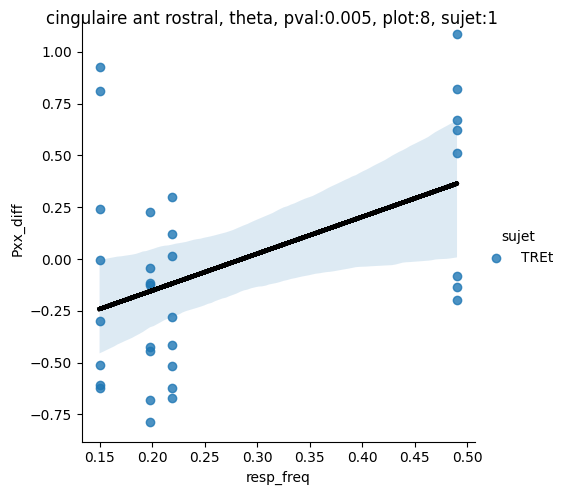

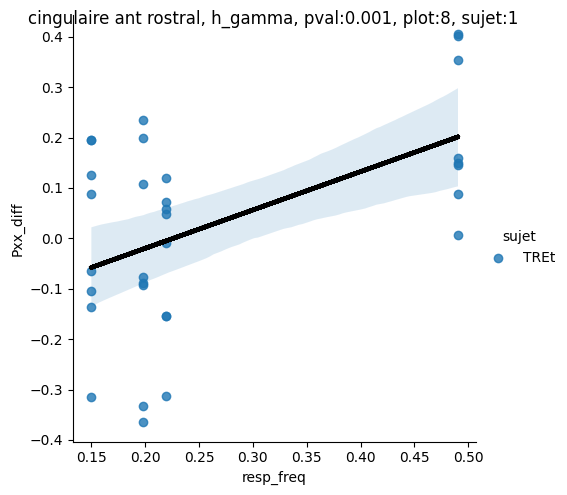

...

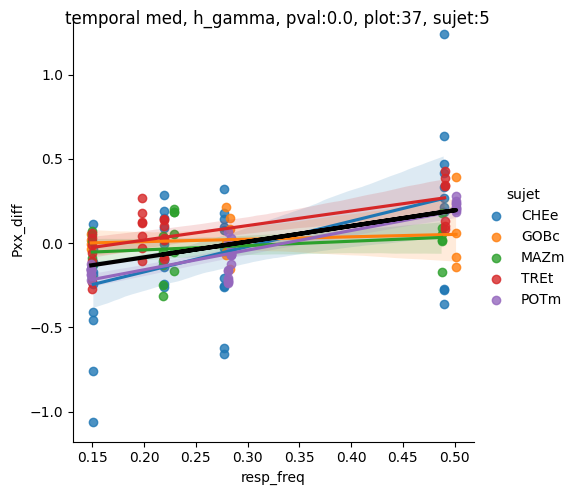

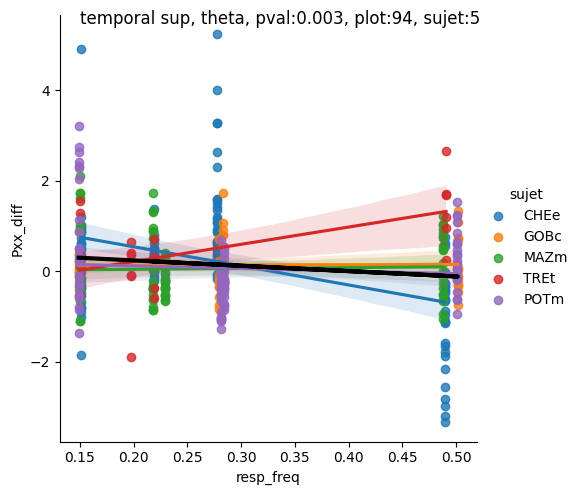

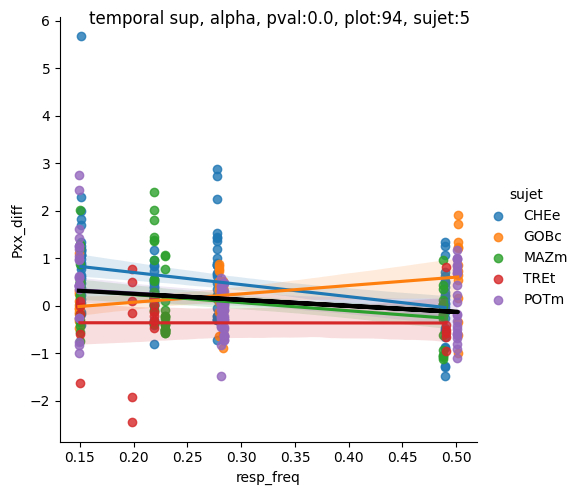

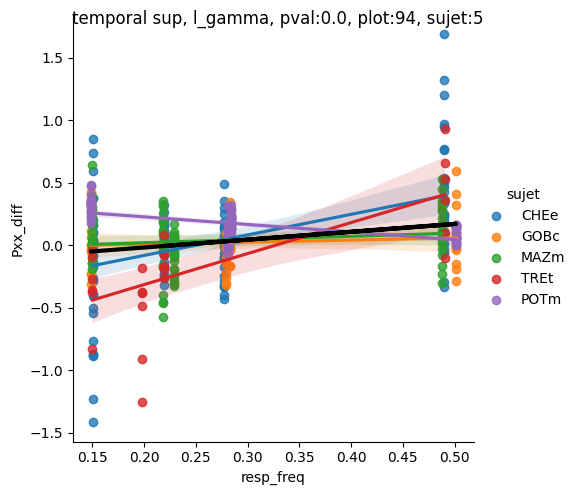

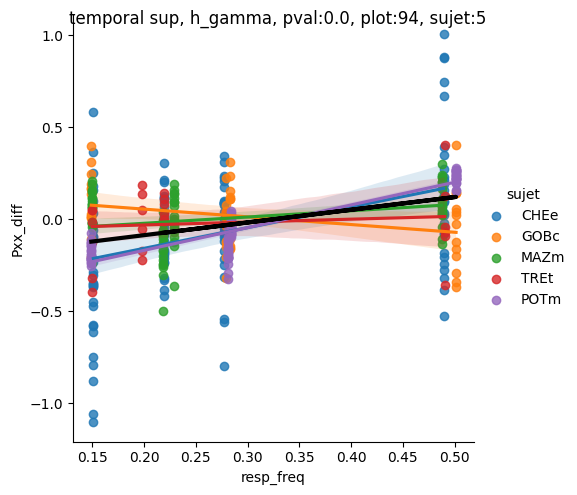

In [165]:
for row_i in range(ROI_signi.shape[0]):

    ROI, band = ROI_signi.iloc[row_i,:]['ROI'], ROI_signi.iloc[row_i,:]['band']
    _coeff, _intercept = ROI_signi.iloc[row_i,:]['coeff'], ROI_signi.iloc[row_i,:]['intercept']
    _df_lmm = df_Pxx_allcond_diff.query(f"ROI == '{ROI}' and band == '{band}'")[['sujet', 'Pxx_diff', 'resp_freq']]
    
    pval = df_lmm.query(f"ROI == '{ROI}' and band == '{band}'")['pval'].values[0]
    sns.lmplot(x="resp_freq", y="Pxx_diff", hue='sujet', data=_df_lmm)

    _ROI_mdl = _df_lmm['resp_freq'].values*_coeff + _intercept
    plt.plot(_df_lmm['resp_freq'].values, _ROI_mdl, color='k', linewidth=3)

    plt.suptitle(f"{ROI}, {band}, pval:{pval}, plot:{ROI_counts_plot[ROI]}, sujet:{ROI_counts_sujet[ROI]}")

# DFC on graphs

In [ ]:
file = folder + 'allplot_df_graph_DFC.xlsx'
df_DFC = pd.read_excel(file, index_col = 0)

In [ ]:
metrics = df_DFC['metric'].unique()
outcomes = ['CPL','GE','SWN']
phases = df_DFC['phase'].unique()

## ALL CONDITIONS

In [ ]:
df_DFC_all = df_DFC[df_DFC['sujet'].isin(sujets_lyon)]
df_DFC_all = df_DFC[~df_DFC['cond'].isin(['RD_AV','FR_MV'])]

In [ ]:
predictors = ['cond','band','phase']

In [ ]:
df_DFC_all

,sujet,cond,band,metric,phase,CPL,GE,SWN,Unnamed: 0
0,CHEe,RD_CV,beta,ispc,inspi,1.552381,0.742857,-0.083549,0
1,CHEe,RD_CV,beta,ispc,expi,1.561905,0.741270,-0.120183,0
2,CHEe,RD_CV,beta,wpli,inspi,1.514286,0.749206,-0.069846,0
3,CHEe,RD_CV,beta,wpli,expi,1.504762,0.750794,0.011383,0
4,CHEe,RD_CV,l_gamma,ispc,inspi,1.514286,0.749206,-0.001391,0
...,...,...,...,...,...,...,...,...,...
7,pat_03138_1601,FR_CV,l_gamma,wpli,expi,1.555556,0.740741,-0.048929,0
8,pat_03138_1601,FR_CV,h_gamma,ispc,inspi,1.527778,0.745370,0.005455,0
9,pat_03138_1601,FR_CV,h_gamma,ispc,expi,1.527778,0.745370,-0.172468,0
10,pat_03138_1601,FR_CV,h_gamma,wpli,inspi,1.500000,0.750000,0.090613,0


In [ ]:
df_DFC_all.groupby(['metric','phase']).mean()

CPL        GE       SWN  Unnamed: 0
metric phase                                          
ispc   expi   1.516021  0.752026 -0.014625         0.0
       inspi  1.514176  0.752642  0.013133         0.0
wpli   expi   1.523933  0.747973  0.002480         0.0
       inspi  1.514734  0.751005  0.003149         0.0

In [ ]:
df_DFC_all.groupby(['metric','phase']).std()

CPL        GE       SWN  Unnamed: 0
metric phase                                          
ispc   expi   0.050167  0.018979  0.084010         0.0
       inspi  0.046798  0.018005  0.068952         0.0
wpli   expi   0.047362  0.015310  0.162208         0.0
       inspi  0.045949  0.015114  0.092094         0.0

In [ ]:
df_DFC_all.groupby('band').mean()

,CPL,GE,SWN,Unnamed: 0
band,,,,
beta,1.521634,0.749842,-0.012567,0.0
h_gamma,1.514682,0.751543,0.017530,0.0
l_gamma,1.515333,0.751348,-0.001860,0.0


In [ ]:
df_DFC_all.groupby('cond').mean()

,CPL,GE,SWN,Unnamed: 0
cond,,,,
FR_CV,1.516850,0.751407,0.002843,0.0
RD_CV,1.525397,0.747421,-0.008877,0.0
RD_FV,1.516667,0.748810,-0.008727,0.0
RD_SV,1.515079,0.749074,-0.006430,0.0


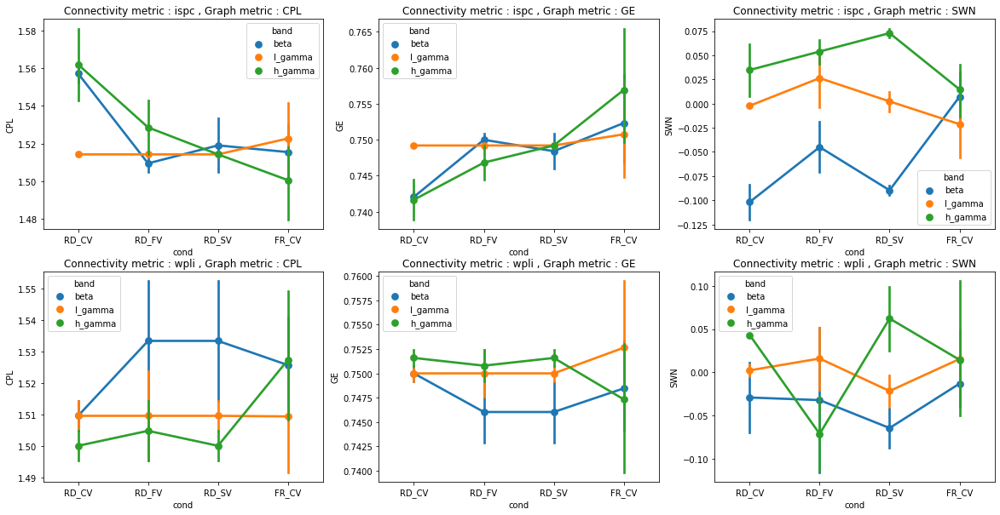

In [ ]:
fig , axs = plt.subplots(nrows = len(metrics), ncols = len(outcomes), figsize = (20,10))
for row, metric in enumerate(metrics):
    for col, outcome in enumerate(outcomes):
        ax = axs[row, col]
        sns.pointplot(data=df_DFC_all[df_DFC_all['metric'] == metric], x = 'cond', y = outcome, ax=ax, hue = 'band')
        # auto_stats(df=df_DFC_all[df_DFC_all['metric'] == metric], predictor = 'cond', outcome = outcome, ax=ax, subject = 'sujet')
        ax.set_title(f'Connectivity metric : {metric} , Graph metric : {outcome}')

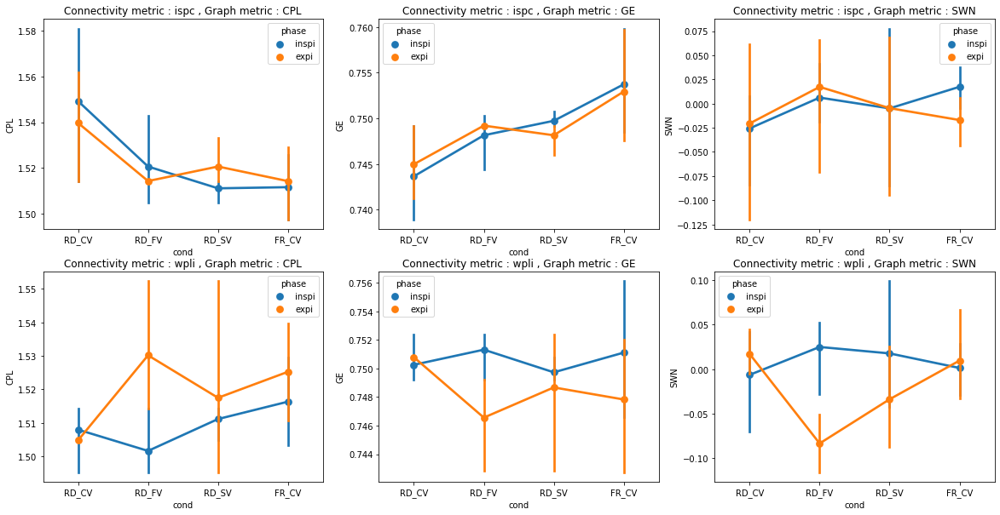

In [ ]:
fig , axs = plt.subplots(nrows = len(metrics), ncols = len(outcomes), figsize = (20,10))
for row, metric in enumerate(metrics):
    for col, outcome in enumerate(outcomes):
        ax = axs[row, col]
        sns.pointplot(data=df_DFC_all[df_DFC_all['metric'] == metric], x = 'cond', y = outcome, ax=ax, hue = 'phase')
        # auto_stats(df=df_DFC_all[df_DFC_all['metric'] == metric], predictor = 'cond', outcome = outcome, ax=ax, subject = 'sujet')
        ax.set_title(f'Connectivity metric : {metric} , Graph metric : {outcome}')

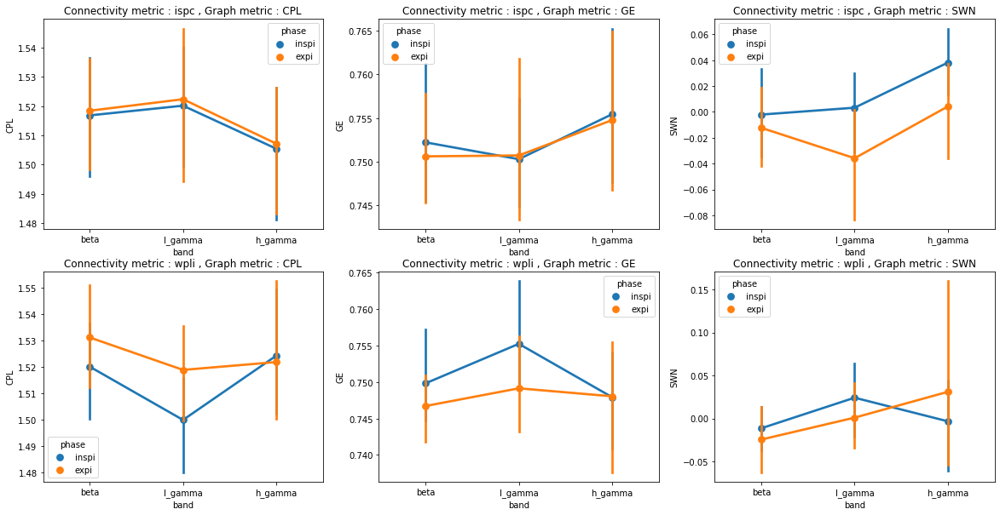

In [ ]:
fig , axs = plt.subplots(nrows = len(metrics), ncols = len(outcomes), figsize = (20,10))
for row, metric in enumerate(metrics):
    for col, outcome in enumerate(outcomes):
        ax = axs[row, col]
        sns.pointplot(data=df_DFC_all[df_DFC_all['metric'] == metric], x = 'band', y = outcome, ax=ax, hue = 'phase')
        # auto_stats(df=df_DFC_all[df_DFC_all['metric'] == metric], predictor = 'cond', outcome = outcome, ax=ax, subject = 'sujet')
        ax.set_title(f'Connectivity metric : {metric} , Graph metric : {outcome}')

## FR CV

In [ ]:
df_DFC_FR_CV = df_DFC[df_DFC['cond'] == 'FR_CV']

In [ ]:
df_DFC_FR_CV

,sujet,cond,band,metric,phase,CPL,GE,SWN,Unnamed: 0
36,CHEe,FR_CV,beta,ispc,inspi,1.542857,0.744444,-0.096418,0
37,CHEe,FR_CV,beta,ispc,expi,1.514286,0.749206,-0.053109,0
38,CHEe,FR_CV,beta,wpli,inspi,1.533333,0.746032,-0.050328,0
39,CHEe,FR_CV,beta,wpli,expi,1.523810,0.747619,-0.036402,0
40,CHEe,FR_CV,l_gamma,ispc,inspi,1.523810,0.747619,0.024353,0
...,...,...,...,...,...,...,...,...,...
7,pat_03138_1601,FR_CV,l_gamma,wpli,expi,1.555556,0.740741,-0.048929,0
8,pat_03138_1601,FR_CV,h_gamma,ispc,inspi,1.527778,0.745370,0.005455,0
9,pat_03138_1601,FR_CV,h_gamma,ispc,expi,1.527778,0.745370,-0.172468,0
10,pat_03138_1601,FR_CV,h_gamma,wpli,inspi,1.500000,0.750000,0.090613,0


In [ ]:
df_DFC_FR_CV.groupby(['metric','phase']).mean()

CPL        GE       SWN  Unnamed: 0
metric phase                                          
ispc   expi   1.514251  0.752942 -0.017021         0.0
       inspi  1.511615  0.753734  0.017386         0.0
wpli   expi   1.525228  0.747832  0.009648         0.0
       inspi  1.516305  0.751118  0.001360         0.0

In [ ]:
df_DFC_FR_CV.groupby(['metric','phase']).std()

CPL        GE       SWN  Unnamed: 0
metric phase                                          
ispc   expi   0.054378  0.020668  0.086335         0.0
       inspi  0.049740  0.019494  0.071553         0.0
wpli   expi   0.051080  0.016731  0.175285         0.0
       inspi  0.050124  0.016572  0.098345         0.0

In [ ]:
df_DFC_FR_CV.groupby('band').mean()

,CPL,GE,SWN,Unnamed: 0
band,,,,
beta,1.520564,0.750393,-0.002997,0.0
h_gamma,1.513967,0.752130,0.014517,0.0
l_gamma,1.516018,0.751697,-0.002991,0.0


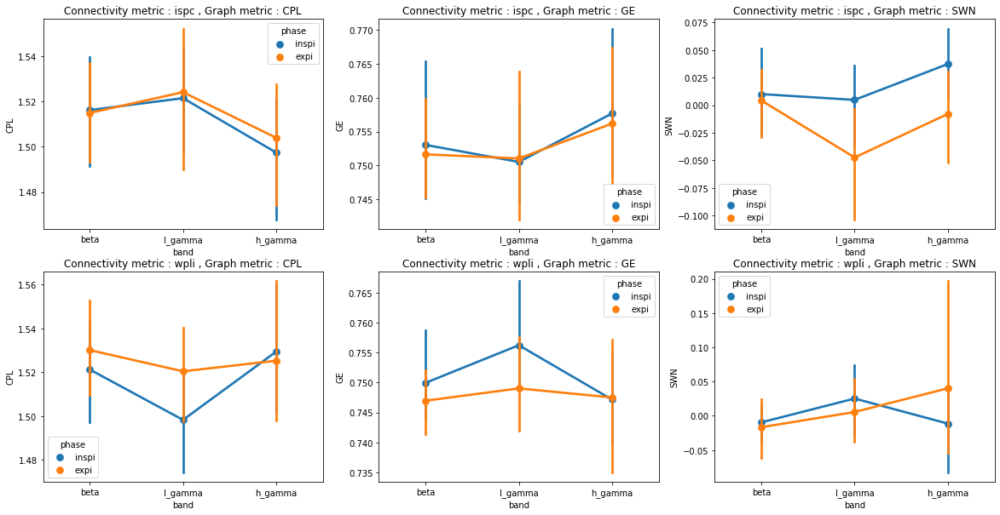

In [ ]:
fig , axs = plt.subplots(nrows = len(metrics), ncols = len(outcomes), figsize = (20,10))
for row, metric in enumerate(metrics):
    for col, outcome in enumerate(outcomes):
        ax = axs[row, col]
        sns.pointplot(data=df_DFC_FR_CV[df_DFC_FR_CV['metric'] == metric], x = 'band', y = outcome, ax=ax, hue = 'phase')
        # auto_stats(df=df_DFC_all[df_DFC_all['metric'] == metric], predictor = 'cond', outcome = outcome, ax=ax, subject = 'sujet')
        ax.set_title(f'Connectivity metric : {metric} , Graph metric : {outcome}')

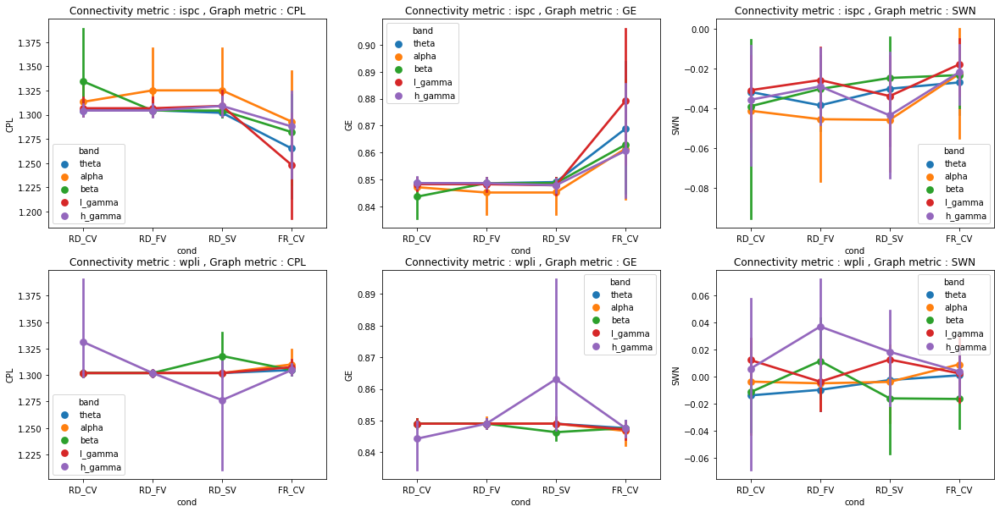

In [ ]:
fig , axs = plt.subplots(nrows = len(metrics), ncols = len(outcomes), figsize = (20,10))
for row, metric in enumerate(metrics):
    for col, outcome in enumerate(outcomes):
        ax = axs[row, col]
        sns.pointplot(data=df_FC_all[df_FC_all['metric'] == metric], x = 'cond', y = outcome, ax=ax, hue = 'band')
        # auto_stats(df=df_DFC_all[df_DFC_all['metric'] == metric], predictor = 'cond', outcome = outcome, ax=ax, subject = 'sujet')
        ax.set_title(f'Connectivity metric : {metric} , Graph metric : {outcome}')

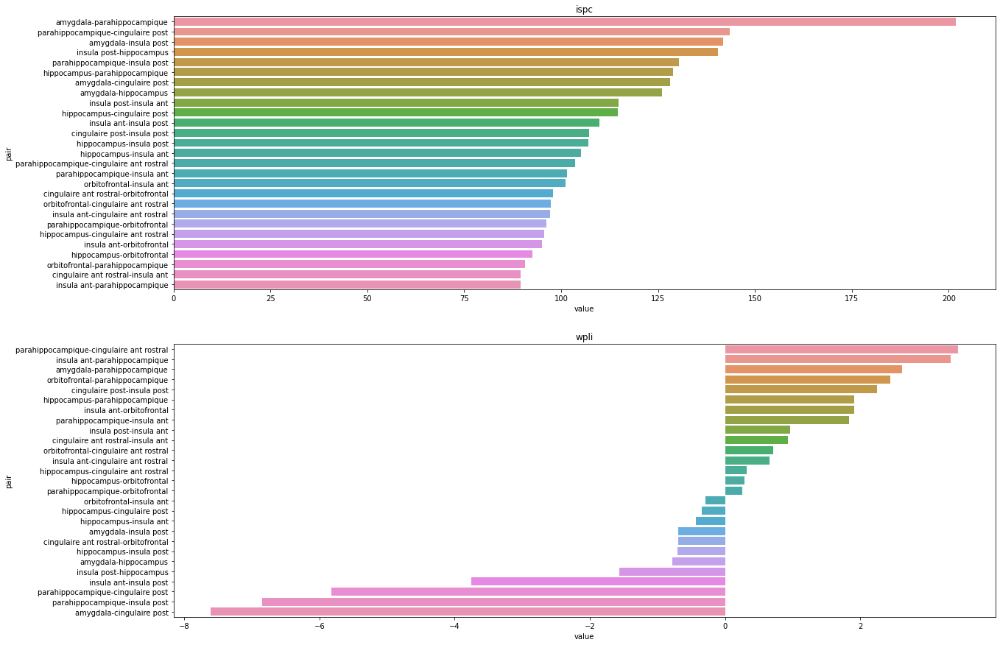

In [ ]:
fig, axs = plt.subplots(nrows = metrics.size, figsize = (20,15))
for row , metric in enumerate(metrics):
    ax = axs[row]
    sns.barplot(data=df_raw_DFC_all[df_raw_DFC_all['metric'] == metric].groupby('pair').mean().sort_values(by = 'value', ascending = False).reset_index() , x='value',y='pair', orient = 'h', ax=ax)
    ax.set_title(metric)

In [ ]:
df_raw_DFC_all[(df_raw_DFC_all['metric'] == 'ispc') & (df_raw_DFC_all['phase'] == 'whole') & (df_raw_DFC_all['pair'] == 'amygdala-hippocampus')]

,sujet,cond,band,metric,phase,pair,value
690,CHEe,RD_CV,beta,ispc,whole,amygdala-hippocampus,342.144616
693,CHEe,RD_CV,beta,ispc,whole,amygdala-hippocampus,341.682007
696,CHEe,RD_CV,beta,ispc,whole,amygdala-hippocampus,342.523645
699,CHEe,RD_CV,beta,ispc,whole,amygdala-hippocampus,379.710430
702,CHEe,RD_CV,beta,ispc,whole,amygdala-hippocampus,423.948225
...,...,...,...,...,...,...,...
20169,GOBc,FR_CV,h_gamma,ispc,whole,amygdala-hippocampus,280.019719
20172,GOBc,FR_CV,h_gamma,ispc,whole,amygdala-hippocampus,222.205574
20175,GOBc,FR_CV,h_gamma,ispc,whole,amygdala-hippocampus,239.144558
20178,GOBc,FR_CV,h_gamma,ispc,whole,amygdala-hippocampus,281.034029


In [ ]:
# pairs = df_raw_DFC_all['pair'].unique()
# pairs = pairs.reshape(9,3)

# for metric in df_raw_DFC_all['metric'].unique():
#     fig , axs = plt.subplots(nrows = pairs.shape[0], ncols = pairs.shape[1], figsize = (20,40), constrained_layout = True)
#     for row, sublist in enumerate(pairs):
#         for col, pair in enumerate(sublist):
#             # print(pair)
#             ax = axs[row, col]
#             to_stats = df_raw_DFC_all[(df_raw_DFC_all['metric'] == metric)  & (df_raw_DFC_all['pair'] == pair)]
#             # print('shape', to_stats.shape[0], 'pair', pair)
#             if to_stats.shape[0] != 0:
#                 auto_stats(df=to_stats, predictor = 'cond', outcome = 'value', design = 'between', ax=ax, order = ['FR_CV','RD_SV','RD_CV','RD_FV'])
#             # sns.boxplot(data=to_stats, x='cond', y = 'value', ax=ax, order = ['FR_CV','RD_SV','RD_CV','RD_FV'])
#             ax.set_ylabel(pair)

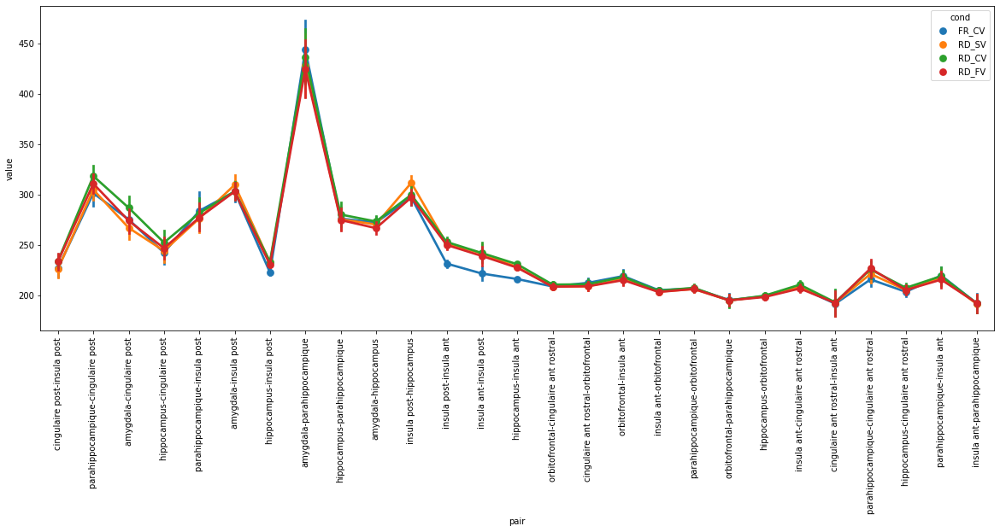

In [ ]:
fig, ax = plt.subplots(figsize = (20,7))
sns.pointplot(data=df_raw_DFC_all[(df_raw_DFC_all['metric'] == 'ispc') & (df_raw_DFC_all['phase'] == 'whole')], x = 'pair', y = 'value', hue = 'cond', ax=ax, hue_order = ['FR_CV','RD_SV','RD_CV','RD_FV'])
plt.xticks(rotation = 90)
plt.show()

<AxesSubplot:xlabel='value', ylabel='pair'>

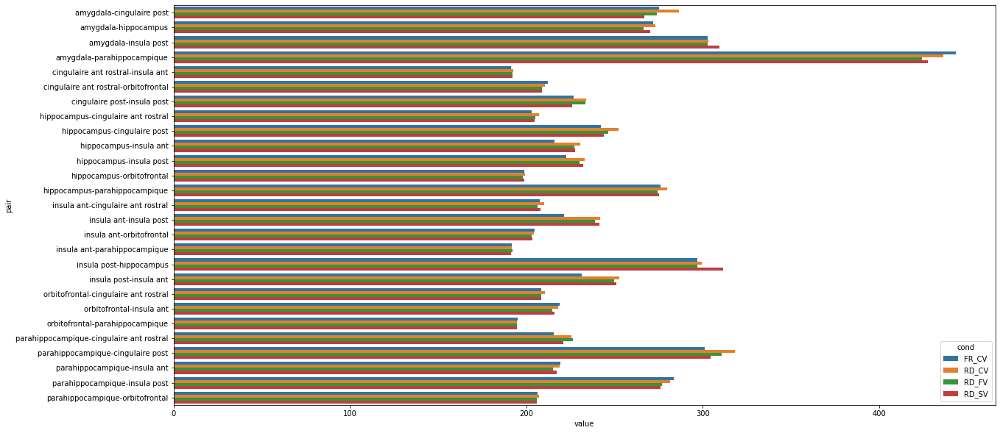

In [ ]:
fig ,ax = plt.subplots(figsize = (20,10))
sns.barplot(data= df_raw_DFC_all[(df_raw_DFC_all['metric'] == 'ispc') & (df_raw_DFC_all['phase'] == 'whole')].groupby(['cond','pair']).mean().reset_index(), x = 'value', y = 'pair', hue = 'cond', orient = 'h', ax=ax) 

<AxesSubplot:ylabel='pair'>

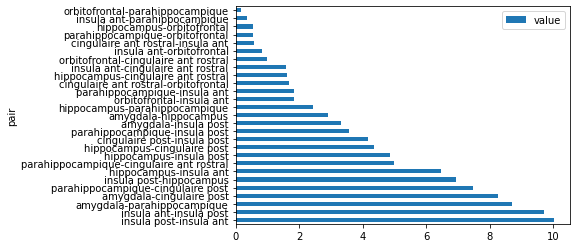

In [ ]:
df_raw_DFC_all[(df_raw_DFC_all['metric'] == 'ispc') & (df_raw_DFC_all['phase'] == 'whole')].groupby(['cond','pair']).mean().groupby('pair').std().sort_values(by = 'value', ascending=False).plot.barh()

In [ ]:
x = df_raw_DFC_all[df_raw_DFC_all['metric'] == 'ispc'].groupby(['sujet','cond','band','metric','phase']).mean().reset_index()
x = x[x['phase'] == 'expi']['value']

In [ ]:
y = df_raw_DFC_all[df_raw_DFC_all['metric'] == 'ispc'].groupby(['sujet','cond','band','metric','phase']).mean().reset_index()
y = y[y['phase'] == 'whole']['value']

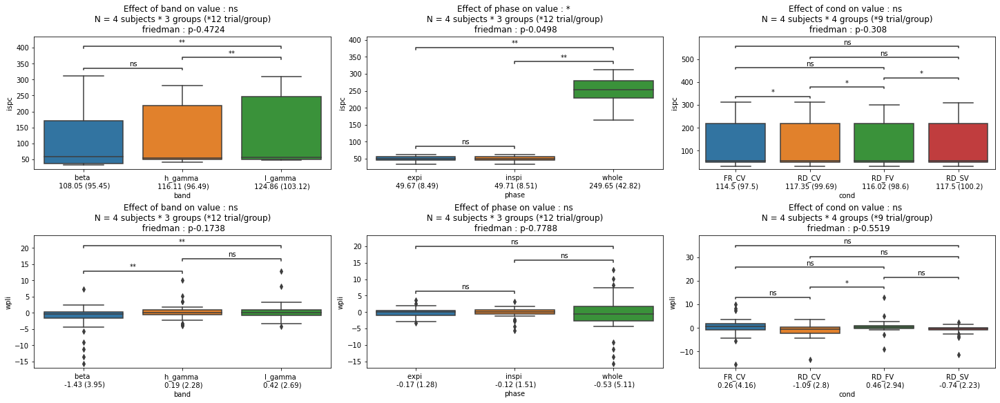

In [ ]:
fig, axs = plt.subplots(nrows = 2, ncols = 3, figsize = (20,8), constrained_layout = True)
for col, predictor in enumerate(['band','phase','cond']):
    for row, metric in enumerate(df_raw_DFC_all['metric'].unique()):
        ax = axs[row , col]
        auto_stats(df=df_raw_DFC_all[df_raw_DFC_all['metric'] == metric].groupby(['sujet','cond','band','metric','phase']).mean().reset_index(), predictor = predictor, outcome = 'value', ax=ax, subject = 'sujet', transform=False)
        ax.set_ylabel(metric)

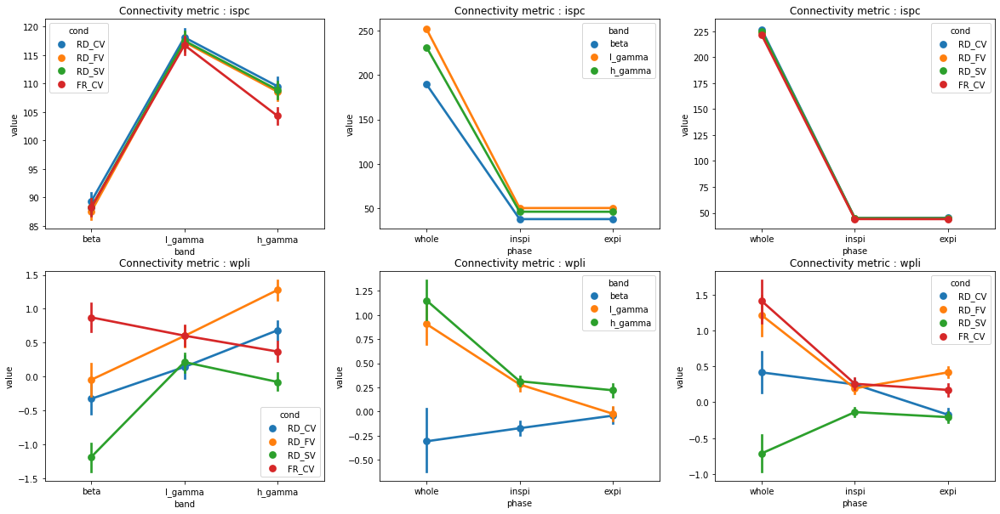

In [ ]:
fig , axs = plt.subplots(nrows = 2, ncols = 3, figsize = (20,10))
for row, metric in enumerate(metrics):
    for col, comparison in enumerate([('band','cond'),('phase','band'),('phase','cond')]):
        ax = axs[row, col]
        sns.pointplot(data=df_raw_DFC_all[df_raw_DFC_all['metric'] == metric], x = comparison[0], y = 'value', ax=ax, hue = comparison[1])
        ax.set_title(f'Connectivity metric : {metric}')

/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(
/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(
/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(
/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values 

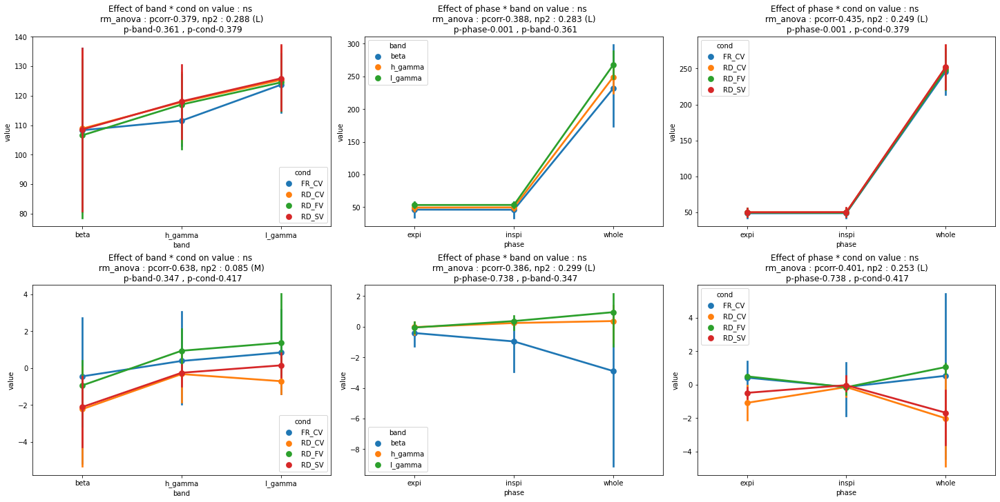

In [ ]:
fig , axs = plt.subplots(nrows = 2, ncols = 3, figsize = (20,10), constrained_layout =True)
for row, metric in enumerate(metrics):
    for col, comparison in enumerate([['band','cond'],['phase','band'],['phase','cond']]):
        ax = axs[row, col]
        auto_stats(df=df_raw_DFC_all[df_raw_DFC_all['metric'] == metric].groupby(['sujet',comparison[0], comparison[1]]).mean().reset_index(), predictor = comparison, outcome = 'value', ax=ax, subject = 'sujet')

In [ ]:
df_raw_DFC_all[(df_raw_DFC_all['pair'] == 'amygdala-hippocampus') & (df_raw_DFC_all['phase'] == 'whole')]

,sujet,cond,band,metric,phase,pair,value
690,CHEe,RD_CV,beta,ispc,whole,amygdala-hippocampus,342.144616
693,CHEe,RD_CV,beta,ispc,whole,amygdala-hippocampus,341.682007
696,CHEe,RD_CV,beta,ispc,whole,amygdala-hippocampus,342.523645
699,CHEe,RD_CV,beta,ispc,whole,amygdala-hippocampus,379.710430
702,CHEe,RD_CV,beta,ispc,whole,amygdala-hippocampus,423.948225
...,...,...,...,...,...,...,...
20865,GOBc,FR_CV,h_gamma,wpli,whole,amygdala-hippocampus,-6.046848
20868,GOBc,FR_CV,h_gamma,wpli,whole,amygdala-hippocampus,16.747558
20871,GOBc,FR_CV,h_gamma,wpli,whole,amygdala-hippocampus,-3.037679
20874,GOBc,FR_CV,h_gamma,wpli,whole,amygdala-hippocampus,3.545549


## FR CV

In [ ]:
df_raw_DFC_FR_CV = df_raw_DFC[df_raw_DFC['cond'] == 'FR_CV']

/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(
/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(


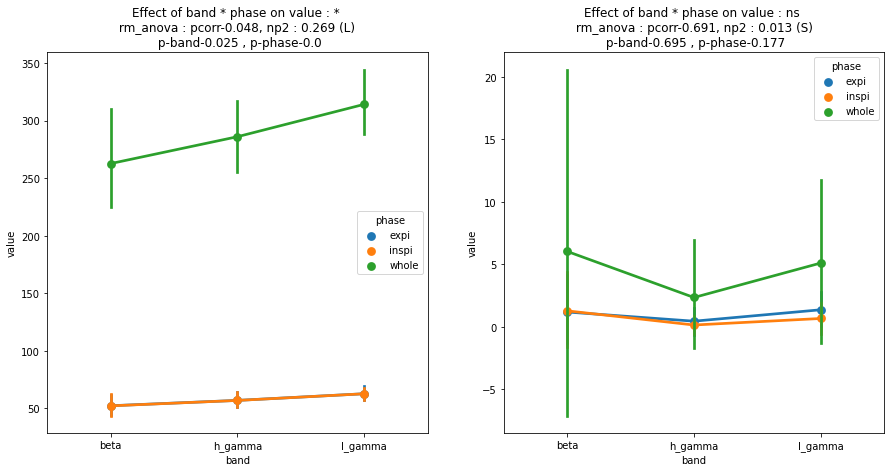

In [ ]:
fig, axs = plt.subplots(ncols = 2, figsize = (15,7))
for col, metric in enumerate(df_raw_DFC_FR_CV['metric'].unique()):
    ax = axs[col]
    auto_stats(df=df_raw_DFC_FR_CV[df_raw_DFC_FR_CV['metric'] == metric].groupby(['sujet','band','metric','phase']).mean().reset_index(), predictor = ['band','phase'], outcome = 'value', subject = 'sujet', ax=ax)

<AxesSubplot:ylabel='pair'>

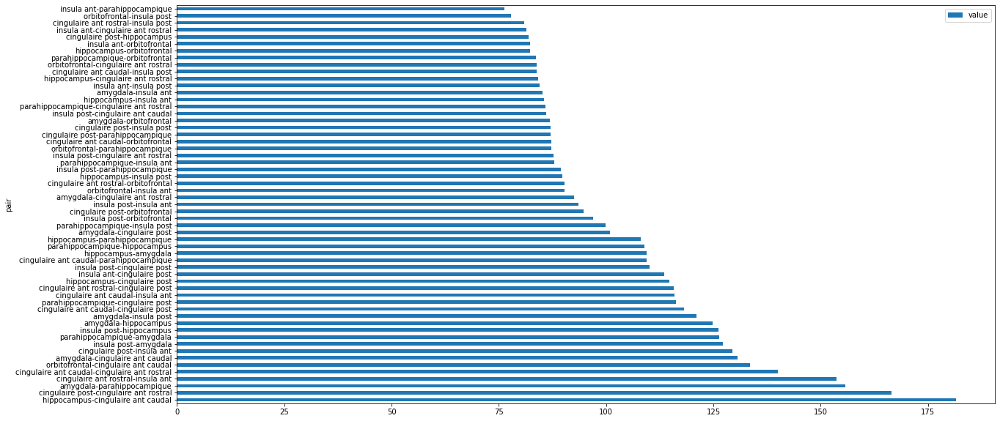

In [ ]:
fig, ax = plt.subplots(figsize = (20,10))
df_raw_DFC_FR_CV[df_raw_DFC_FR_CV['metric'] == 'ispc'].groupby('pair').std().sort_values(by='value', ascending = False).plot.barh(ax=ax)

# HRV

In [ ]:
df_HRV = pd.read_excel(folder + 'allplot_df_HRV.xlsx', index_col = 0)

In [ ]:
metrics = np.array(['HRV_MeanNN','HRV_SDNN','HRV_RMSSD','HRV_pNN50','HRV_LF','HRV_HF','HRV_SD1','HRV_SD2','HRV_S'])

In [ ]:
df_HRV

,sujet,cond,session,RDorFR,compute_type,HRV_MeanNN,HRV_SDNN,HRV_RMSSD,HRV_pNN50,HRV_LF,HRV_HF,HRV_LFHF,HRV_SD1,HRV_SD2,HRV_S,Unnamed: 0
0,CHEe,FR_CV,1,FR,homemade,825.683594,79.724006,65.594849,13.774105,0.013691,0.011711,1.169095,46.382487,102.888037,14992.318149,0
1,CHEe,FR_CV,1,FR,nk,825.644585,79.940460,65.667337,13.774105,0.034179,0.040323,0.847635,46.498080,103.150153,15067.970641,0
2,CHEe,RD_CV,1,RD,homemade,751.481120,84.542716,91.440350,14.644351,0.015913,0.014406,1.104602,64.656000,100.225868,20358.160266,0
3,CHEe,RD_CV,1,RD,nk,751.479145,84.897189,91.413341,14.225941,0.038809,0.039446,0.983845,64.770103,100.547014,20459.435082,0
4,CHEe,RD_CV,2,RD,homemade,712.751667,115.044344,118.147343,30.158730,0.095702,0.062723,1.525790,83.541396,139.672319,36657.423927,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1,pat_03105_1551,FR_CV,1,FR,nk,748.029851,30.490571,16.353941,0.497512,0.051838,0.012066,4.296263,11.577386,41.106435,1495.099823,0
0,pat_03128_1591,FR_CV,1,FR,homemade,645.354701,195.787960,205.108589,36.188437,0.084866,0.262772,0.322965,145.033510,236.147644,107597.417551,0
1,pat_03128_1591,FR_CV,1,FR,nk,645.597430,196.137227,205.324448,35.760171,0.017336,0.041645,0.416286,145.342105,236.506988,107990.436096,0
0,pat_03138_1601,FR_CV,1,FR,homemade,602.354582,118.833548,187.277160,73.453094,0.009232,0.027921,0.330650,132.424929,103.640928,43117.236219,0


In [ ]:
df_HRV['cond'].value_counts()

FR_CV    34
RD_SV    24
RD_CV    16
RD_FV    16
Name: cond, dtype: int64

In [ ]:
df_HRV.groupby('compute_type').mean()

,session,HRV_MeanNN,HRV_SDNN,HRV_RMSSD,HRV_pNN50,HRV_LF,HRV_HF,HRV_LFHF,HRV_SD1,HRV_SD2,HRV_S,Unnamed: 0
compute_type,,,,,,,,,,,,
homemade,1.511111,730.028317,77.203969,84.237534,20.410465,0.022835,0.044368,2.086102,59.563183,89.556695,25522.741652,0.0
nk,1.511111,730.035760,77.467019,83.622525,20.018702,0.030461,0.047554,1.602680,59.232052,89.595908,25566.732266,0.0


In [ ]:
df_HRV = df_HRV[df_HRV['compute_type'] == 'homemade']

## EFFET REGIME RESPI

In [ ]:
df_HRV_all = df_HRV[df_HRV['sujet'].isin(sujets_lyon)]
df_HRV_all = df_HRV_all[~df_HRV_all['cond'].isin(['RD_AV','FR_MV'])]

In [ ]:
df_HRV_all.groupby(['sujet','cond']).mean()

session  HRV_MeanNN    HRV_SDNN   HRV_RMSSD  HRV_pNN50    HRV_LF  \
sujet cond                                                                      
CHEe  FR_CV      1.0  825.683594   79.724006   65.594849  13.774105  0.013691   
      RD_CV      1.5  732.116394   99.793530  104.793847  22.401541  0.055807   
      RD_FV      1.5  816.517351   58.513285   55.988264   8.911518  0.008098   
      RD_SV      2.0  851.994627   95.041959   83.245205  22.279530  0.034346   
GOBc  FR_CV      1.0  691.663415   44.315431   39.403126   3.178484  0.007963   
      RD_CV      1.5  691.601425   48.059896   49.225169   7.932049  0.020547   
      RD_FV      1.5  689.771403   30.367467   29.377306   2.303289  0.002652   
      RD_SV      2.0  681.556447   46.262080   49.226199   6.836602  0.005056   
MAZm  FR_CV      1.0  720.404922  135.258140  190.980178  54.484305  0.033140   
      RD_CV      1.5  703.389502  150.536935  203.867041  62.421875  0.042361   
      RD_FV      1.5  672.068608  144.936353  187.817946  61.113911  0.059864   
      RD_SV      2.0  686.420023  141.092415  192.308782  61.854351  0.032549   
TREt  FR_CV      1.0  792.771654   30.862711   23.402654   1.578947  0.003873   
      RD_CV      1.5  727.133842   32.409631   20.956226   0.605761  0.000594   
      RD_FV      1.5  788.107393   23.313903   20.392027   0.869002  0.000897   
      RD_SV      2.0  749.885728   34.605823   22.597426   1.378448  0.004340   

               HRV_HF   HRV_LFHF     HRV_SD1     HRV_SD2         HRV_S  \
sujet cond                                                               
CHEe  FR_CV  0.011711   1.169095   46.382487  102.888037  14992.318149   
      RD_CV  0.038564   1.315196   74.098698  119.949093  28507.792097   
      RD_FV  0.019722   1.200687   39.589619   72.819942   9703.172424   
      RD_SV  0.056170   1.232333   58.852604  118.709136  28688.984529   
GOBc  FR_CV  0.005177   1.538078   27.862204   56.218722   4920.920080   
      RD_CV  0.010891   1.343113   34.807446   57.679246   6949.471731   
      RD_FV  0.000287  10.264383   20.771123   37.169437   2449.836160   
      RD_SV  0.007073   1.246790   34.808135   55.100189   6284.741939   
MAZm  FR_CV  0.064745   0.511865  135.043375  135.769904  57600.554595   
      RD_CV  0.116080   0.370428  144.154407  156.787341  71011.423498   
      RD_FV  0.133907   0.457284  132.807214  155.824415  64840.901476   
      RD_SV  0.106495   0.304335  135.982127  146.131152  62485.662829   
TREt  FR_CV  0.001038   3.733052   16.546461   39.922852   2075.279306   
      RD_CV  0.002739   0.224444   14.814041   42.760247   2053.124551   
      RD_FV  0.000127   8.653529   14.419307   29.528210   1328.936032   
      RD_SV  0.001170   3.634579   15.976993   45.998673   2373.461360   

             Unnamed: 0  
sujet cond               
CHEe  FR_CV         0.0  
      RD_CV         0.0  
      RD_FV         0.0  
      RD_SV         0.0  
GOBc  FR_CV         0.0  
      RD_CV         0.0  
      RD_FV         0.0  
      RD_SV         0.0  
MAZm  FR_CV         0.0  
      RD_CV         0.0  
      RD_FV         0.0  
      RD_SV         0.0  
TREt  FR_CV         0.0  
      RD_CV         0.0  
      RD_FV         0.0  
      RD_SV         0.0

Successfull transformation


/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d


Successfull transformation


/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:977: RuntimeWarning: divide by zero encountered in double_scalars
  W = np.product(eig) / (eig.sum() / d) ** d


Successfull transformation
Successfull transformation


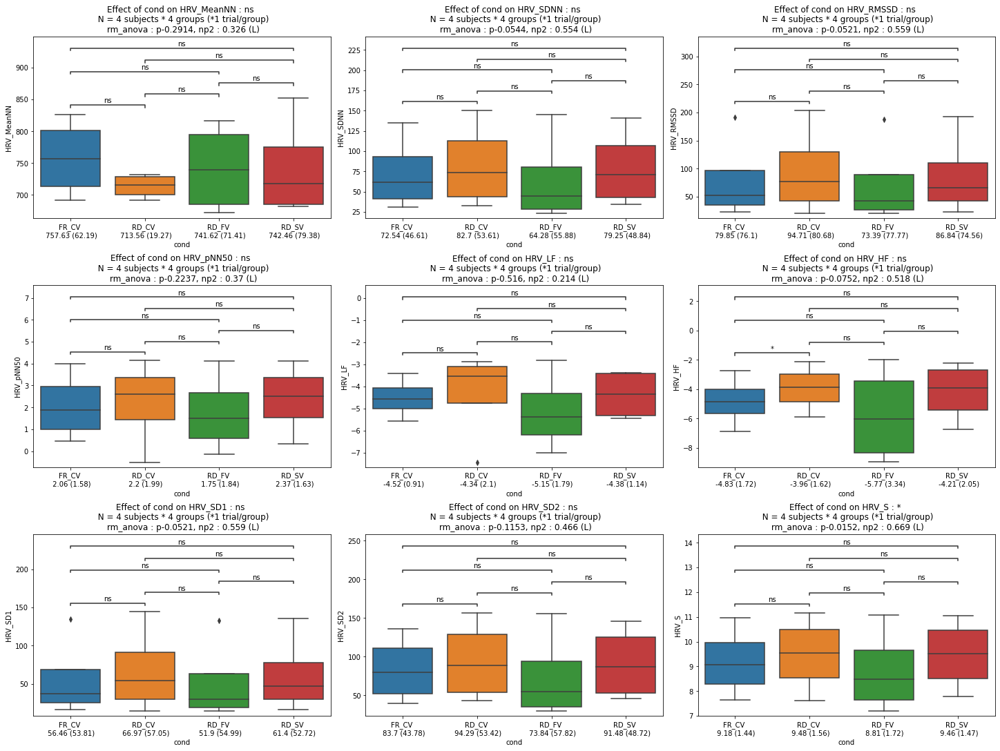

In [ ]:
metrics_sublists = metrics.reshape(3,3)

fig, axs = plt.subplots(ncols= 3, nrows = 3, figsize = (20,15), constrained_layout = True)

for row, sublist in enumerate(metrics_sublists):
    for col, metric in enumerate(sublist):
        ax = axs[row, col]
        auto_stats(df=df_HRV_all.groupby(['sujet','cond']).mean().reset_index(), predictor = 'cond', outcome = metric, subject='sujet', ax=ax, transform = True)

## EFFET RESPI DRIVER

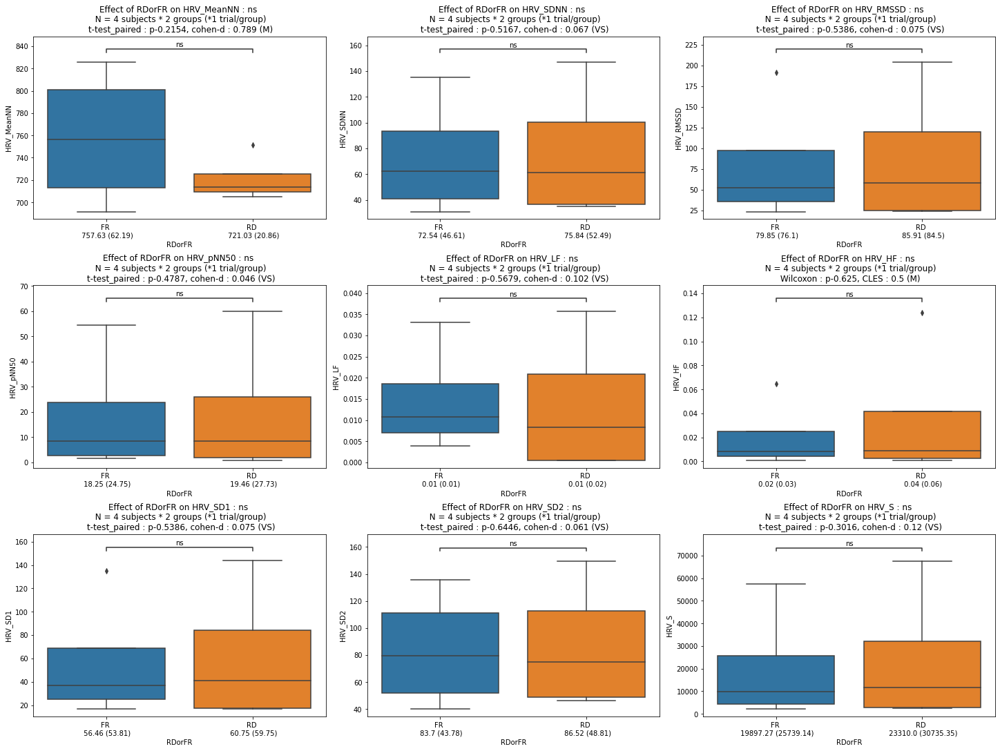

In [ ]:
metrics_sublists = metrics.reshape(3,3)

fig, axs = plt.subplots(ncols= 3, nrows = 3, figsize = (20,15), constrained_layout = True)

for row, sublist in enumerate(metrics_sublists):
    for col, metric in enumerate(sublist):
        ax = axs[row, col]
        auto_stats(df=df_HRV[(df_HRV['sujet'].isin(sujets_lyon)) & (df_HRV['cond'].isin(['FR_CV','RD_CV'])) & (df_HRV['session'] == 1)], predictor = 'RDorFR', outcome = metric, subject = 'sujet',ax=ax)

# ITPC

In [ ]:
file = folder + 'allplot_df_ITPC_IE.xlsx'
df_ITPC = pd.read_excel(file, index_col = 0).drop(columns = 'Unnamed: 0')

In [ ]:
predictors = ['cond','band','phase']
outcome = 'Pxx'

In [ ]:
df_ITPC

,sujet,cond,chan,ROI,Lobe,side,band,phase,Pxx
0,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,inspi,6.661724
1,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,expi,6.293704
2,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,IE,5.563021
3,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,EI,5.491722
4,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,alpha,inspi,7.050847
...,...,...,...,...,...,...,...,...,...
1171,pat_03138_1601,FR_CV,TPol_4,temporal sup,Temporal,l,l_gamma,EI,20.925597
1172,pat_03138_1601,FR_CV,TPol_4,temporal sup,Temporal,l,h_gamma,inspi,19.871964
1173,pat_03138_1601,FR_CV,TPol_4,temporal sup,Temporal,l,h_gamma,expi,21.533856
1174,pat_03138_1601,FR_CV,TPol_4,temporal sup,Temporal,l,h_gamma,IE,21.172275


## ALL CONDITIONS

In [ ]:
df_ITPC_all = df_ITPC[df_ITPC['sujet'].isin(sujets_lyon)]
df_ITPC_all = df_ITPC_all[~df_ITPC_all['cond'].isin(['RD_AV','FR_MV'])]

In [ ]:
df_ITPC_all

,sujet,cond,chan,ROI,Lobe,side,band,phase,Pxx
0,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,inspi,6.661724
1,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,expi,6.293704
2,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,IE,5.563021
3,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,EI,5.491722
4,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,alpha,inspi,7.050847
...,...,...,...,...,...,...,...,...,...
17555,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,l_gamma,EI,21.770735
17556,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,h_gamma,inspi,22.579242
17557,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,h_gamma,expi,22.473577
17558,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,h_gamma,IE,23.561953


In [ ]:
df_ITPC_all.groupby('cond').mean()

,Pxx
cond,
FR_CV,22.451129
RD_CV,7.430320
RD_FV,5.129524
RD_SV,1.352688


In [ ]:
df_ITPC_all.groupby('phase').mean()

,Pxx
phase,
EI,9.085672
IE,9.109149
expi,9.116837
inspi,9.052003


In [ ]:
df_ITPC_all

,sujet,cond,chan,ROI,Lobe,side,band,phase,Pxx
0,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,inspi,6.661724
1,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,expi,6.293704
2,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,IE,5.563021
3,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,EI,5.491722
4,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,alpha,inspi,7.050847
...,...,...,...,...,...,...,...,...,...
17555,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,l_gamma,EI,21.770735
17556,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,h_gamma,inspi,22.579242
17557,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,h_gamma,expi,22.473577
17558,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,h_gamma,IE,23.561953


In [ ]:
df_ITPC_all.groupby(['sujet','cond','ROI']).mean().reset_index()

,sujet,cond,ROI,Pxx
0,CHEe,FR_CV,WM,21.874824
1,CHEe,FR_CV,amygdala,22.381034
2,CHEe,FR_CV,choroide plexus,22.442942
3,CHEe,FR_CV,cingulaire post,21.996461
4,CHEe,FR_CV,hippocampus,22.072950
...,...,...,...,...
239,TREt,RD_SV,pars triangularis,1.308210
240,TREt,RD_SV,pole temporal,1.319365
241,TREt,RD_SV,temporal inf,1.308731
242,TREt,RD_SV,temporal med,1.330471


<AxesSubplot:title={'center':'Effect of cond on Pxx : ** \n N = 4 subjects * 4 groups (*15 trial/group) \n friedman : p-0.0074'}, xlabel='cond', ylabel='Pxx'>

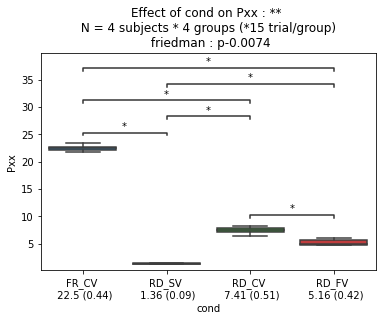

In [ ]:
auto_stats(df=df_ITPC_all.groupby(['sujet','cond','ROI']).mean().reset_index(), predictor = 'cond', outcome = 'Pxx', subject = 'sujet', transform=False, order = ['FR_CV','RD_SV','RD_CV','RD_FV'])

<AxesSubplot:title={'center':'Effect of phase on Pxx : ns \n  N = 4 subjects * 4 groups (*1 trial/group) \n rm_anova : p-0.4162, np2 : 0.26 (L)'}, xlabel='phase', ylabel='Pxx'>

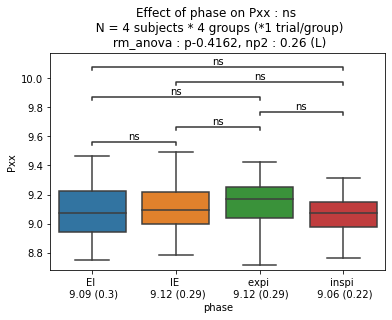

In [ ]:
auto_stats(df=df_ITPC_all.groupby(['sujet','phase']).mean().reset_index(), predictor = 'phase', outcome = 'Pxx', subject = 'sujet', transform=False)

/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(
/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(
/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(


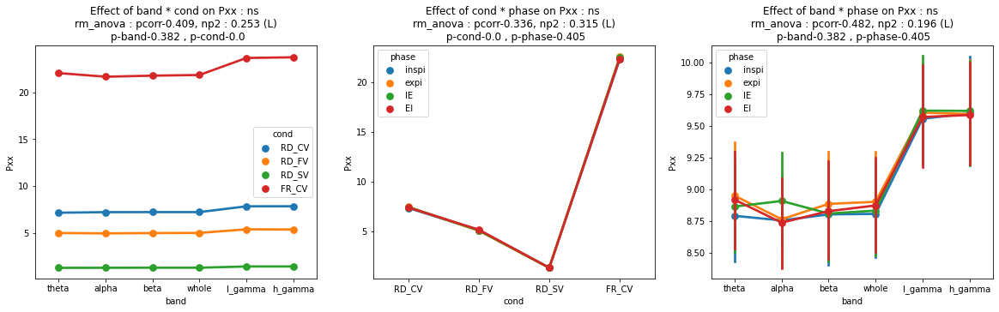

In [ ]:
pairs = [['band','cond'],['cond','phase'],['band','phase']]
fig, axs = plt.subplots(ncols = len(pairs), figsize = (20,5))
for col,pair in enumerate(pairs):
    ax = axs[col]
    auto_stats(df=df_ITPC_all, predictor = pair, outcome = 'Pxx', subject = 'sujet', design = 'within', ax=ax, transform = False)

<AxesSubplot:xlabel='cond', ylabel='Pxx'>

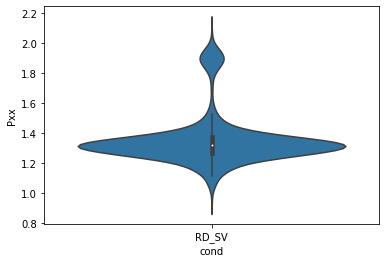

In [ ]:
sns.violinplot(data=df_ITPC_all[df_ITPC_all['cond'] == 'RD_SV'], x = 'cond', y = 'Pxx')

In [ ]:
df_ITPC_all

,sujet,cond,chan,ROI,Lobe,side,band,phase,Pxx
0,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,inspi,6.661724
1,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,expi,6.293704
2,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,IE,5.563021
3,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,theta,EI,5.491722
4,CHEe,RD_CV,Jp01,temporal sup,Temporal,l,alpha,inspi,7.050847
...,...,...,...,...,...,...,...,...,...
17555,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,l_gamma,EI,21.770735
17556,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,h_gamma,inspi,22.579242
17557,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,h_gamma,expi,22.473577
17558,TREt,FR_CV,Up12,orbitofrontal,Frontal,l,h_gamma,IE,23.561953


In [ ]:
df_ITPC_all.groupby(['sujet','cond','ROI']).mean()

Pxx
sujet cond  ROI                         
CHEe  FR_CV WM                 21.874824
            amygdala           22.381034
            choroide plexus    22.442942
            cingulaire post    21.996461
            hippocampus        22.072950
...                                  ...
TREt  RD_SV pars triangularis   1.308210
            pole temporal       1.319365
            temporal inf        1.308731
            temporal med        1.330471
            temporal sup        1.318109

[244 rows x 1 columns]

In [ ]:
df_ITPC_all.groupby(['cond','phase']).std()

Pxx
cond  phase          
FR_CV EI     2.361593
      IE     2.245910
      expi   2.355873
      inspi  2.324935
RD_CV EI     1.059075
      IE     1.017976
      expi   1.042461
      inspi  1.008685
RD_FV EI     0.781938
      IE     0.787283
      expi   0.816838
      inspi  0.721542
RD_SV EI     0.172725
      IE     0.174689
      expi   0.176855
      inspi  0.170923

<AxesSubplot:xlabel='cond', ylabel='Pxx'>

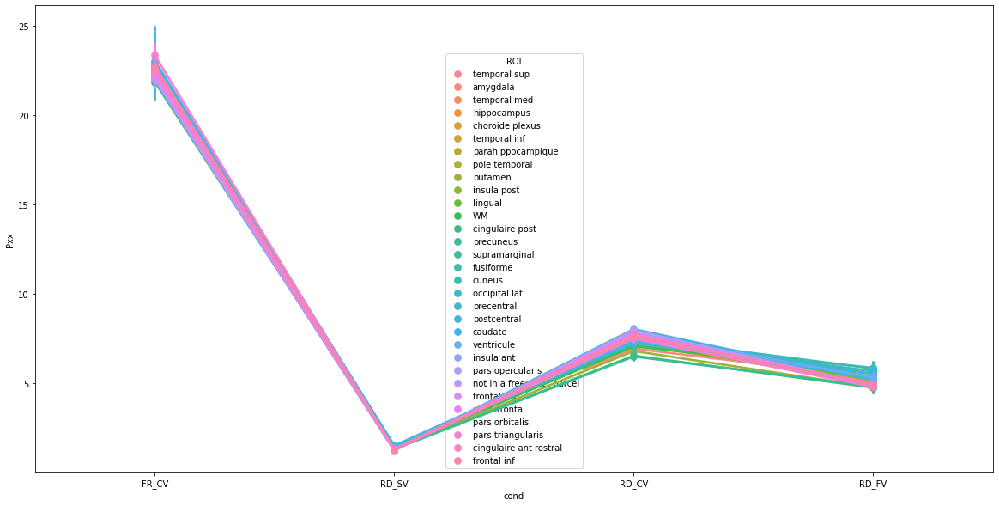

In [ ]:
fig, ax = plt.subplots(figsize = (20,10))
sns.pointplot(data=df_ITPC_all , x = 'cond',y = 'Pxx', hue = 'ROI',ax=ax, order = ['FR_CV','RD_SV','RD_CV','RD_FV'])
# ax.tick_params(axis='x', rotation=90)

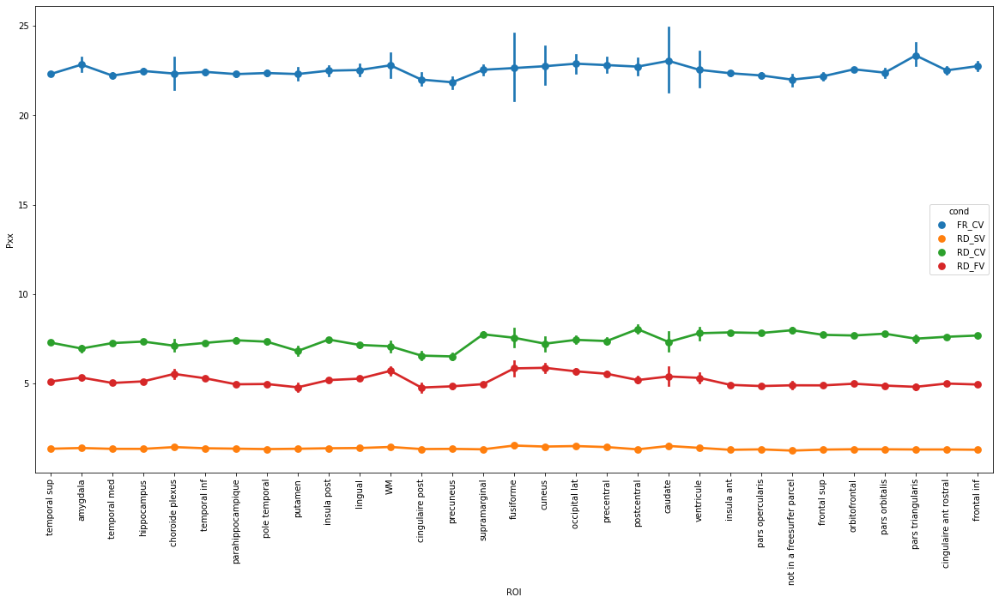

In [ ]:
fig, ax = plt.subplots(figsize = (20,10))
sns.pointplot(data=df_ITPC_all , x = 'ROI',y = 'Pxx', hue = 'cond',ax=ax, hue_order = ['FR_CV','RD_SV','RD_CV','RD_FV'])
ax.tick_params(axis='x', rotation=90)

<AxesSubplot:title={'center':'Effect of cond on Pxx : ** \n N = 4 subjects * 4 groups (*15 trial/group) \n friedman : p-0.0074'}, xlabel='cond', ylabel='Pxx'>

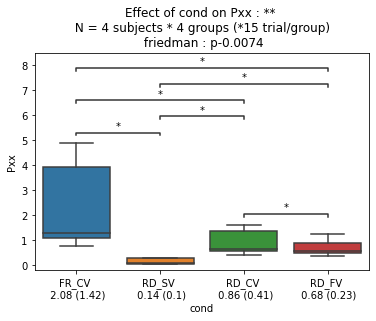

In [ ]:
auto_stats(df=df_ITPC_all.groupby(['sujet','cond','ROI']).std().reset_index(), predictor = 'cond', outcome = 'Pxx', subject = 'sujet', order = ['FR_CV','RD_SV','RD_CV','RD_FV'])

<AxesSubplot:xlabel='cond', ylabel='Pxx'>

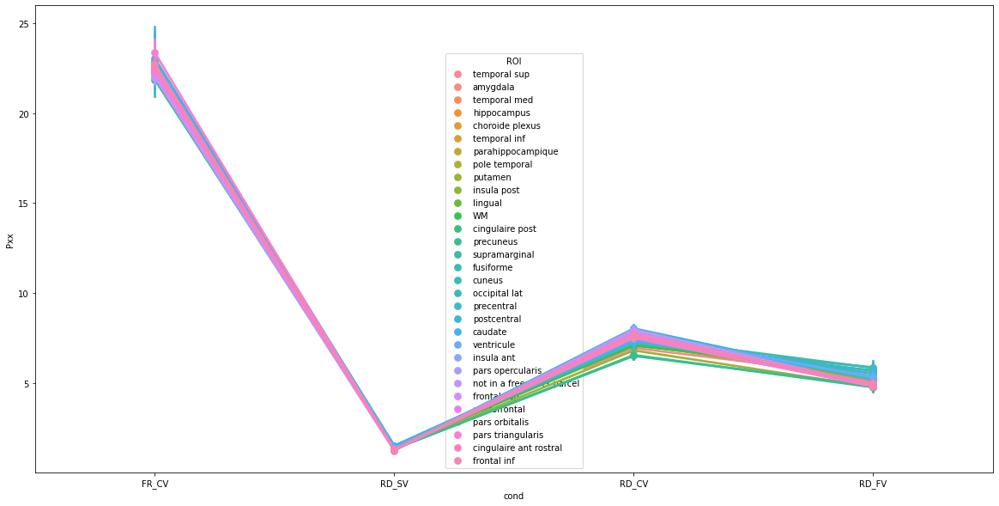

In [ ]:
fig, ax = plt.subplots(figsize = (20,10))
sns.pointplot(data=df_ITPC_all , x = 'cond',y = 'Pxx', hue = 'ROI',ax=ax, order = ['FR_CV','RD_SV','RD_CV','RD_FV'])
# ax.tick_params(axis='x', rotation=90)

In [ ]:
mapper_n_rois = {roi:df_ITPC_all['ROI'].value_counts()[roi] for roi in df_ITPC_all.groupby(['ROI']).mean().index}

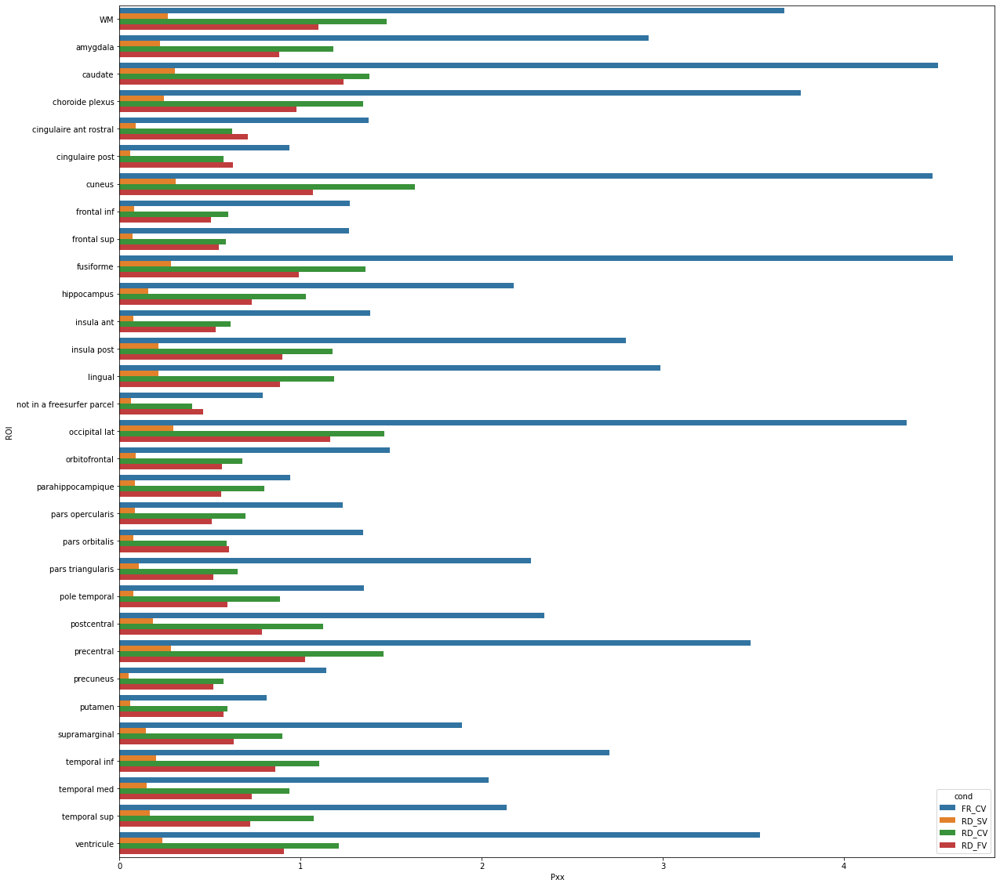

In [ ]:
fig, ax = plt.subplots(figsize = (20,20))
sns.barplot(data=df_ITPC_all.groupby(['cond','ROI']).std().reset_index(), y='ROI', x = 'Pxx', hue = 'cond', orient = 'h', ax=ax, hue_order = ['FR_CV','RD_SV','RD_CV','RD_FV'])
# ax.bar_label(container=ax.containers[0], labels=mapper_n_rois.values())
plt.show()

In [ ]:
df_ratio_sd_FR_SV = pd.DataFrame(data=(df_ITPC_all.groupby(['band','cond','ROI']).std().query("cond == 'FR_CV'").values / df_ITPC_all.groupby(['band','cond','ROI']).std().query("cond == 'RD_SV'").values), index = (df_ITPC_all.groupby(['band','cond','ROI']).std().query("cond == 'FR_CV'").index))

<AxesSubplot:xlabel='0', ylabel='ROI'>

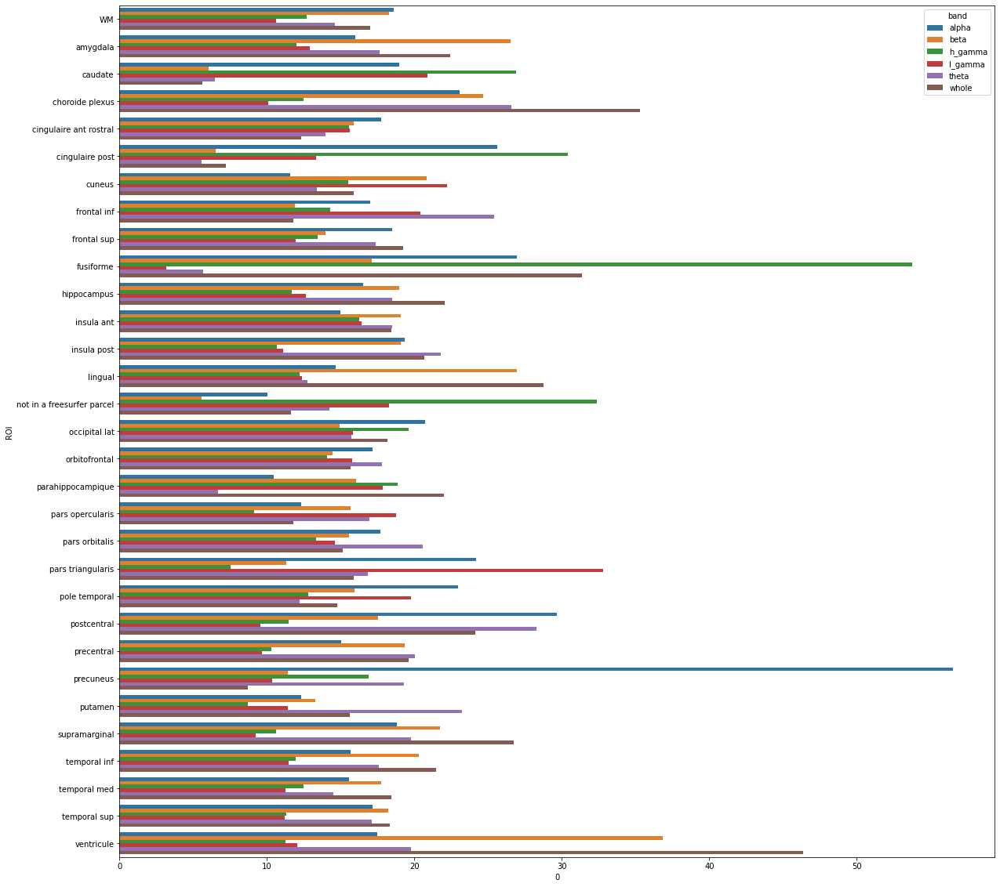

In [ ]:
fig , ax = plt.subplots(figsize = (20,20))
sns.barplot(data=df_ratio_sd_FR_SV.reset_index(), x = 0, y = 'ROI', hue='band',ax=ax)

<AxesSubplot:xlabel='cond', ylabel='Pxx'>

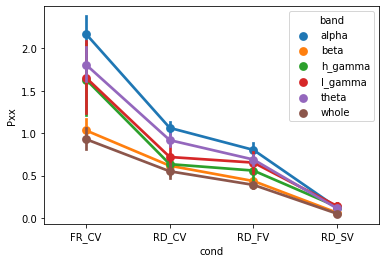

In [ ]:
sns.pointplot(data=df_ITPC_all.groupby(['band','cond','ROI']).std().reset_index(), x = 'cond', y = 'Pxx', hue = 'band')

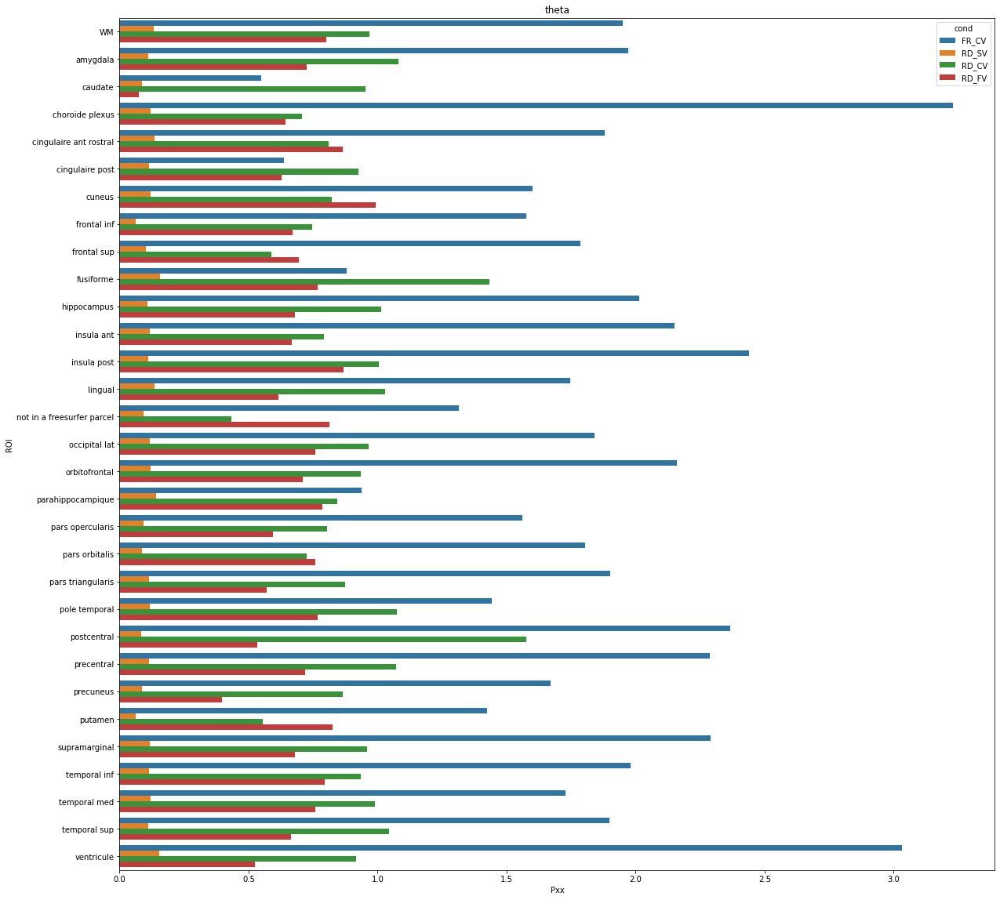

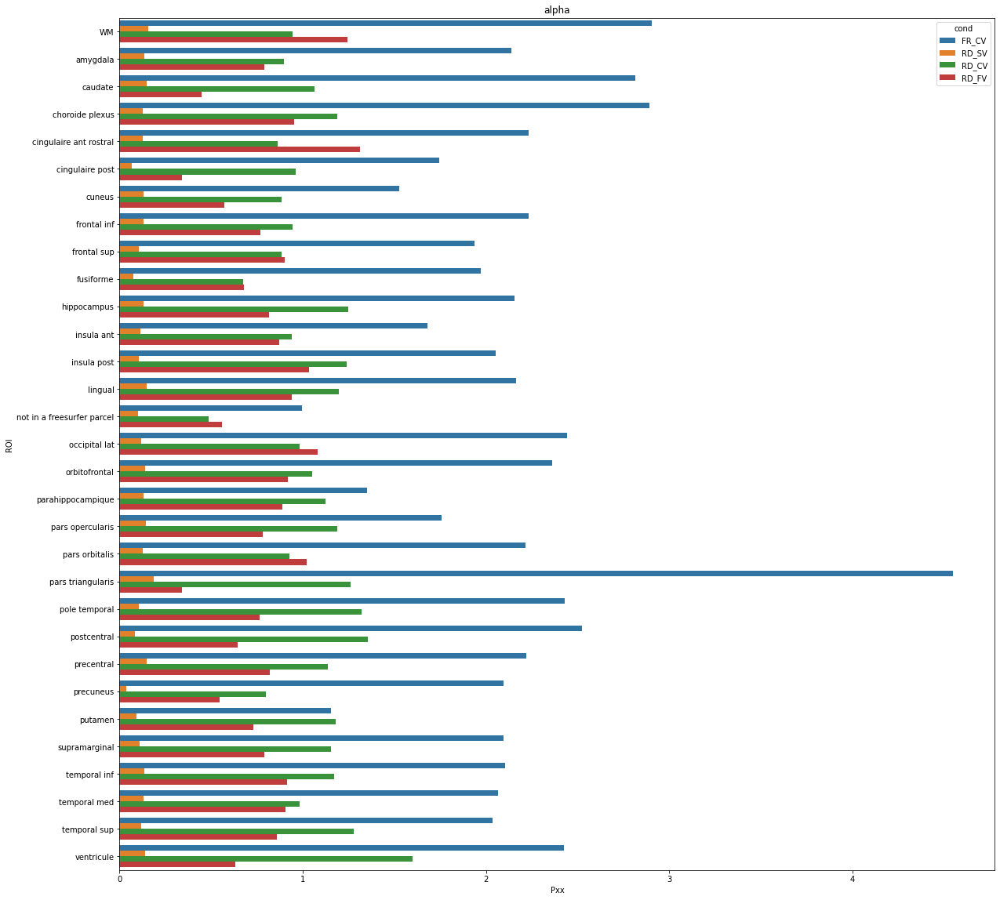

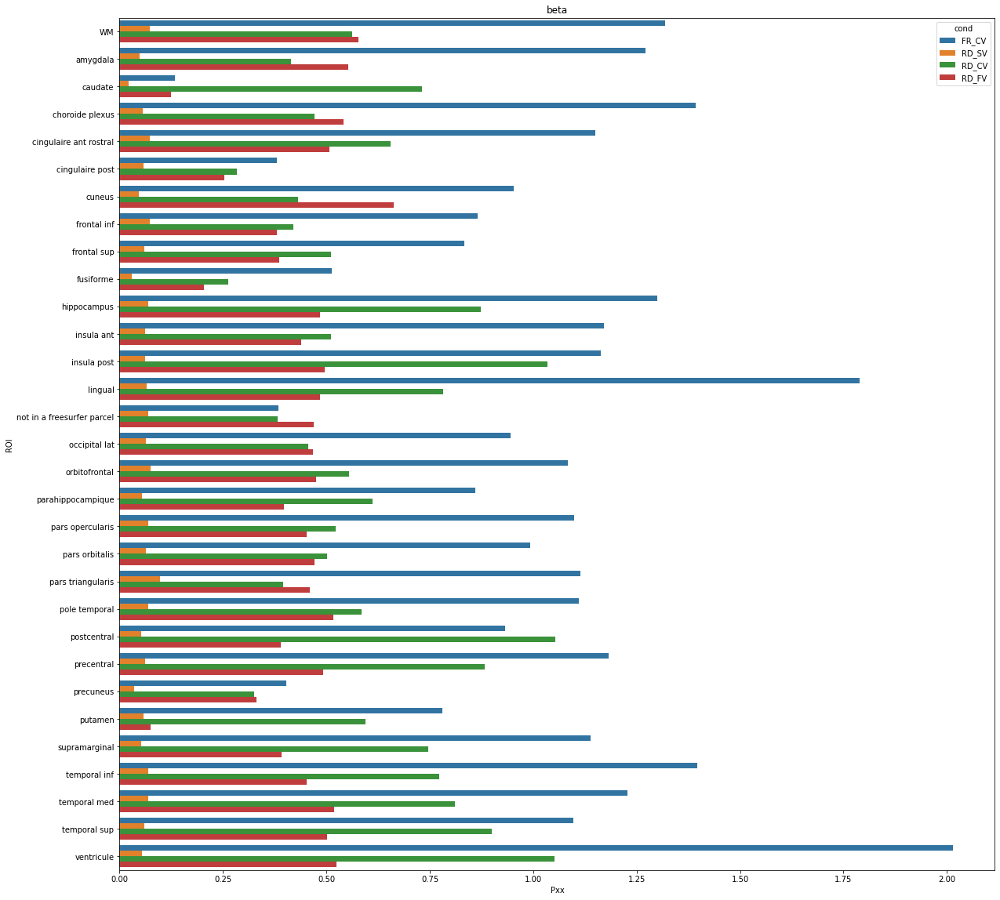

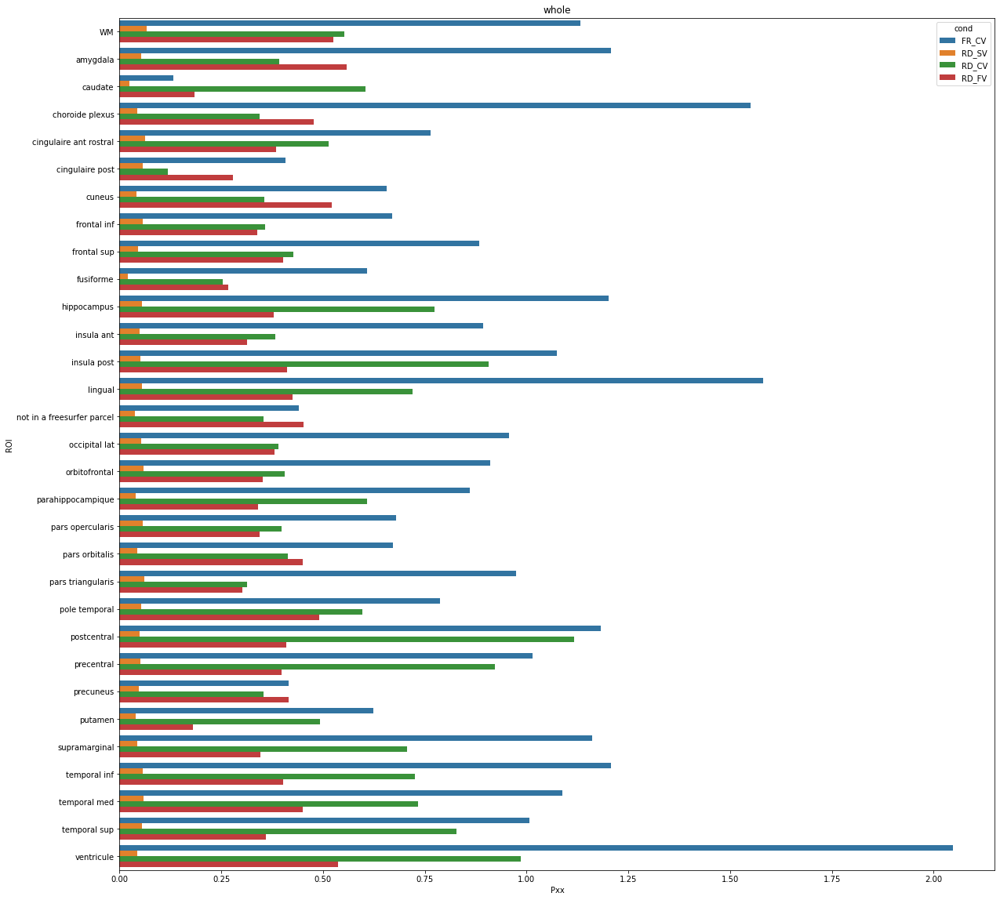

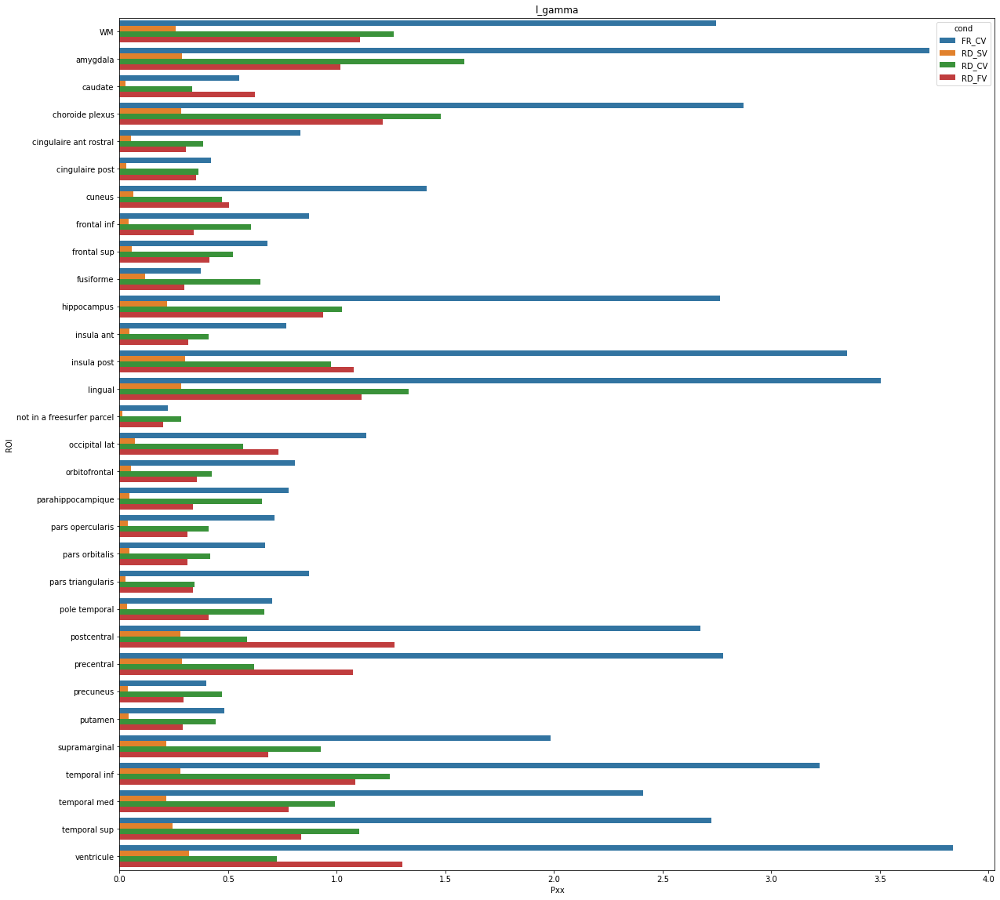

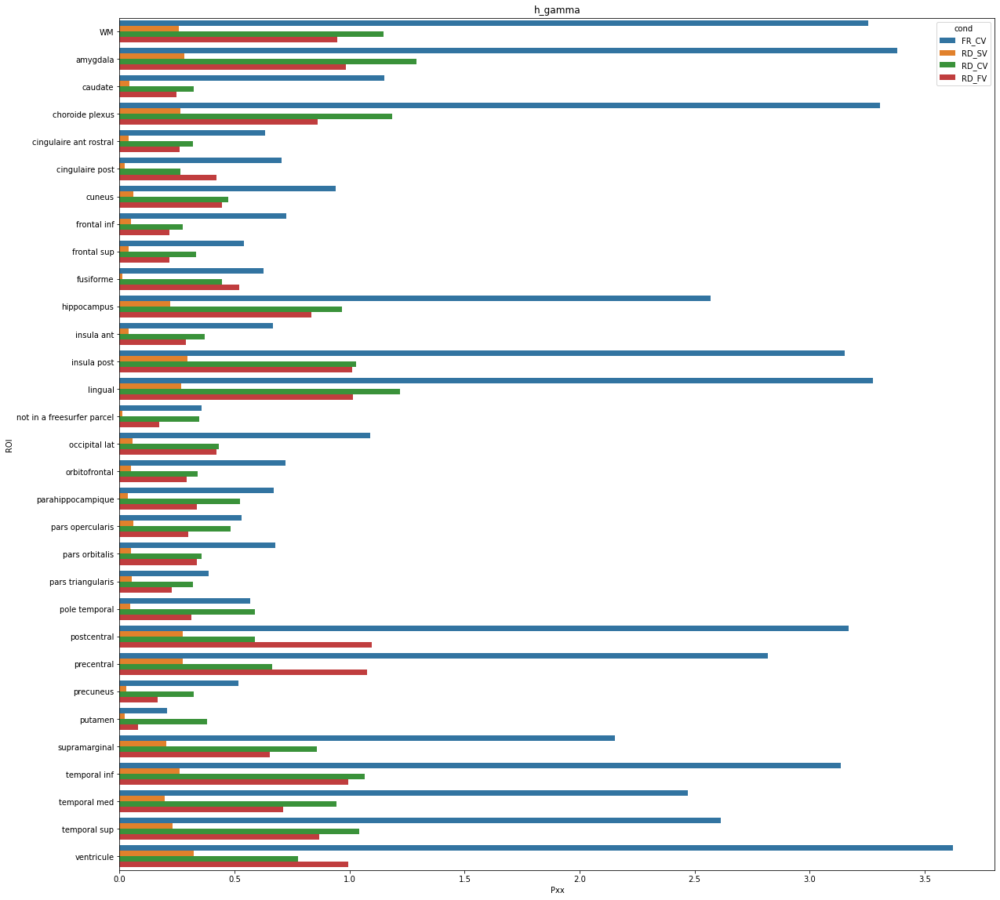

In [ ]:

for band in df_ITPC_all['band'].unique():
    fig, ax = plt.subplots(figsize = (20,20))
    sns.barplot(data=df_ITPC_all[df_ITPC_all['band'] == band].groupby(['cond','ROI']).std().reset_index(), y='ROI', x = 'Pxx', hue = 'cond', orient = 'h', ax=ax, hue_order = ['FR_CV','RD_SV','RD_CV','RD_FV'])
    # ax.bar_label(container=ax.containers[0], labels=mapper_n_rois.values())
    ax.set_title(band)
    plt.show()

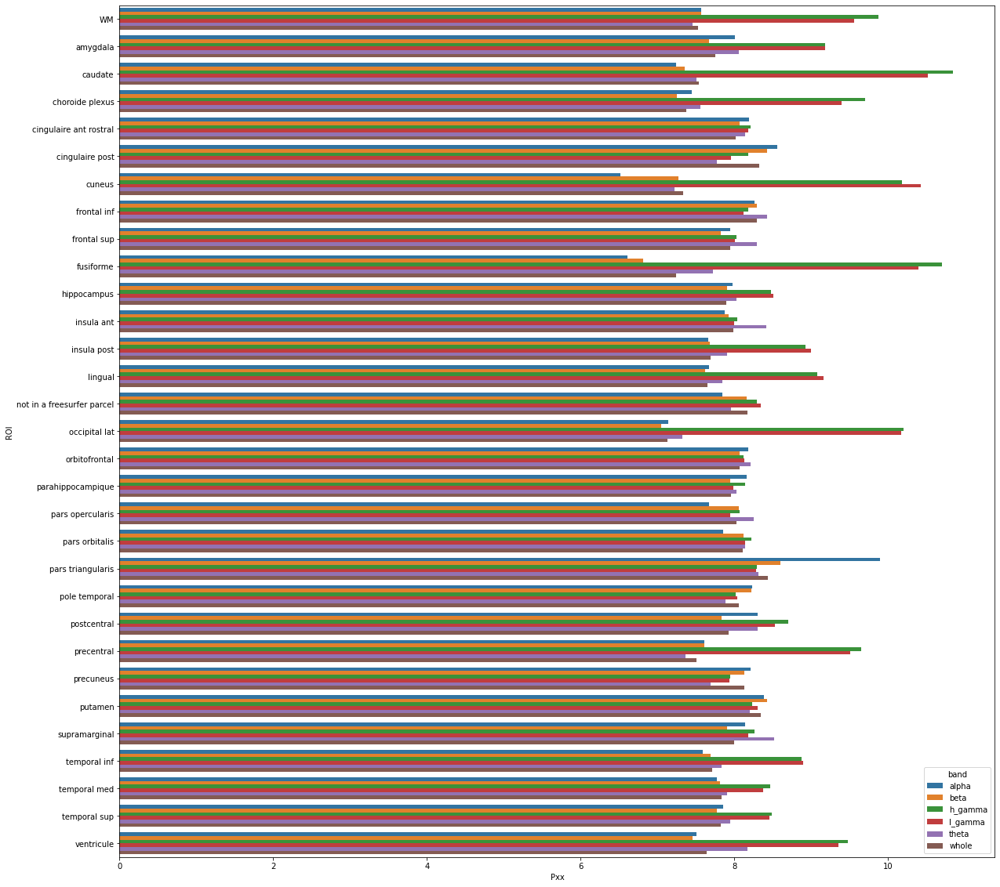

In [ ]:
fig, ax = plt.subplots(figsize = (20,20))
sns.barplot(data=df_ITPC_all.groupby(['band','ROI']).std().reset_index(), y='ROI', x = 'Pxx', hue = 'band', orient = 'h', ax=ax)
# ax.bar_label(container=ax.containers[0], labels=mapper_n_rois.values())
plt.show()

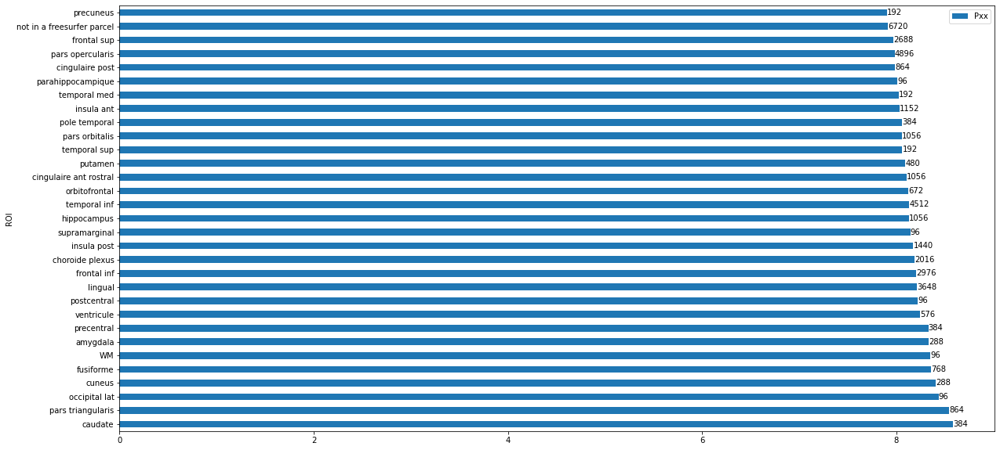

In [ ]:
fig, ax = plt.subplots(figsize =(20,10))
df_ITPC_all.groupby('ROI').std().sort_values('Pxx', ascending = False).plot.barh(ax=ax)
ax.bar_label(container=ax.containers[0], labels=mapper_n_rois.values())
plt.show()

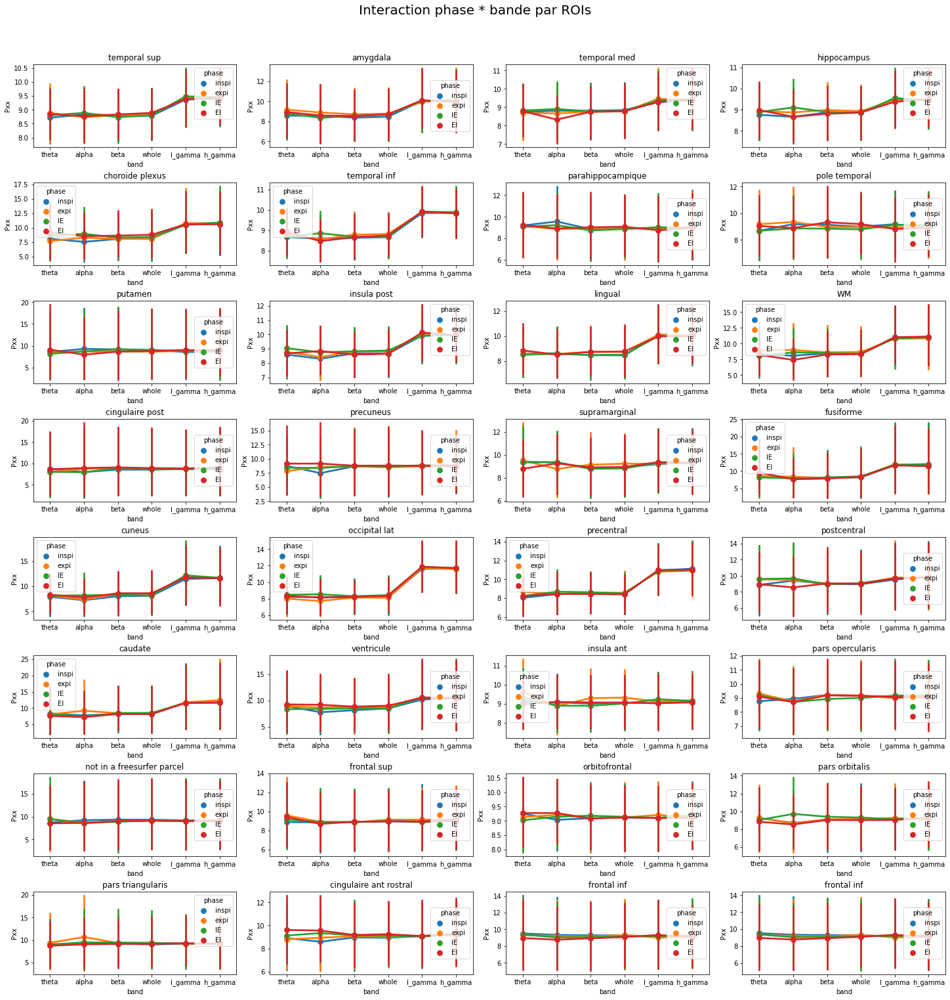

In [ ]:
rois_to_test = np.append(df_ITPC_all['ROI'].unique(), df_ITPC_all['ROI'].unique()[-1])
rois_to_test = rois_to_test.reshape(8,4)
fig, axs = plt.subplots(nrows = 8, ncols = 4, figsize = (20,20), constrained_layout = True)
fig.suptitle('Interaction phase * bande par ROIs', fontsize = 20, y = 1.05)
for row, sublist in enumerate(rois_to_test):
    for col, roi in enumerate(sublist):
        ax = axs[row,col]
        sns.pointplot(data=df_ITPC_all[df_ITPC_all['ROI'] == roi] , x = 'band', y = 'Pxx', hue = 'phase', kind = 'point',ax=ax)
        ax.set_title(roi)


## FR CV

In [ ]:
df_ITPC_FR_CV = df_ITPC.query("cond == 'FR_CV'")

<AxesSubplot:title={'center':'Effect of phase on Pxx : ns \n N = 15 subjects * 4 groups (*1 trial/group) \n friedman : p-0.3795'}, xlabel='phase', ylabel='Pxx'>

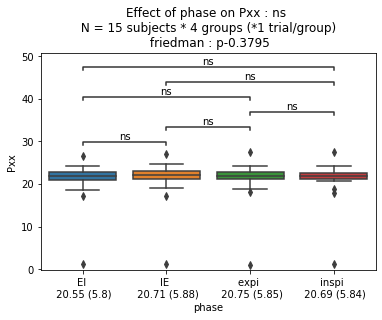

In [ ]:
auto_stats(df=df_ITPC_FR_CV.groupby(['sujet','phase']).mean().reset_index(), predictor = 'phase', outcome = 'Pxx', subject ='sujet', transform = False)

/home/valentin.ghibaudo/.virtualenvs/py38_nodegpu/lib/python3.8/site-packages/pingouin/distribution.py:486: UserWarning: Epsilon values might be innaccurate in two-way repeated measures design where each  factor has more than 2 levels. Please  double-check your results.
  warnings.warn(


<AxesSubplot:title={'center':'Effect of band * phase on Pxx : ns \n rm_anova : pcorr-0.247, np2 : 0.095 (M) \n p-band-0.423 , p-phase-0.237'}, xlabel='band', ylabel='Pxx'>

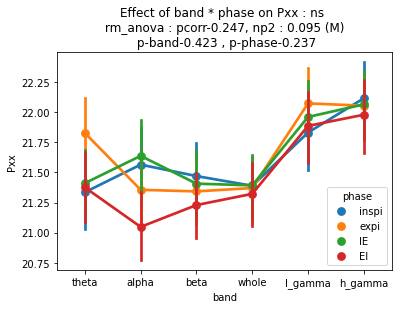

In [ ]:
auto_stats(df=df_ITPC_FR_CV, predictor = ['band','phase'], outcome = outcome, subject = 'sujet', design = 'within')

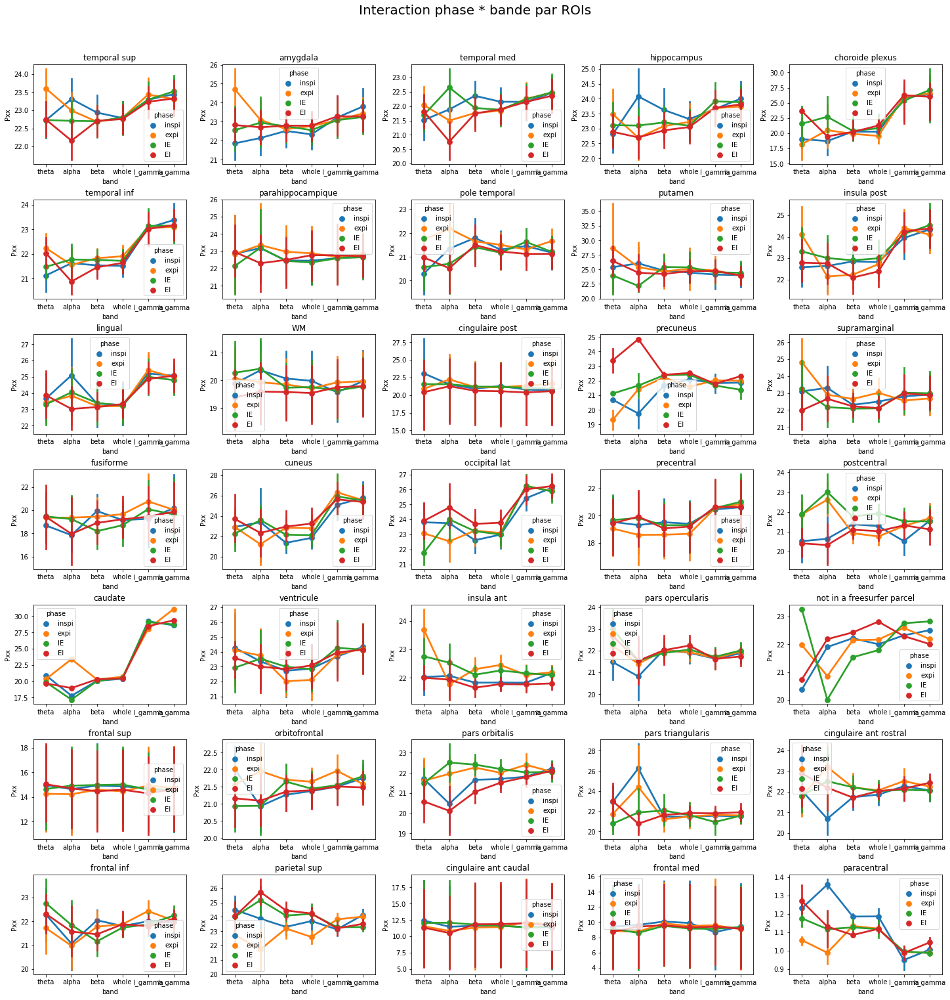

In [ ]:
rois_to_test = df_ITPC_FR_CV['ROI'].unique()
rois_to_test = rois_to_test.reshape(7,5)
fig, axs = plt.subplots(nrows = 7, ncols = 5, figsize = (20,20), constrained_layout = True)
fig.suptitle('Interaction phase * bande par ROIs', fontsize = 20, y = 1.05)
for row, sublist in enumerate(rois_to_test):
    for col, roi in enumerate(sublist):
        ax = axs[row,col]
        sns.pointplot(data=df_ITPC_FR_CV[df_ITPC_FR_CV['ROI'] == roi] , x = 'band', y = 'Pxx', hue = 'phase', kind = 'point',ax=ax)
        ax.set_title(roi)

# EVALUATIONS PYSCHO

In [ ]:
df_psycho = pd.read_excel('../../NBuonviso2021_respi_ieeg_jules_valentin/psycho/CotationPsychoiEEG.xlsx').drop(columns = 'Subject')

In [ ]:
df_psycho

,Name,FreqConf,DiffConf,DiffFreqTarget,Condition,Order,Difficulty,Relaxation,Stress,Fatigue,Attention
0,TREt,0.20,0.05,0.0003,RD_SV,2,12,49,66,88,89
1,TREt,0.20,0.00,0.0035,RD_CV,1,5,49,69,83,88
2,TREt,0.20,0.30,0.2584,RD_FV,3,26,46,60,96,93
3,TREt,0.20,0.00,0.0063,RD_AV,4,30,50,50,98,83
4,GOBc,0.28,0.13,0.0090,RD_SV,2,63,48,50,83,45
5,GOBc,0.28,0.00,0.0012,RD_CV,1,64,50,53,73,56
6,GOBc,0.28,0.22,0.0251,RD_FV,3,58,46,54,88,51
7,GOBc,0.28,0.00,0.0115,RD_AV,4,56,50,50,67,46
8,CAPp,0.26,0.11,NaN,RD_SV,2,17,54,47,50,39
9,CAPp,0.26,0.00,NaN,RD_CV,1,1,50,50,50,45


In [ ]:
df_psycho.groupby('Name').mean()

,FreqConf,DiffConf,DiffFreqTarget,Order,Difficulty,Relaxation,Stress,Fatigue,Attention
Name,,,,,,,,,
CAPp,0.26,0.0875,NaN,2.5,6.75,51.25,48.50,50.00,42.00
CHEe,0.28,0.0875,0.022333,2.5,53.00,30.50,22.00,37.25,75.75
GOBc,0.28,0.0875,0.011700,2.5,60.25,48.50,51.75,77.75,49.50
MUGa,0.28,0.0875,NaN,2.5,62.75,57.25,22.00,22.00,45.00
TREt,0.20,0.0875,0.067125,2.5,18.25,48.50,61.25,91.25,88.25


In [ ]:
df_psycho.rcorr()

,FreqConf,DiffConf,DiffFreqTarget,Order,Difficulty,Relaxation,Stress,Fatigue,Attention
FreqConf,-,,,,**,,**,**,**
DiffConf,-0.0,-,*,,,,,,
DiffFreqTarget,-0.34,0.622,-,,,,,,
Order,0.0,0.144,0.174,-,,,,,
Difficulty,0.578,0.063,-0.138,0.246,-,,,,
Relaxation,-0.116,-0.155,-0.056,-0.052,-0.219,-,,,*
Stress,-0.607,0.034,0.132,0.033,-0.308,0.049,-,***,
Fatigue,-0.631,0.054,0.209,0.196,-0.133,-0.055,0.87,-,*
Attention,-0.617,-0.009,0.397,-0.0,-0.009,-0.552,0.267,0.46,-


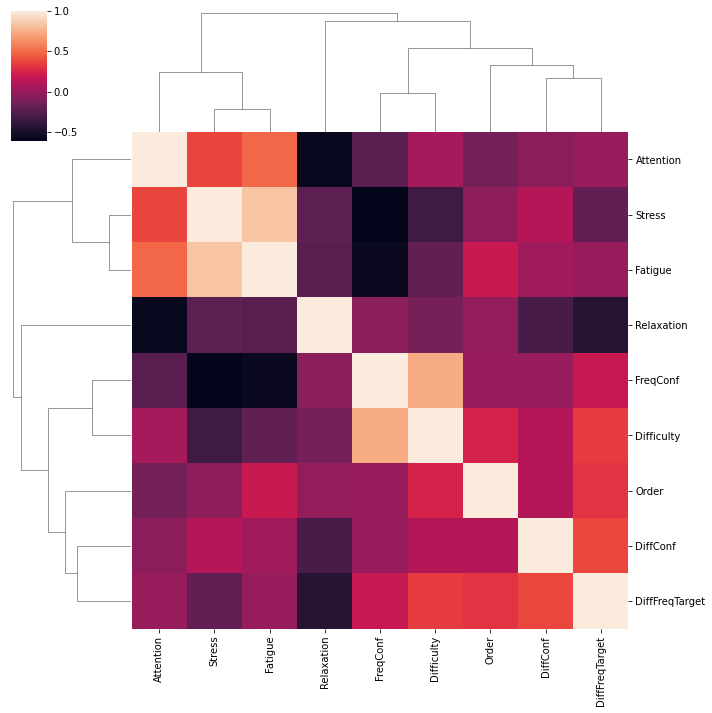

In [ ]:
sns.clustermap(df_psycho.corr('spearman'))

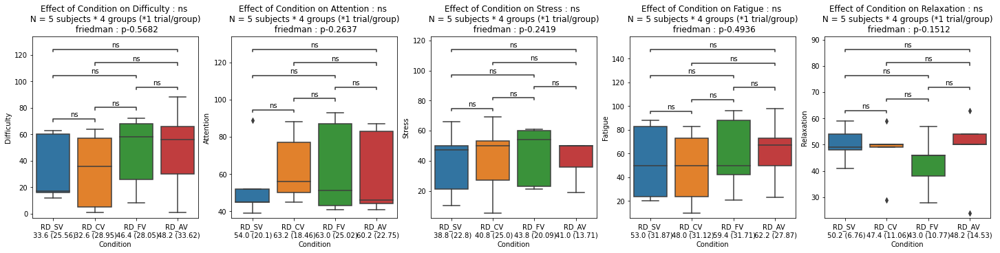

In [ ]:
outcomes = ['Difficulty','Attention','Stress','Fatigue','Relaxation']
fig, axs = plt.subplots(ncols = len(outcomes), figsize = (20,5), constrained_layout =True)
for col, outcome in enumerate(outcomes):
    ax = axs[col]
    auto_stats(df=df_psycho, predictor='Condition',outcome = outcome, subject = 'Name', ax=ax, transform = False)